In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import numpy as np
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.stats import chi2_contingency
import calendar # For ordering months

# Set plot style for better aesthetics
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['legend.fontsize'] = 12

In [2]:
print("Starting Enhanced Exploratory Data Analysis for NYPD Shooting Incidents (Spatio-Temporal Focus)...\n")

# --- 1. Data Loading and Initial Preprocessing ---
# Load the dataset
try:
    df = pd.read_csv("NYPD_cleaned.csv")
    print(f"Dataset loaded successfully. Shape: {df.shape}\n")
except FileNotFoundError:
    print("Error: 'NYPD_Shooting_Incident_Data__Historic_.csv' not found at the specified path.")
    print("Please ensure the CSV file is accessible or provide the correct full path.")
    exit()


Starting Enhanced Exploratory Data Analysis for NYPD Shooting Incidents (Spatio-Temporal Focus)...

Dataset loaded successfully. Shape: (29645, 21)



In [3]:
print("--- Initial Data Information (User-Provided Summary) ---")

print(df.info())

--- Initial Data Information (User-Provided Summary) ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29645 entries, 0 to 29644
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               29645 non-null  int64  
 1   INCIDENT_KEY             29645 non-null  int64  
 2   BORO                     29645 non-null  object 
 3   LOC_OF_OCCUR_DESC        29645 non-null  object 
 4   PRECINCT                 29645 non-null  int64  
 5   JURISDICTION_CODE        29645 non-null  float64
 6   LOC_CLASSFCTN_DESC       29645 non-null  object 
 7   STATISTICAL_MURDER_FLAG  29645 non-null  bool   
 8   PERP_AGE_GROUP           29645 non-null  object 
 9   PERP_SEX                 29645 non-null  object 
 10  PERP_RACE                29645 non-null  object 
 11  VIC_AGE_GROUP            29645 non-null  object 
 12  VIC_SEX                  29645 non-null  object 
 13  VIC_RACE           

In [4]:
# Handle missing values in other key columns:
# Fill highly missing descriptive location columns with 'UNKNOWN_LOCATION_TYPE'
for col in ['LOC_OF_OCCUR_DESC', 'LOC_CLASSFCTN_DESC', 'LOCATION_DESC']:
    if col in df.columns:
        df[col] = df[col].fillna('UNKNOWN_LOCATION_TYPE').replace({'(null)': 'UNKNOWN_LOCATION_TYPE'})

# Fill missing Jurisdiction Code with mode (most frequent)
if 'JURISDICTION_CODE' in df.columns:
    mode_jurisdiction = df['JURISDICTION_CODE'].mode()[0]
    df['JURISDICTION_CODE'] = df['JURISDICTION_CODE'].fillna(mode_jurisdiction)
    print(f"Filled missing JURISDICTION_CODE with mode: {mode_jurisdiction}")

Filled missing JURISDICTION_CODE with mode: 0.0


In [5]:
# Further cleaning for demographic columns (standardizing values)
for col in ['PERP_AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'VIC_AGE_GROUP', 'VIC_SEX', 'VIC_RACE']:
    if col in df.columns:
        # Standardize known 'unknown' values and then fill NaNs
        df[col] = df[col].replace({'UNKNOWN': 'U', 'N/A': 'U', '(null)': 'U',
                                   'ASIAN/PACIFIC ISLANDER': 'ASIAN',
                                   'AMERICAN INDIAN/ALASKAN NATIVE': 'NATIVE AMERICAN'})
        df[col] = df[col].fillna('U') # Fill any remaining NaNs with 'U' for Unknown
        # Consolidate age groups like '1020', '2021', '224', '940', '1028' into 'U' or specific ranges if possible
        # For now, we'll treat numeric-like strings that don't fit age ranges as 'U'
        if 'AGE_GROUP' in col:
            def clean_age_group(age_str):
                if pd.isna(age_str) or age_str in ['U', '<18', '18-24', '25-44', '45-64', '65+']:
                    return age_str
                else:
                    try:
                        # Attempt to convert to int, if it fails or is outside reasonable range, mark as 'U'
                        age_num = int(age_str)
                        if 0 <= age_num <= 17: return '<18'
                        elif 18 <= age_num <= 24: return '18-24'
                        elif 25 <= age_num <= 44: return '25-44'
                        elif 45 <= age_num <= 64: return '45-64'
                        elif age_num >= 65: return '65+'
                        else: return 'U'
                    except ValueError:
                        return 'U'
            df[col] = df[col].apply(clean_age_group)


print("\nMissing values after comprehensive cleaning:")
print(df.isnull().sum()[df.isnull().sum() > 0])


Missing values after comprehensive cleaning:
Series([], dtype: int64)


In [6]:
# --- 2. Enhanced Temporal Analysis ---
print("\n--- Enhanced Temporal Analysis ---")
df['OCCUR_DATETIME'] = pd.to_datetime(df['OCCUR_DATETIME'], errors='coerce')

df['YEAR'] = df['OCCUR_DATETIME'].dt.year
df['MONTH'] = df['OCCUR_DATETIME'].dt.month_name()
df['DAY_OF_WEEK'] = df['OCCUR_DATETIME'].dt.day_name()
df['HOUR'] = df['OCCUR_DATETIME'].dt.hour
df['DATE'] = df['OCCUR_DATETIME'].dt.date # For daily aggregation


# Dynamically set the title based on the actual data range
min_year = df['YEAR'].min()
max_year = df['YEAR'].max()



--- Enhanced Temporal Analysis ---


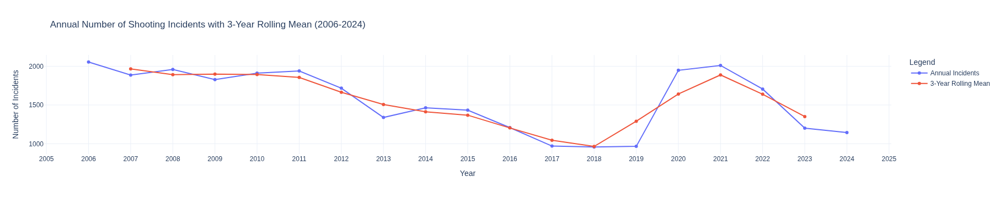

In [7]:
import plotly.express as px
import pandas as pd

# Prepare data
annual_counts = df['YEAR'].value_counts().sort_index()
rolling_mean = annual_counts.rolling(window=3, center=True).mean()

# Create dataframe for plotting
plot_df = pd.DataFrame({
    'Year': annual_counts.index,
    'Annual Incidents': annual_counts.values,
    '3-Year Rolling Mean': rolling_mean.values
})

# Create interactive line plot
fig = px.line(
    plot_df,
    x='Year',
    y=['Annual Incidents', '3-Year Rolling Mean'],
    title='Annual Number of Shooting Incidents with 3-Year Rolling Mean (2006-2024)',
    labels={'value': 'Number of Incidents', 'variable': 'Legend'},
    markers=True
)

# Update layout (no range slider)
fig.update_layout(
    template='plotly_white',
    hovermode='x unified',
    xaxis=dict(showspikes=True, tickmode='linear'),  # cleaner x-axis
    yaxis=dict(showspikes=True)
)

fig.show()


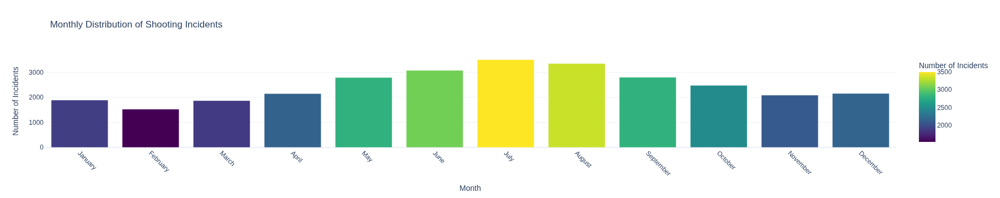

In [8]:
import plotly.express as px
import calendar
import pandas as pd

# Prepare month order and counts
month_order = [calendar.month_name[i] for i in range(1, 13)]
monthly_counts = df['MONTH'].value_counts().reindex(month_order)

# Create dataframe for plotting
plot_df = pd.DataFrame({
    'Month': monthly_counts.index,
    'Number of Incidents': monthly_counts.values
})

# Create interactive bar chart
fig = px.bar(
    plot_df,
    x='Month',
    y='Number of Incidents',
    title='Monthly Distribution of Shooting Incidents',
    labels={'Number of Incidents': 'Number of Incidents'},
    color='Number of Incidents',
    color_continuous_scale='viridis'
)

# Update layout for cleaner visualization
fig.update_layout(
    template='plotly_white',
    xaxis=dict(tickangle=45),
    hovermode='x unified'
)

fig.show()


Displayed: Diurnal Distribution of Shooting Incidents, revealing peak hours of activity.



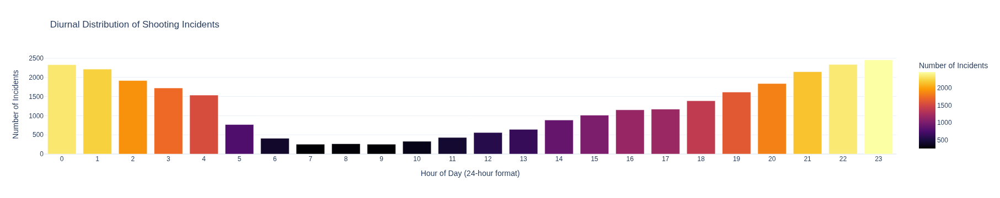

In [9]:
print("Displayed: Diurnal Distribution of Shooting Incidents, revealing peak hours of activity.\n")


# Prepare hourly counts
hourly_counts = df['HOUR'].value_counts().reindex(range(24), fill_value=0)

# Create dataframe for plotting
plot_df = pd.DataFrame({
    'Hour': hourly_counts.index,
    'Number of Incidents': hourly_counts.values
})

# Create interactive bar chart
fig = px.bar(
    plot_df,
    x='Hour',
    y='Number of Incidents',
    title='Diurnal Distribution of Shooting Incidents',
    labels={'Hour': 'Hour of Day (24-hour format)', 'Number of Incidents': 'Number of Incidents'},
    color='Number of Incidents',
    color_continuous_scale='inferno'   # FIXED: use a supported colorscale
)

# Update layout for cleaner visualization
fig.update_layout(
    template='plotly_white',
    xaxis=dict(
        tickmode='linear',
        tick0=0,
        dtick=1
    ),
    hovermode='x unified'
)

fig.show()


Displayed: Number of Shooting Incidents by Borough, revealing disparities across NYC's administrative divisions.



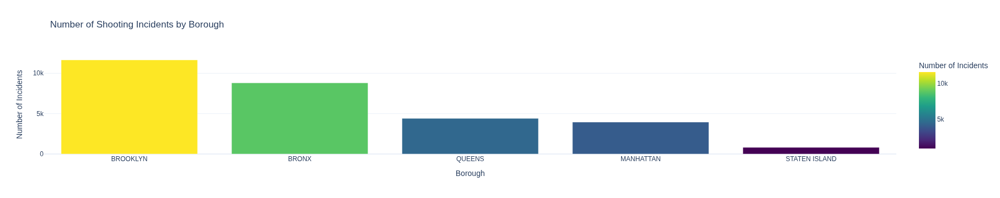

In [10]:

print("Displayed: Number of Shooting Incidents by Borough, revealing disparities across NYC's administrative divisions.\n")
# Prepare borough counts
borough_counts = df['BORO'].value_counts()
plot_df = pd.DataFrame({
    'Borough': borough_counts.index,
    'Number of Incidents': borough_counts.values
})

# Create interactive bar chart
fig = px.bar(
    plot_df,
    x='Borough',
    y='Number of Incidents',
    title='Number of Shooting Incidents by Borough',
    labels={'Number of Incidents': 'Number of Incidents', 'Borough': 'Borough'},
    color='Number of Incidents',
    color_continuous_scale='Viridis'
)

# Update layout
fig.update_layout(
    template='plotly_white',
    hovermode='x',
    xaxis_title='Borough',
    yaxis_title='Number of Incidents'
)

fig.show()


In [11]:

print("\n--- Enhanced Spatial Analysis ---")

# Filter out potential invalid coordinates (e.g., 0,0 or outside NYC bounds)
# Approximate NYC bounds for robustness
nyc_lat_min, nyc_lat_max = 40.47, 40.92
nyc_lon_min, nyc_lon_max = -74.27, -73.69
df_geo = df[(df['Latitude'] >= nyc_lat_min) & (df['Latitude'] <= nyc_lat_max) &
            (df['Longitude'] >= nyc_lon_min) & (df['Longitude'] <= nyc_lon_max)].copy()

print(f"Filtered for valid NYC coordinates. Remaining incidents: {df_geo.shape[0]}\n")


--- Enhanced Spatial Analysis ---
Filtered for valid NYC coordinates. Remaining incidents: 29645



In [12]:
# --- Shooting Trends per Borough Over Time ---

import plotly.express as px

print("\n--- Shooting Trends per Borough Over Time ---")

# Prepare data: group by YEAR and BORO
boro_yearly_trend = df_geo.groupby(['YEAR', 'BORO']).size().reset_index(name='Number of Incidents')

# Sort values for consistent line plotting
boro_yearly_trend = boro_yearly_trend.sort_values(by=['BORO', 'YEAR'])

# Create interactive line chart
fig = px.line(
    boro_yearly_trend,
    x='YEAR',
    y='Number of Incidents',
    color='BORO',
    markers=True,
    title='Shooting Trends per Borough Over Time',
    labels={'YEAR': 'Year', 'Number of Incidents': 'Number of Shooting Incidents', 'BORO': 'Borough'},
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Update layout for better readability
fig.update_layout(
    template='plotly_white',
    hovermode='x unified',
    xaxis=dict(dtick=1),
    yaxis=dict(title='Number of Shooting Incidents'),
    legend_title_text='Borough'
)

fig.show()



--- Shooting Trends per Borough Over Time ---


In [13]:
import plotly.graph_objects as go
import pandas as pd

print("\n--- Enhanced Demographic Analysis ---")

age_order = ['<18', '18-24', '25-44', '45-64', '65+']  # 'U' for Unknown

# Prepare counts
perp_counts = df['PERP_AGE_GROUP'].value_counts().reindex(age_order, fill_value=0)
vic_counts = df['VIC_AGE_GROUP'].value_counts().reindex(age_order, fill_value=0)

# Create interactive bar chart
fig = go.Figure()

# Perpetrator age distribution
fig.add_trace(go.Bar(
    x=age_order,
    y=perp_counts.values,
    name='Perpetrators',
    marker_color='steelblue'
))

# Victim age distribution
fig.add_trace(go.Bar(
    x=age_order,
    y=vic_counts.values,
    name='Victims',
    marker_color='seagreen'
))

# Update layout
fig.update_layout(
    title='Perpetrator and Victim Age Group Distributions',
    xaxis_title='Age Group',
    yaxis_title='Number of Incidents',
    barmode='group',  # side-by-side bars
    template='plotly_white',
    hovermode='x unified'
)

fig.show()
print("Displayed: Perpetrator and Victim Age Group Distributions interactively.\n")



--- Enhanced Demographic Analysis ---


Displayed: Perpetrator and Victim Age Group Distributions interactively.




--- Cross Tabulation + Heatmap: Perpetrator vs Victim Age Groups ---

Cross Tabulation Table:
VIC_AGE_GROUP   <18  18-24  25-44  45-64  65+
PERP_AGE_GROUP                               
<18             561    665    453     89   23
18-24           824   2892   2476    355   50
25-44           284   1619   3760    568   52
45-64            22     90    416    221   18
65+               0      4     29     25   13


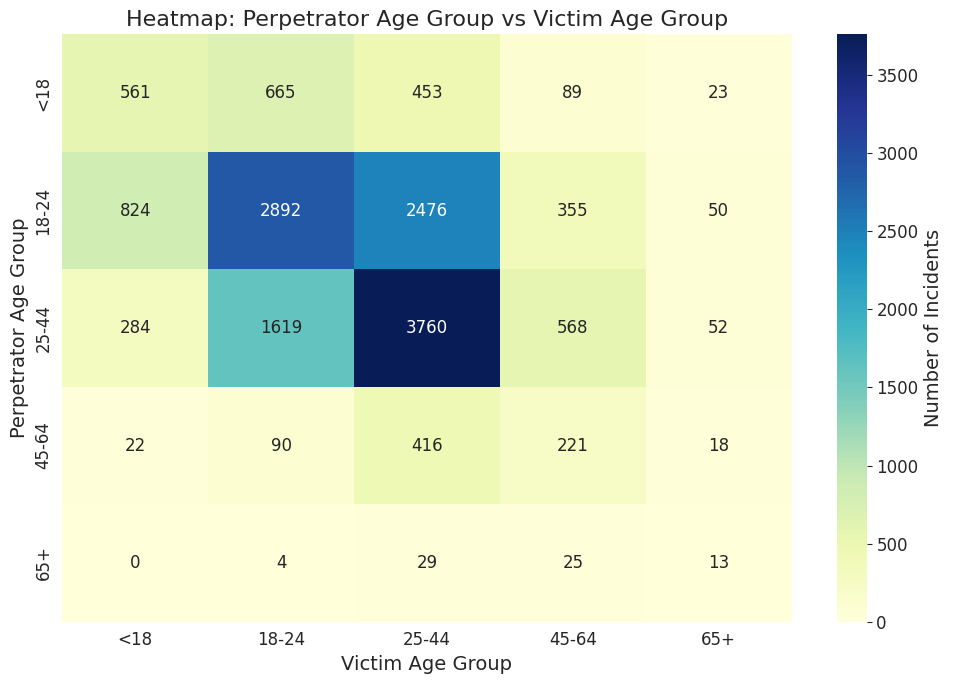

In [14]:
# --- Cross Tabulation + Heatmap: Perpetrator Age Group vs Victim Age Group ---

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

print("\n--- Cross Tabulation + Heatmap: Perpetrator vs Victim Age Groups ---")

# Filter out unknown ages
df_age_groups = df[(df['PERP_AGE_GROUP'] != 'U') & (df['VIC_AGE_GROUP'] != 'U')]

# Define consistent age order
age_order = ['<18', '18-24', '25-44', '45-64', '65+']

# Create cross-tabulation (frequency counts)
age_crosstab = pd.crosstab(
    index=df_age_groups['PERP_AGE_GROUP'],
    columns=df_age_groups['VIC_AGE_GROUP']
).reindex(index=age_order, columns=age_order, fill_value=0)

print("\nCross Tabulation Table:")
print(age_crosstab)

# --- Heatmap Visualization ---
plt.figure(figsize=(10, 7))
sns.heatmap(
    age_crosstab,
    annot=True,           # Show counts in cells
    fmt="d",              # Integer formatting
    cmap="YlGnBu",        # Color palette
    cbar_kws={'label': 'Number of Incidents'}
)
plt.title("Heatmap: Perpetrator Age Group vs Victim Age Group")
plt.xlabel("Victim Age Group")
plt.ylabel("Perpetrator Age Group")
plt.tight_layout()
plt.show()



--- Victim vs Perpetrator Ratio and Proportion Analysis ---

Overall Victim vs Perpetrator Ratio Table:
       Victim Count  Perpetrator Count  Victim-to-Perp Ratio
<18            1691               1791              0.944165
18-24          5270               6597              0.798848
25-44          7134               6283              1.135445
45-64          1258                767              1.640156
65+             156                 71              2.197183


/tmp/ipykernel_29775/3454857430.py:34: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




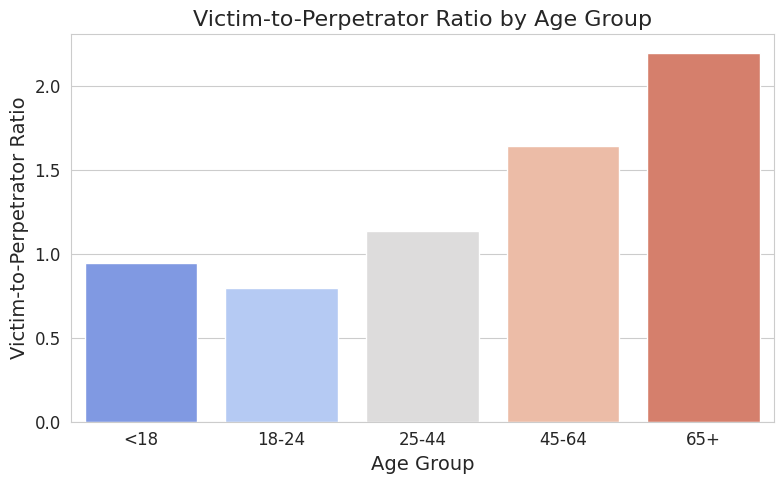


Proportion Matrix (Victim Age Distribution per Perpetrator Age Group):
VIC_AGE_GROUP     <18  18-24  25-44  45-64    65+
PERP_AGE_GROUP                                   
<18             0.313  0.371  0.253  0.050  0.013
18-24           0.125  0.438  0.375  0.054  0.008
25-44           0.045  0.258  0.598  0.090  0.008
45-64           0.029  0.117  0.542  0.288  0.023
65+             0.000  0.056  0.408  0.352  0.183


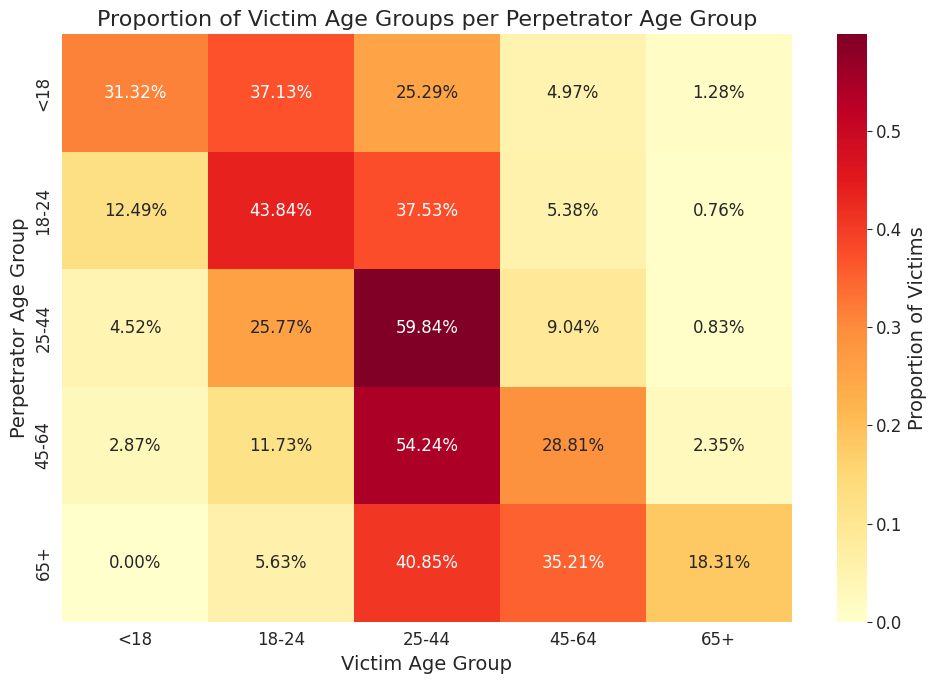

In [15]:
# --- Ratio & Proportion Analysis: Victim vs Perpetrator Age Groups ---

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

print("\n--- Victim vs Perpetrator Ratio and Proportion Analysis ---")

# Filter out unknown ages
df_age_groups = df[(df['PERP_AGE_GROUP'] != 'U') & (df['VIC_AGE_GROUP'] != 'U')]

# Define consistent age order
age_order = ['<18', '18-24', '25-44', '45-64', '65+']

# --- 1. Overall Ratio of Victims to Perpetrators ---
victim_counts = df_age_groups['VIC_AGE_GROUP'].value_counts().reindex(age_order, fill_value=0)
perp_counts   = df_age_groups['PERP_AGE_GROUP'].value_counts().reindex(age_order, fill_value=0)

# Compute ratio
age_ratio = (victim_counts / perp_counts).replace([np.inf, -np.inf], np.nan).fillna(0)

# Combine into summary table
ratio_df = pd.DataFrame({
    'Victim Count': victim_counts,
    'Perpetrator Count': perp_counts,
    'Victim-to-Perp Ratio': age_ratio
})

print("\nOverall Victim vs Perpetrator Ratio Table:")
print(ratio_df)

# Plot ratio as bar chart
plt.figure(figsize=(8,5))
sns.barplot(
    x=ratio_df.index,
    y=ratio_df['Victim-to-Perp Ratio'],
    palette="coolwarm"
)
plt.title("Victim-to-Perpetrator Ratio by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Victim-to-Perpetrator Ratio")
plt.tight_layout()
plt.show()

# --- 2. Cross Proportion Matrix (Victim vs Perpetrator) ---
age_crosstab = pd.crosstab(
    index=df_age_groups['PERP_AGE_GROUP'],
    columns=df_age_groups['VIC_AGE_GROUP']
).reindex(index=age_order, columns=age_order, fill_value=0)

# Normalize by row (per perpetrator age group)
age_proportion_matrix = age_crosstab.div(age_crosstab.sum(axis=1), axis=0)

print("\nProportion Matrix (Victim Age Distribution per Perpetrator Age Group):")
print(age_proportion_matrix.round(3))

# Heatmap for proportions
plt.figure(figsize=(10,7))
sns.heatmap(
    age_proportion_matrix,
    annot=True,
    fmt=".2%",
    cmap="YlOrRd",
    cbar_kws={'label': 'Proportion of Victims'}
)
plt.title("Proportion of Victim Age Groups per Perpetrator Age Group")
plt.xlabel("Victim Age Group")
plt.ylabel("Perpetrator Age Group")
plt.tight_layout()
plt.show()


In [16]:
import plotly.graph_objects as go
import pandas as pd

print("\n--- Demographic Analysis: Race ---")

# Order by frequency for perpetrators, exclude 'U'
perp_race_order = df['PERP_RACE'].value_counts().drop('U', errors='ignore').index.tolist()

# Prepare counts, excluding 'U'
perp_counts = df['PERP_RACE'].value_counts().reindex(perp_race_order, fill_value=0)
vic_counts = df['VIC_RACE'].value_counts().reindex(perp_race_order, fill_value=0)

# Create interactive bar chart
fig = go.Figure()

# Perpetrator race distribution
fig.add_trace(go.Bar(
    x=perp_race_order,
    y=perp_counts.values,
    name='Perpetrators',
    marker_color='steelblue'
))

# Victim race distribution
fig.add_trace(go.Bar(
    x=perp_race_order,
    y=vic_counts.values,
    name='Victims',
    marker_color='seagreen'
))

# Update layout
fig.update_layout(
    title='Perpetrator and Victim Race Distributions',
    xaxis_title='Race',
    yaxis_title='Number of Incidents',
    barmode='group',  # side-by-side bars
    template='plotly_white',
    xaxis_tickangle=45,
    hovermode='x unified'
)

fig.show()
print("Displayed: Perpetrator and Victim Race Distributions interactively (excluding 'U').\n")


--- Demographic Analysis: Race ---


Displayed: Perpetrator and Victim Race Distributions interactively (excluding 'U').




--- Cross-Tabulation and Statistical Test: Perpetrator Race vs. Victim Race ---
Contingency Table (Perpetrator Race vs. Victim Race, excluding Unknowns):
VIC_RACE                  ASIAN / PACIFIC ISLANDER  BLACK  BLACK HISPANIC  \
PERP_RACE                                                                   
ASIAN / PACIFIC ISLANDER                        69     61              14   
BLACK                                          174   9703             859   
BLACK HISPANIC                                  24    587             398   
NATIVE AMERICAN                                  0      2               0   
WHITE                                           13     45              23   
WHITE HISPANIC                                  47    901             472   

VIC_RACE                  NATIVE AMERICAN  WHITE  WHITE HISPANIC  
PERP_RACE                                                         
ASIAN / PACIFIC ISLANDER                0     12              28  
BLACK                      

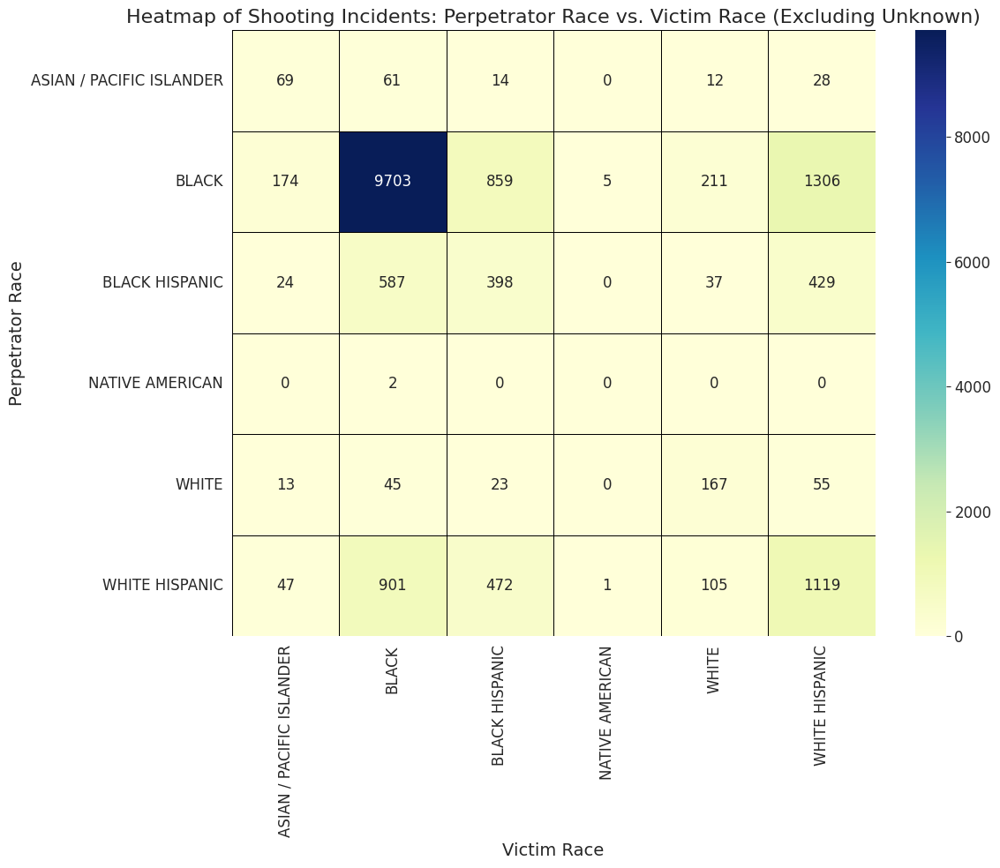

Displayed: Heatmap for Perpetrator Race vs. Victim Race, highlighting interaction patterns.


Chi-squared Test for Independence (Perpetrator Race vs. Victim Race):
Chi-squared Statistic: 6977.22
P-value: 0.000e+00
Degrees of Freedom: 25
Conclusion: There is a statistically significant association between perpetrator race and victim race.
This confirms whether the observed co-occurrence patterns are statistically meaningful or due to chance.



In [17]:
# c. Cross-Tabulation and Chi-squared Test: Perpetrator Race vs. Victim Race
print("\n--- Cross-Tabulation and Statistical Test: Perpetrator Race vs. Victim Race ---")
perp_vic_race_crosstab = pd.crosstab(df['PERP_RACE'], df['VIC_RACE'])

# Remove 'U' from crosstab for chi-squared test to focus on known demographics
perp_vic_race_crosstab_filtered = perp_vic_race_crosstab.drop(index='U', columns='U', errors='ignore')

print("Contingency Table (Perpetrator Race vs. Victim Race, excluding Unknowns):")
print(perp_vic_race_crosstab_filtered)

plt.figure(figsize=(12, 10))
sns.heatmap(perp_vic_race_crosstab_filtered, annot=True, fmt='d', cmap='YlGnBu', linewidths=.5, linecolor='black')
plt.title('Heatmap of Shooting Incidents: Perpetrator Race vs. Victim Race (Excluding Unknown)')
plt.xlabel('Victim Race')
plt.ylabel('Perpetrator Race')
plt.tight_layout()
plt.show()
print("Displayed: Heatmap for Perpetrator Race vs. Victim Race, highlighting interaction patterns.\n")

# Perform Chi-squared test for independence
if perp_vic_race_crosstab_filtered.empty or perp_vic_race_crosstab_filtered.shape[0] < 2 or perp_vic_race_crosstab_filtered.shape[1] < 2:
    print("Chi-squared test skipped: Insufficient data in filtered crosstab (e.g., too many 'U' or single category).\n")
else:
    chi2, p_value, dof, expected = chi2_contingency(perp_vic_race_crosstab_filtered)
    print(f"\nChi-squared Test for Independence (Perpetrator Race vs. Victim Race):")
    print(f"Chi-squared Statistic: {chi2:.2f}")
    print(f"P-value: {p_value:.3e}")
    print(f"Degrees of Freedom: {dof}")
    if p_value < 0.05:
        print("Conclusion: There is a statistically significant association between perpetrator race and victim race.")
    else:
        print("Conclusion: There is no statistically significant association between perpetrator race and victim race (at α=0.05).")
    print("This confirms whether the observed co-occurrence patterns are statistically meaningful or due to chance.\n")

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set plot style for better aesthetics
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['legend.fontsize'] = 12

print("Starting analysis of socio-economic factors and crime rates...\n")

Starting analysis of socio-economic factors and crime rates...



In [19]:
# --- 1. Data Loading ---
try:
    # Load the socio-economic dataset
    socio_eco_df = pd.read_csv("NYC_Boroughs_SocioEconomic_2006_2024.csv")
    print(f"Socio-economic dataset loaded. Shape: {socio_eco_df.shape}")

    # Load the NYPD shooting incident dataset.
    # We are using a placeholder file name from the previous analysis.
    # If the user's file has a different name, this will need to be updated.
    nypd_df = pd.read_csv("NYPD_cleaned.csv")
    print(f"NYPD shooting incident dataset loaded. Shape: {nypd_df.shape}\n")

except FileNotFoundError as e:
    print(f"Error: {e}. Please ensure both 'NYC_Boroughs_SocioEconomic_2006_2024.csv' and 'NYPD_Shooting_Incident_Data__Historic_2.csv' are in the correct directory.")
    exit()


Socio-economic dataset loaded. Shape: (95, 6)
NYPD shooting incident dataset loaded. Shape: (29645, 21)



In [20]:
# --- 2. Data Preprocessing and Merging ---

# Preprocess NYPD data to get annual shooting counts by borough
print("Preprocessing and merging datasets...")
# Convert OCCUR_DATE to datetime and extract year
nypd_df['OCCUR_DATETIME'] = pd.to_datetime(nypd_df['OCCUR_DATETIME'], errors='coerce')
nypd_df['Year'] = nypd_df['OCCUR_DATETIME'].dt.year

# Standardize borough names for merging
nypd_df['BORO'] = nypd_df['BORO'].str.title()
# Handle common name discrepancies for Staten Island
nypd_df['BORO'] = nypd_df['BORO'].replace('Staten Island (Richmond)', 'Staten Island')
nypd_df['BORO'] = nypd_df['BORO'].replace('Richmond', 'Staten Island')

# Group by year and borough to get shooting counts
nypd_counts = nypd_df.groupby(['Year', 'BORO']).size().reset_index(name='Shooting_Incidents')
nypd_counts.rename(columns={'BORO': 'Borough'}, inplace=True)

# Merge the two dataframes on 'Year' and 'Borough'
merged_df = pd.merge(socio_eco_df, nypd_counts, on=['Year', 'Borough'], how='left')

# Fill missing shooting incident counts with 0 (for years/boroughs with no incidents)
merged_df['Shooting_Incidents'] = merged_df['Shooting_Incidents'].fillna(0).astype(int)
print("Datasets merged successfully.\n")

Preprocessing and merging datasets...
Datasets merged successfully.



In [21]:
# --- 3. Correlation Analysis ---
print("Calculating correlation matrix...")
# Select relevant columns for correlation analysis
correlation_cols = ['Unemployment_Rate', 'Population', 'Median_Income', 'Poverty_Rate', 'Shooting_Incidents']
correlation_matrix = merged_df[correlation_cols].corr()
print("Correlation Matrix:\n", correlation_matrix)
print("\nKey insights from the correlation matrix:")
print("- A positive correlation (closer to +1) suggests that as one variable increases, the other tends to increase as well.")
print("- A negative correlation (closer to -1) suggests that as one variable increases, the other tends to decrease.")
print("- A value near 0 suggests a weak or non-linear relationship.\n")

Calculating correlation matrix...
Correlation Matrix:
                     Unemployment_Rate  Population  Median_Income  \
Unemployment_Rate            1.000000   -0.026887      -0.449595   
Population                  -0.026887    1.000000      -0.245262   
Median_Income               -0.449595   -0.245262       1.000000   
Poverty_Rate                 0.396335    0.203065      -0.763805   
Shooting_Incidents           0.413082    0.609521      -0.654238   

                    Poverty_Rate  Shooting_Incidents  
Unemployment_Rate       0.396335            0.413082  
Population              0.203065            0.609521  
Median_Income          -0.763805           -0.654238  
Poverty_Rate            1.000000            0.692748  
Shooting_Incidents      0.692748            1.000000  

Key insights from the correlation matrix:
- A positive correlation (closer to +1) suggests that as one variable increases, the other tends to increase as well.
- A negative correlation (closer to -1) sugge

Generating new visualizations for proportions and ratios...
Heatmap of correlations saved as 'correlation_heatmap.png'


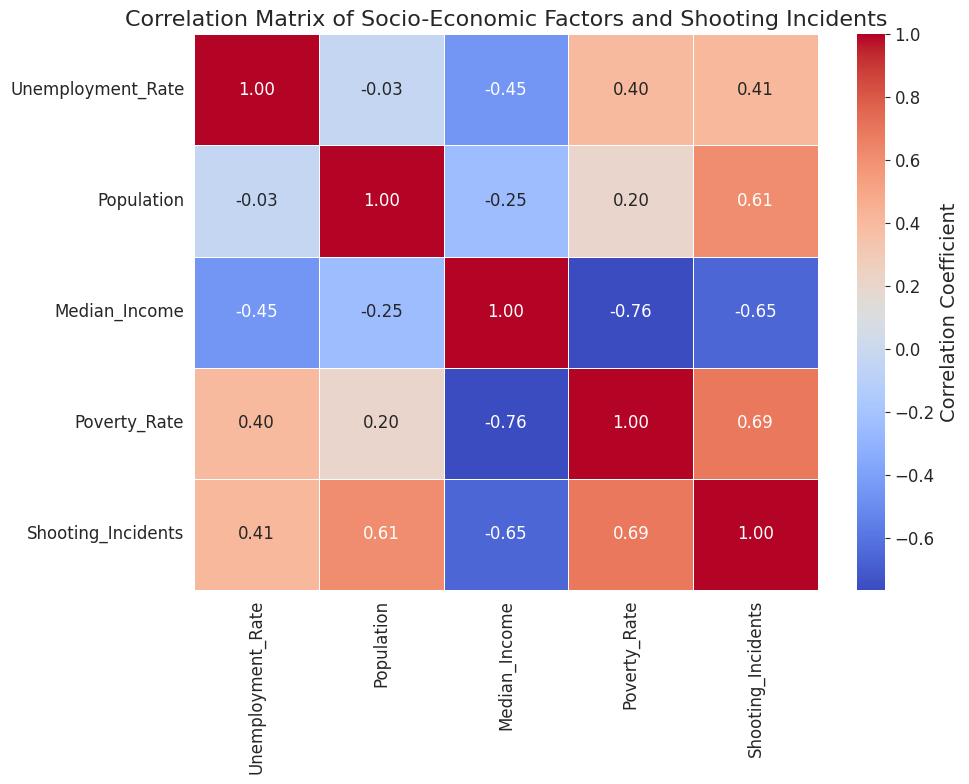

In [22]:
# --- 5. Visualizations ---
print("Generating new visualizations for proportions and ratios...")

# Visualization 1: Heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Correlation Matrix of Socio-Economic Factors and Shooting Incidents')
plt.tight_layout()
# plt.savefig('correlation_heatmap.png')
print("Heatmap of correlations saved as 'correlation_heatmap.png'")

In [23]:
# --- 4. New Analysis: Ratios and Proportions ---
print("\nCalculating and analyzing proportions and ratios...")

# Calculate Shooting Incidents per 100,000 residents
merged_df['Incidents_Per_100k'] = (merged_df['Shooting_Incidents'] / merged_df['Population']) * 100000
print("Incidents per 100k residents calculated.\n")



Calculating and analyzing proportions and ratios...
Incidents per 100k residents calculated.



In [24]:
# Calculate the proportion of total citywide incidents for each borough
total_incidents_by_year = merged_df.groupby('Year')['Shooting_Incidents'].transform('sum')
merged_df['Proportion_of_Total'] = merged_df['Shooting_Incidents'] / total_incidents_by_year
print("Proportion of total citywide incidents for each borough calculated.\n")

Proportion of total citywide incidents for each borough calculated.



Time series plot for The Bronx saved as 'bronx_time_series.png'


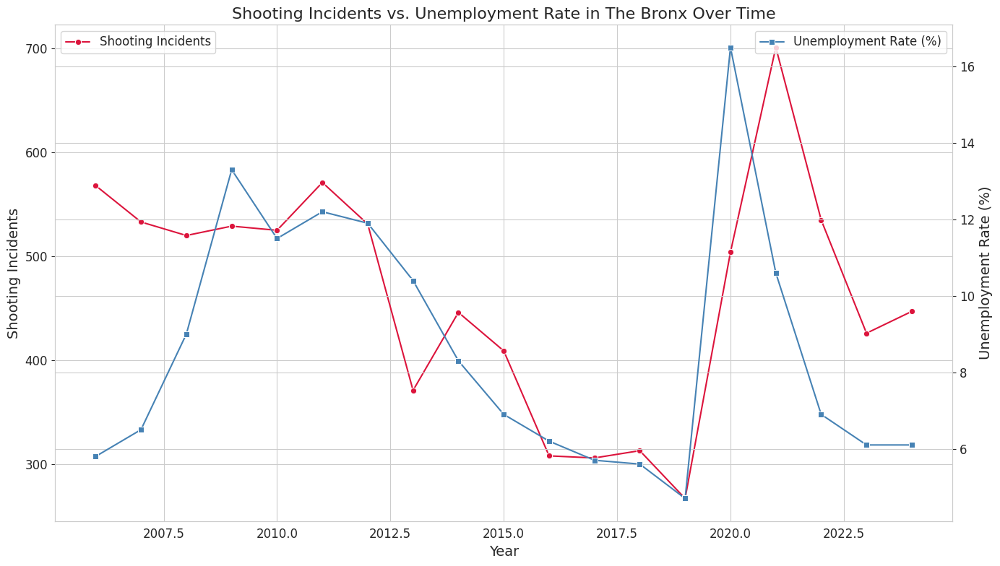

In [25]:
# Visualization 2: Time series plot for a specific borough (e.g., The Bronx)
plt.figure(figsize=(14, 8))
bronx_df = merged_df[merged_df['Borough'] == 'Bronx'].sort_values('Year')
ax1 = sns.lineplot(data=bronx_df, x='Year', y='Shooting_Incidents', marker='o', label='Shooting Incidents', color='crimson')
ax2 = ax1.twinx()
sns.lineplot(data=bronx_df, x='Year', y='Unemployment_Rate', ax=ax2, marker='s', label='Unemployment Rate (%)', color='steelblue')
ax1.set_title('Shooting Incidents vs. Unemployment Rate in The Bronx Over Time')
ax1.set_ylabel('Shooting Incidents')
ax2.set_ylabel('Unemployment Rate (%)')
ax1.set_xlabel('Year')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.tight_layout()
# plt.savefig('bronx_time_series.png')
print("Time series plot for The Bronx saved as 'bronx_time_series.png'")

Scatter plot of poverty vs. incidents per 100k saved as 'poverty_vs_incidents_per_100k.png'


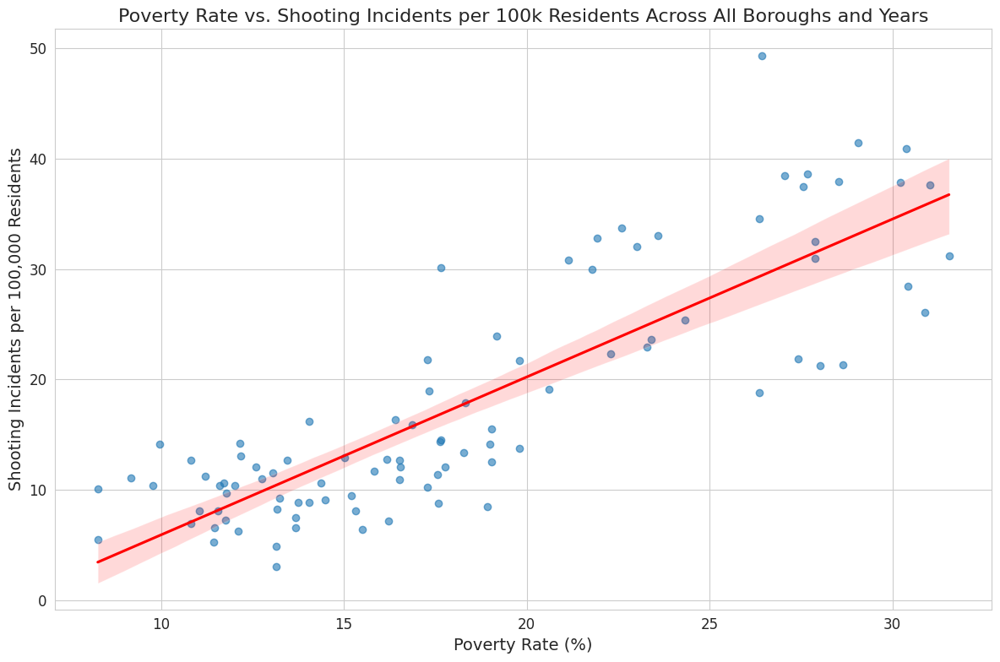

In [26]:
# Visualization 3: Scatter plot of Poverty Rate vs. Incidents per 100k
plt.figure(figsize=(12, 8))
sns.regplot(data=merged_df, x='Poverty_Rate', y='Incidents_Per_100k', scatter_kws={'alpha': 0.6}, line_kws={'color': 'red'})
plt.title('Poverty Rate vs. Shooting Incidents per 100k Residents Across All Boroughs and Years')
plt.xlabel('Poverty Rate (%)')
plt.ylabel('Shooting Incidents per 100,000 Residents')
plt.tight_layout()
# plt.savefig('poverty_vs_incidents_per_100k.png')
print("Scatter plot of poverty vs. incidents per 100k saved as 'poverty_vs_incidents_per_100k.png'")


Stacked area chart of borough proportions saved as 'borough_proportions.png'


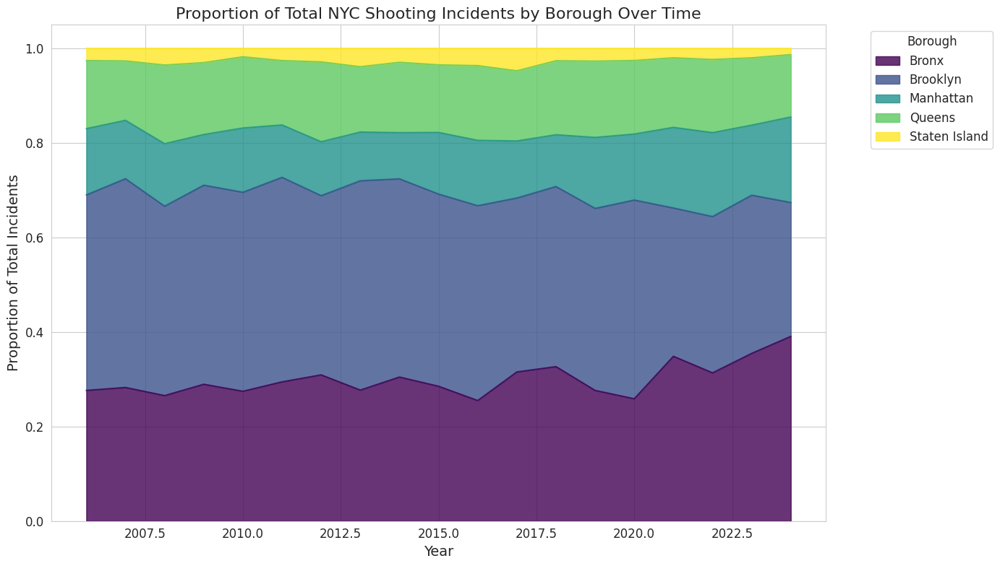

In [27]:
# Visualization 4: Stacked area chart showing proportion of total incidents per borough
plt.figure(figsize=(14, 8))
borough_proportions = merged_df.pivot_table(index='Year', columns='Borough', values='Proportion_of_Total', aggfunc='sum')
borough_proportions.plot(kind='area', stacked=True, alpha=0.8, colormap='viridis', ax=plt.gca())
plt.title('Proportion of Total NYC Shooting Incidents by Borough Over Time')
plt.xlabel('Year')
plt.ylabel('Proportion of Total Incidents')
plt.legend(title='Borough', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
# plt.savefig('borough_proportions.png')
print("Stacked area chart of borough proportions saved as 'borough_proportions.png'")

Generating new bar chart for per capita incident comparison...
Comparing per capita incidents for the latest year: 2024
Bar chart of per capita incidents saved as 'incidents_per_capita_latest_year.png'


/tmp/ipykernel_29775/3705757245.py:11: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




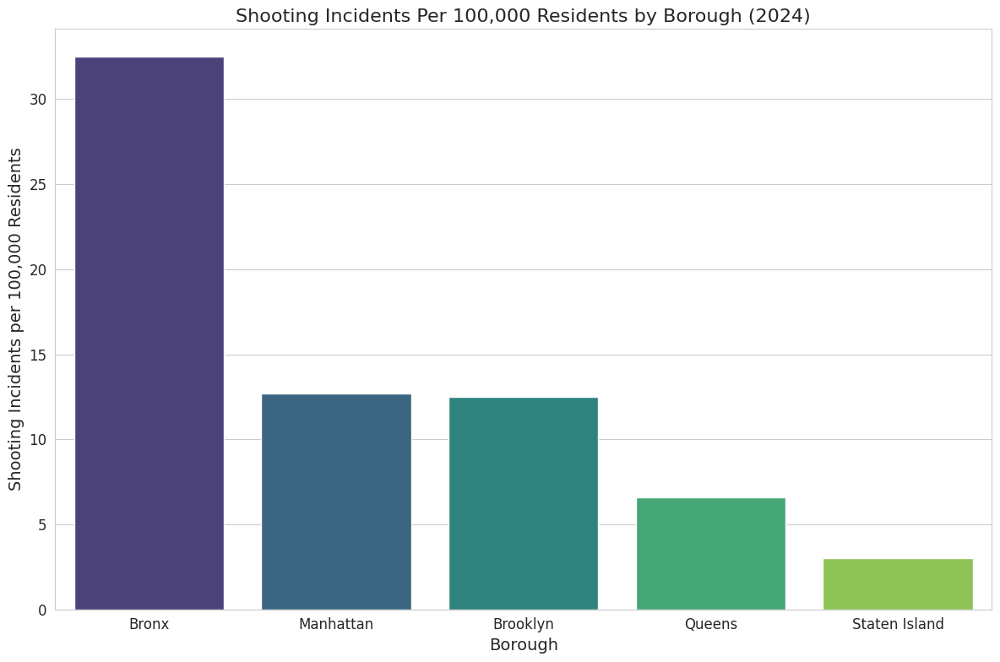

In [28]:
# New Visualization 5: Bar chart for incident ratio comparison
print("Generating new bar chart for per capita incident comparison...")
# Isolate data for the latest year in the dataset
latest_year = merged_df['Year'].max()
latest_year_df = merged_df[merged_df['Year'] == latest_year].copy()
latest_year_df.sort_values(by='Incidents_Per_100k', ascending=False, inplace=True)
print(f"Comparing per capita incidents for the latest year: {latest_year}")

# Create the bar chart
plt.figure(figsize=(12, 8))
sns.barplot(x='Borough', y='Incidents_Per_100k', data=latest_year_df, palette='viridis')
plt.title(f'Shooting Incidents Per 100,000 Residents by Borough ({latest_year})')
plt.xlabel('Borough')
plt.ylabel('Shooting Incidents per 100,000 Residents')
plt.tight_layout()
# plt.savefig('incidents_per_capita_latest_year.png')
print("Bar chart of per capita incidents saved as 'incidents_per_capita_latest_year.png'")


Generating separate yearly trend graphs for each borough, focusing on correlated pairs...
Generated and saved trend graph for Bronx: Unemployment_Rate vs Shooting Incidents.
Generated and saved trend graph for Brooklyn: Unemployment_Rate vs Shooting Incidents.
Generated and saved trend graph for Brooklyn: Median_Income vs Shooting Incidents.
Generated and saved trend graph for Brooklyn: Poverty_Rate vs Shooting Incidents.
Generated and saved trend graph for Queens: Unemployment_Rate vs Shooting Incidents.
Generated and saved trend graph for Staten Island: Unemployment_Rate vs Shooting Incidents.
Generated and saved trend graph for Staten Island: Median_Income vs Shooting Incidents.

All correlated trend graphs have been generated.


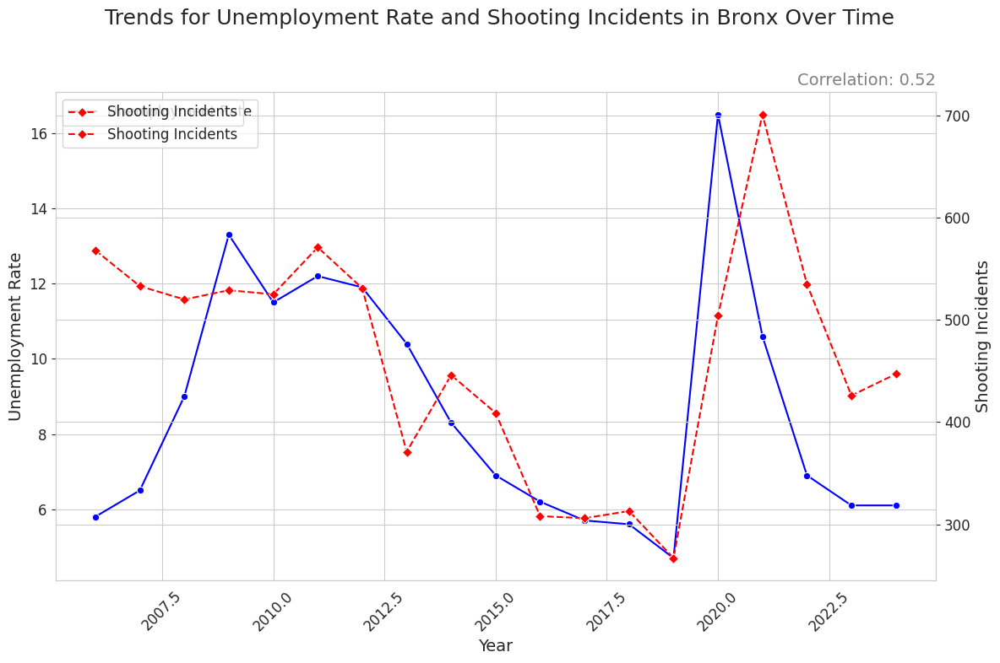

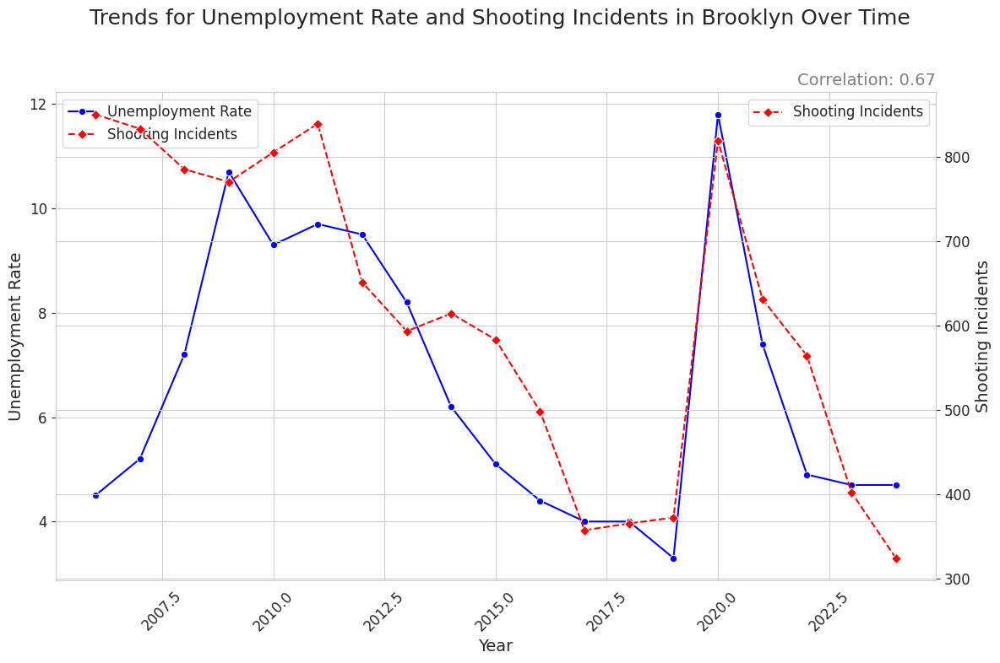

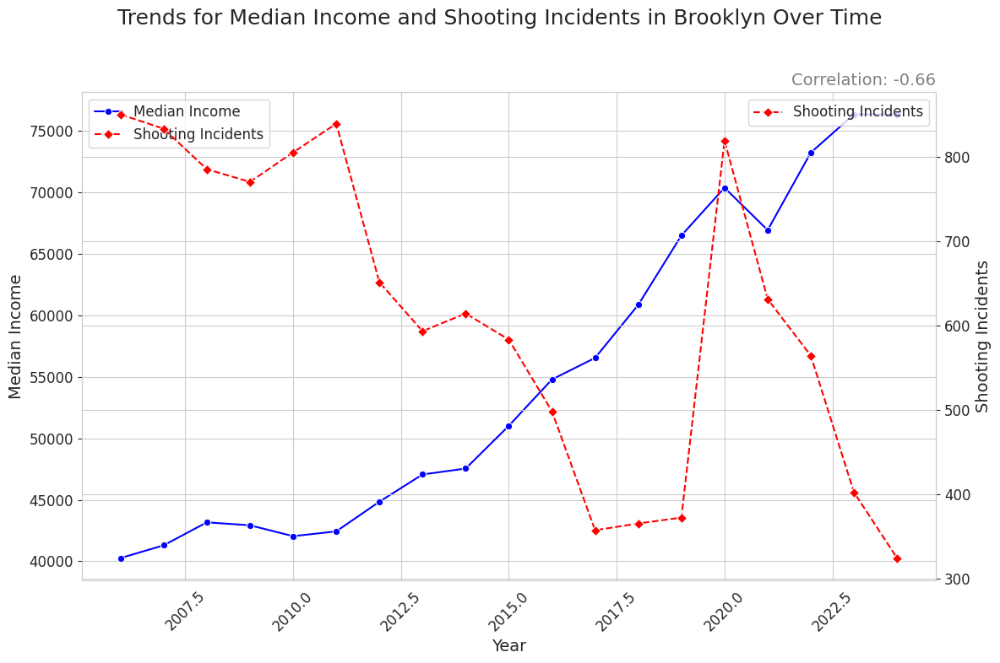

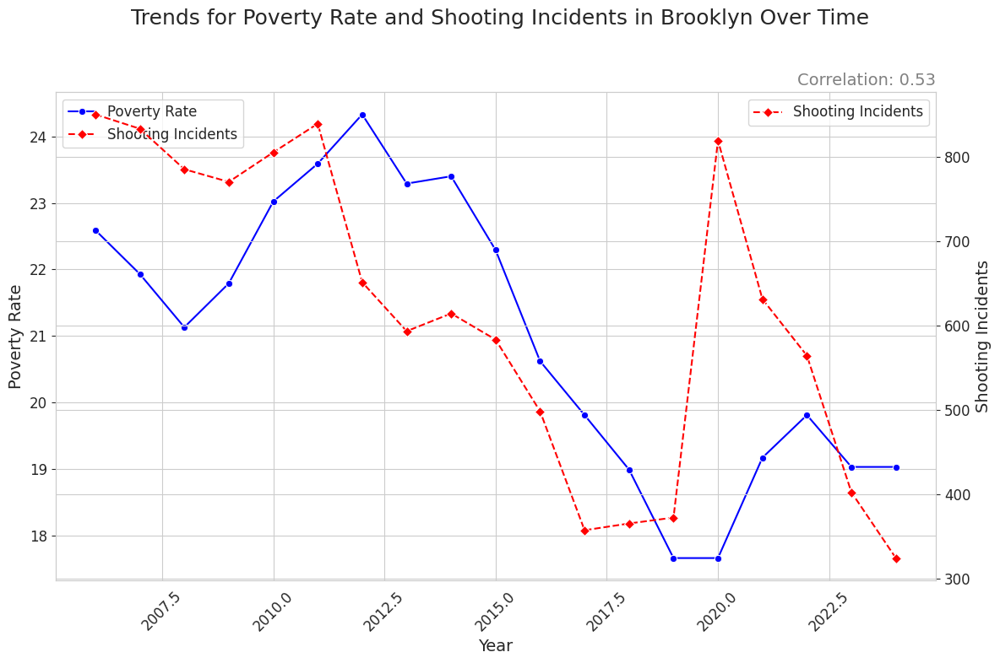

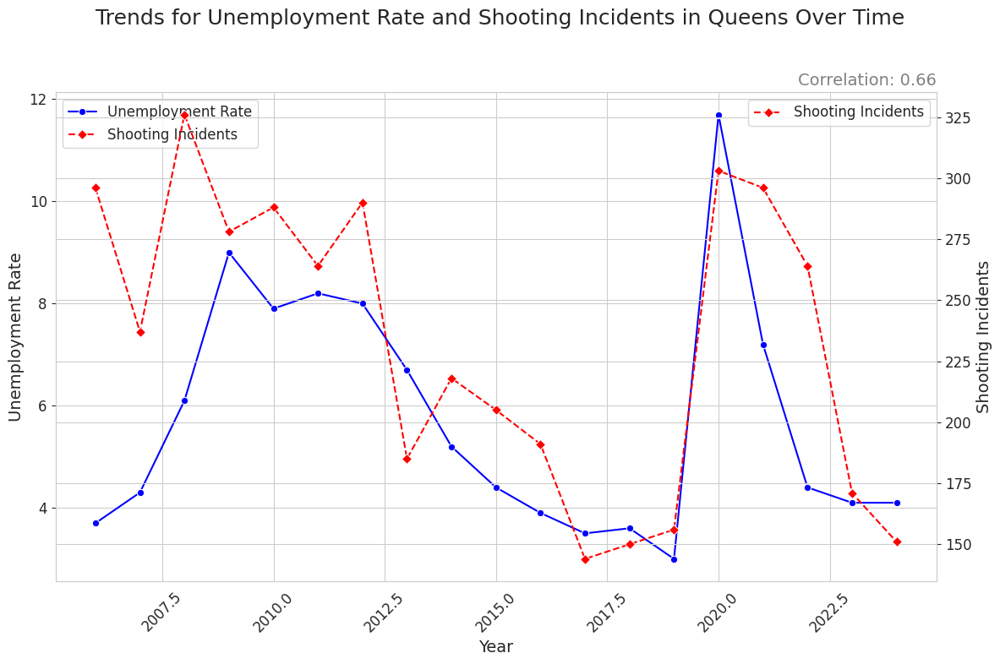

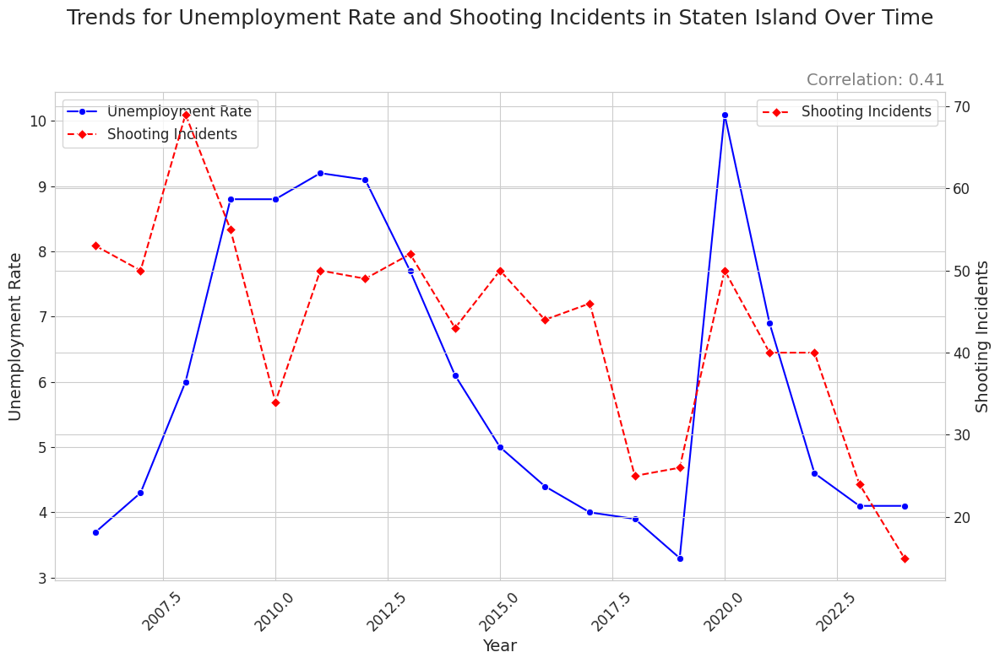

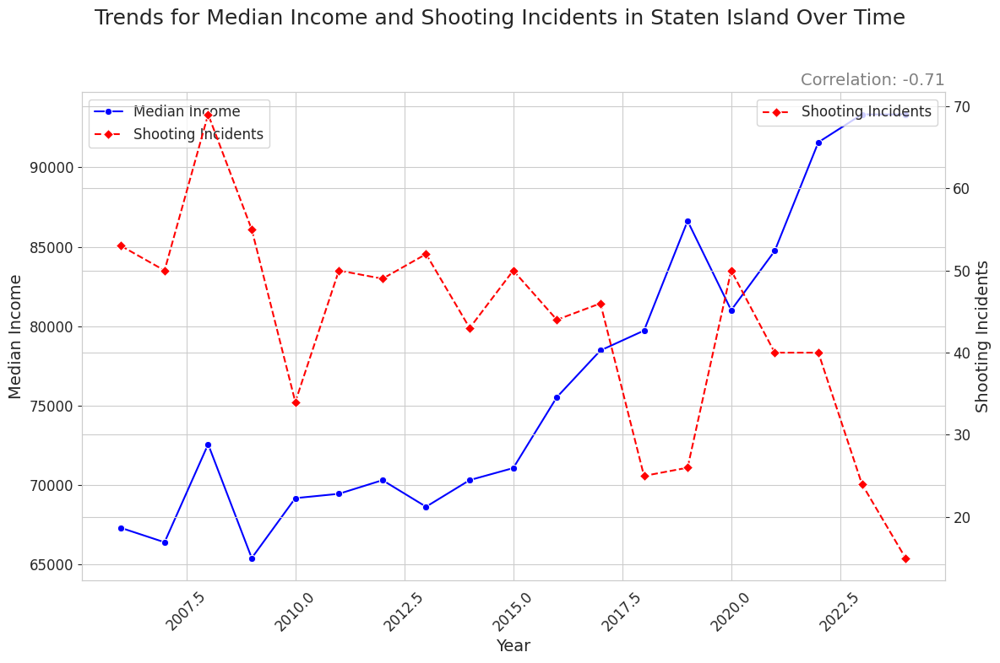

In [29]:
# --- 6. New Visualizations: Separate graphs for each borough (Revised to show correlated pairs) ---
print("\nGenerating separate yearly trend graphs for each borough, focusing on correlated pairs...")

# Define a correlation threshold
correlation_threshold = 0.4

# Get the list of columns to check for correlation with Shooting_Incidents
variables_to_check = ['Unemployment_Rate', 'Median_Income', 'Poverty_Rate']

# Iterate through each borough
boroughs = merged_df['Borough'].unique()
for borough in boroughs:
    borough_df = merged_df[merged_df['Borough'] == borough].sort_values('Year')

    # Calculate correlations for the specific borough
    borough_corr_matrix = borough_df[variables_to_check + ['Shooting_Incidents']].corr()

    # Check for variables correlated to Shooting_Incidents for this borough
    for var in variables_to_check:
        correlation = borough_corr_matrix.loc[var, 'Shooting_Incidents']

        # Only plot if the absolute correlation is above the threshold
        if abs(correlation) >= correlation_threshold:
            fig, ax1 = plt.subplots(figsize=(12, 8))
            fig.suptitle(f'Trends for {var.replace("_", " ").title()} and Shooting Incidents in {borough} Over Time', fontsize=18)

            # Plot the socio-economic variable
            sns.lineplot(data=borough_df, x='Year', y=var, marker='o', ax=ax1, label=var.replace("_", " ").title(), color='blue')
            ax1.set_ylabel(var.replace('_', ' ').title())
            ax1.set_xlabel('Year')
            ax1.tick_params(axis='x', rotation=45)

            # Create a twin y-axis for shooting incidents
            ax2 = ax1.twinx()
            sns.lineplot(data=borough_df, x='Year', y='Shooting_Incidents', marker='D', ax=ax2, label='Shooting Incidents', color='red', linestyle='--')
            ax2.set_ylabel('Shooting Incidents')

            # Add correlation coefficient to the plot title
            plt.title(f'Correlation: {correlation:.2f}', loc='right', fontsize=14, color='gray')

            # Combine legends
            lines, labels = ax1.get_legend_handles_labels()
            lines2, labels2 = ax2.get_legend_handles_labels()
            ax1.legend(lines + lines2, labels + labels2, loc='upper left')

            fig.tight_layout(rect=[0, 0, 1, 0.96])
            # plt.savefig(f'trends_{borough.lower().replace(" ", "_")}_{var.lower()}_vs_shooting_incidents.png')
            print(f"Generated and saved trend graph for {borough}: {var} vs Shooting Incidents.")

print("\nAll correlated trend graphs have been generated.")


In [30]:
df2 = pd.read_csv("NYPD_cleaned.csv")
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29645 entries, 0 to 29644
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               29645 non-null  int64  
 1   INCIDENT_KEY             29645 non-null  int64  
 2   BORO                     29645 non-null  object 
 3   LOC_OF_OCCUR_DESC        29645 non-null  object 
 4   PRECINCT                 29645 non-null  int64  
 5   JURISDICTION_CODE        29645 non-null  float64
 6   LOC_CLASSFCTN_DESC       29645 non-null  object 
 7   STATISTICAL_MURDER_FLAG  29645 non-null  bool   
 8   PERP_AGE_GROUP           29645 non-null  object 
 9   PERP_SEX                 29645 non-null  object 
 10  PERP_RACE                29645 non-null  object 
 11  VIC_AGE_GROUP            29645 non-null  object 
 12  VIC_SEX                  29645 non-null  object 
 13  VIC_RACE                 29645 non-null  object 
 14  X_COORD_CD            

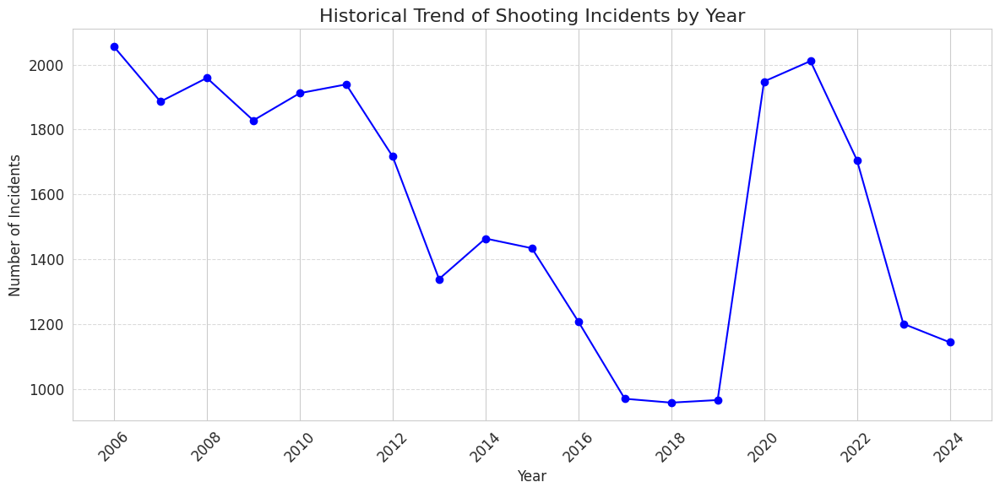

In [31]:
# Yearly Trend 

# 1. Convert OCCUR_DATETIME column to datetime 
df2['OCCUR_DATETIME'] = pd.to_datetime(df2['OCCUR_DATETIME'])

df2['YEAR'] = df2['OCCUR_DATETIME'].dt.year
yearly_incidents = df2['YEAR'].value_counts().sort_index()

# 2. Convert to DataFrame and calculate total incidents for display
yearly_summary = yearly_incidents.reset_index()
yearly_summary.columns = ['Year', 'Incident_Count']


# 4. Generate the plot
plt.figure(figsize=(12, 6))
plt.plot(yearly_incidents.index, yearly_incidents.values, marker='o', linestyle='-', color='blue')

# Set labels and title
plt.title('Historical Trend of Shooting Incidents by Year', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Incidents', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(yearly_incidents.index[::2], rotation=45) # Show every second year for better readability
plt.tight_layout()

# Save the plot
# plt.savefig('images/yearly_shooting_trend.png')
plt.show()

# Store the summary as a CSV for user access
yearly_summary.to_csv('yearly_incident_summary.csv', index=False)


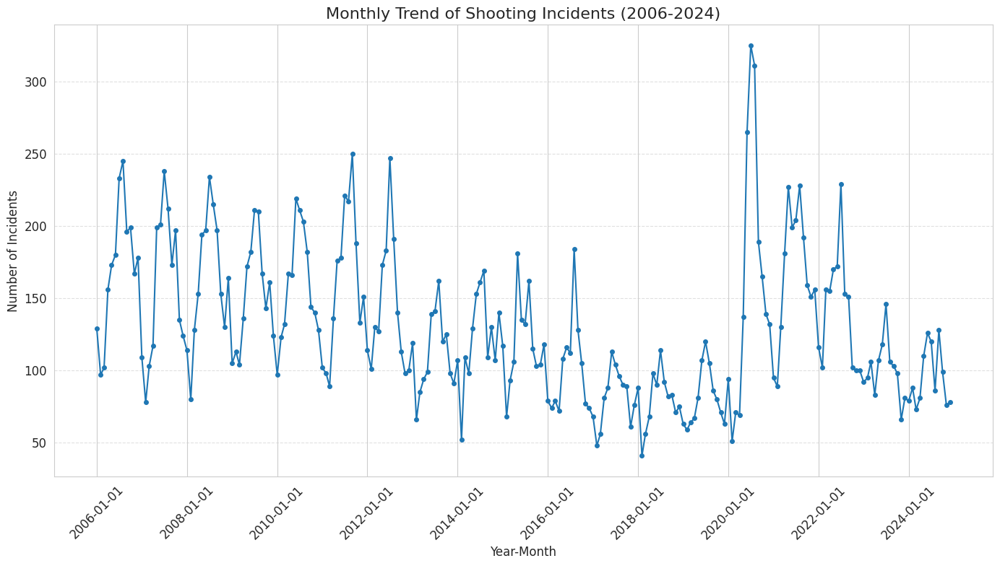

In [32]:
# --- Time-Series Analysis Logic ---

# 1. Extract the year-month from the datetime column
df2['YEAR_MONTH'] = df2['OCCUR_DATETIME'].dt.to_period('M')

# 2. Count the number of incidents per year-month
monthly_counts = df2['YEAR_MONTH'].value_counts().sort_index()

# 3. Convert the Period index back to a datetime index for plotting
monthly_counts_plot = monthly_counts.to_timestamp()

# --- Plotting ---
plt.figure(figsize=(14, 8)) # Set a larger figure size for monthly data

# Plot the trend line
plt.plot(monthly_counts_plot.index, monthly_counts_plot.values, marker='o', linestyle='-', markersize=4)

plt.title('Monthly Trend of Shooting Incidents (2006-2024)', fontsize=16)
plt.xlabel('Year-Month', fontsize=12)
plt.ylabel('Number of Incidents', fontsize=12)
plt.grid(True, axis='y', linestyle='--', alpha=0.6) # Add a horizontal grid for easier reading

# Custom tick logic for x-axis: show ticks every 2 years for better readability
start_year = monthly_counts_plot.index.year.min()
end_year = monthly_counts_plot.index.year.max()
tick_years = pd.to_datetime([f'{year}-01-01' for year in range(start_year, end_year + 1, 2)])
plt.xticks(tick_years, rotation=45)

plt.tight_layout() # Adjust layout to prevent label cutoff
# plt.savefig('images/monthly_timeseries_trend.png')
plt.show()

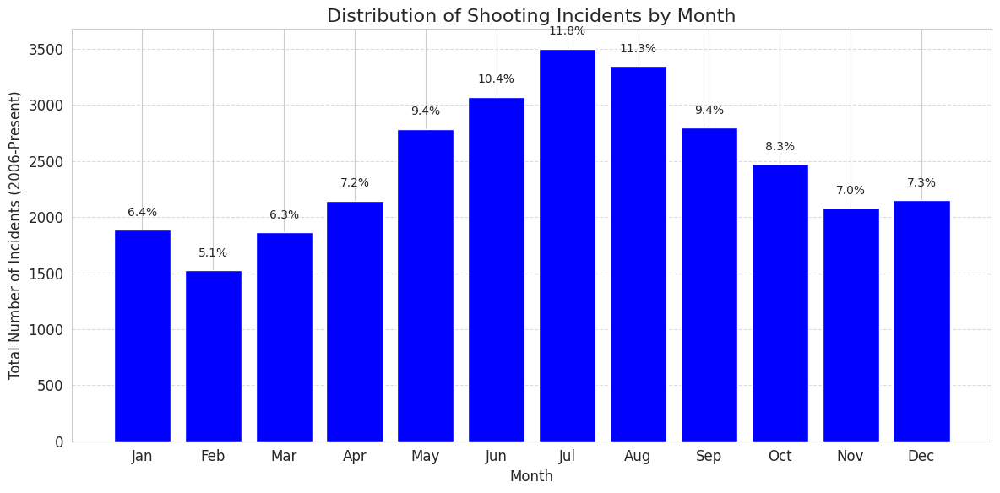

In [33]:
# 1. Extract the Month (1=Jan, 12=Dec) and calculate monthly counts
df2['MONTH'] = df2['OCCUR_DATETIME'].dt.month
monthly_incidents = df2['MONTH'].value_counts().sort_index()

# 2. Prepare for display and plotting
total_incidents = len(df2)
monthly_summary = monthly_incidents.reset_index()
monthly_summary.columns = ['Month_Index', 'Incident_Count']

# Add Month Name and Percentage for better readability
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
monthly_summary['Month'] = monthly_summary['Month_Index'].apply(lambda x: month_names[x-1])
monthly_summary['Percentage'] = (monthly_summary['Incident_Count'] / total_incidents * 100).round(2)

# Select and reorder columns for final display
monthly_summary = monthly_summary[['Month', 'Incident_Count', 'Percentage']]


# 4. Generate the bar chart for visualization
plt.figure(figsize=(12, 6))
bars = plt.bar(monthly_summary['Month'], monthly_summary['Incident_Count'], color='blue')

# Set labels and title
plt.title('Distribution of Shooting Incidents by Month', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Total Number of Incidents (2006-Present)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add percentages on top of the bars
for bar in bars:
    yval = bar.get_height()
    # Get the corresponding percentage from the summary DataFrame
    month = bar.get_x()
    percent = monthly_summary.loc[monthly_summary['Month'] == month_names[int(month + 0.5)], 'Percentage'].iloc[0]
    plt.text(bar.get_x() + bar.get_width()/2, yval + 100, f'{percent:.1f}%', ha='center', va='bottom', fontsize=10)

plt.tight_layout()

# Save the plot
# plt.savefig('images/monthly_shooting_distribution.png')
plt.show()

# Store the summary as a CSV for user access
monthly_summary.to_csv('monthly_incident_distribution.csv', index=False)

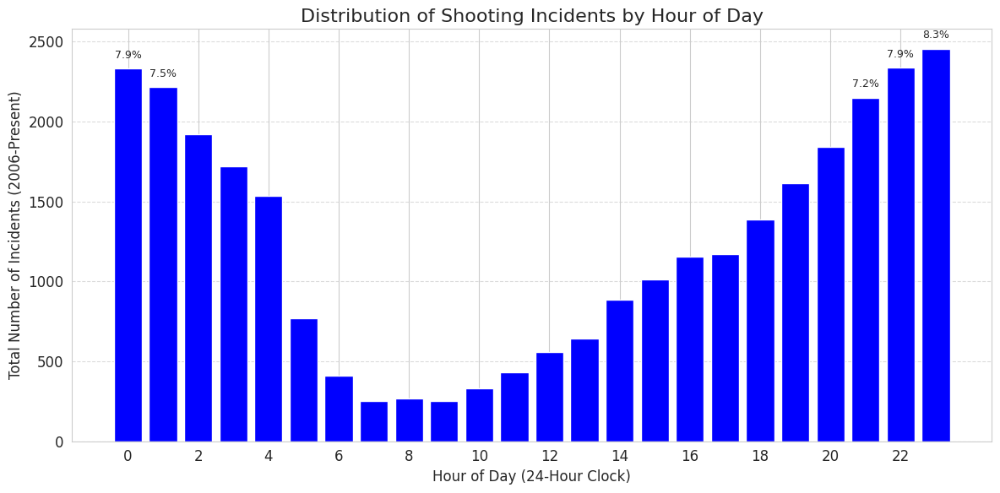

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Extract the Hour of Day and calculate hourly counts
# Re-extract the hour to ensure the 'HOUR' column is present
df2['HOUR'] = df2['OCCUR_DATETIME'].dt.hour
hourly_incidents = df2['HOUR'].value_counts().sort_index()

# 2. Prepare for display and plotting
total_incidents = len(df2)
hourly_summary = hourly_incidents.reset_index()
hourly_summary.columns = ['Hour', 'Incident_Count']

# Add Percentage for display
hourly_summary['Percentage'] = (hourly_summary['Incident_Count'] / total_incidents * 100).round(2)


# 3. Generate the BAR plot for visualization (as requested)
plt.figure(figsize=(12, 6))
bars = plt.bar(hourly_summary['Hour'], hourly_summary['Incident_Count'], color='blue')

# Set labels and title
plt.title('Distribution of Shooting Incidents by Hour of Day', fontsize=16)
plt.xlabel('Hour of Day (24-Hour Clock)', fontsize=12)
plt.ylabel('Total Number of Incidents (2006-Present)', fontsize=12)
plt.xticks(range(0, 24, 2)) # Show every second hour for cleaner display
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add percentages on top of the bars
for bar in bars:
    yval = bar.get_height()
    # Find the corresponding percentage, using the index
    idx = hourly_summary[hourly_summary['Incident_Count'] == yval].index[0]
    percent = hourly_summary.loc[idx, 'Percentage']
    
    # Only label the top 5 bars for readability in the bar chart
    if percent > 7.0: # Top 5 bars have percent >= 7.25%
        plt.text(bar.get_x() + bar.get_width()/2, yval + 50, f'{percent:.1f}%', ha='center', va='bottom', fontsize=9)

plt.tight_layout()

# Save the plot
# plt.savefig('images/hourly_shooting_bar_distribution.png')
plt.show()


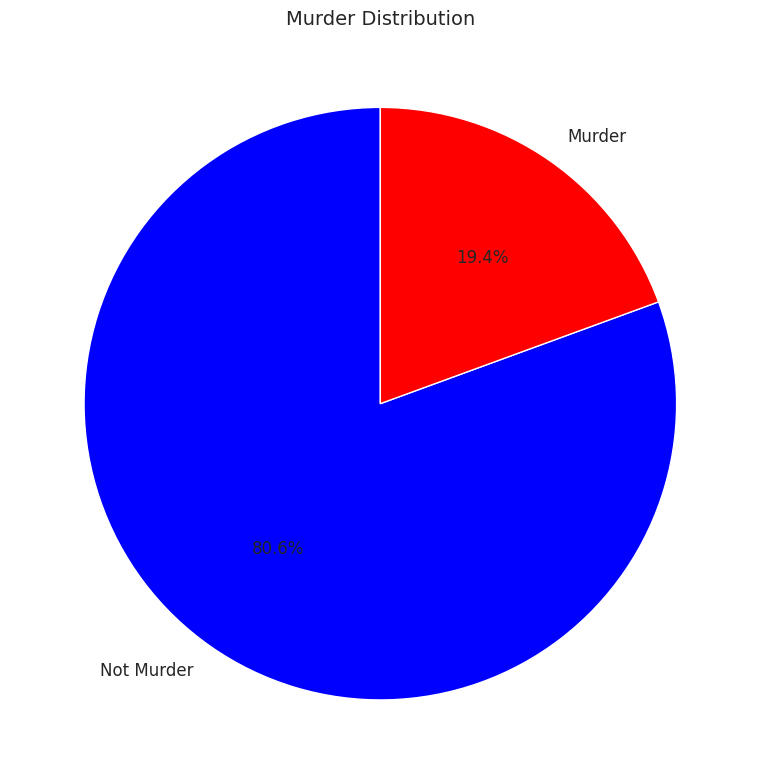

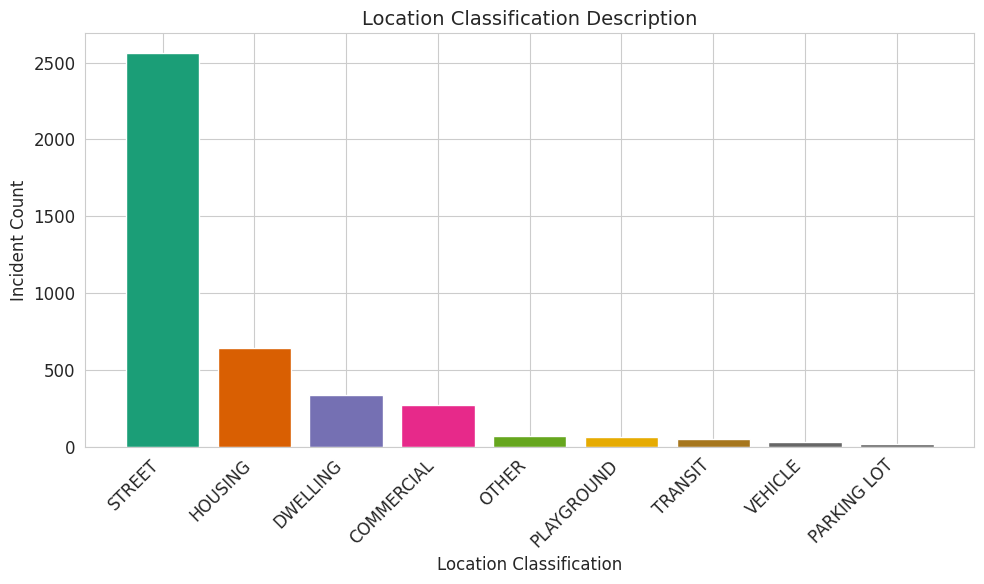

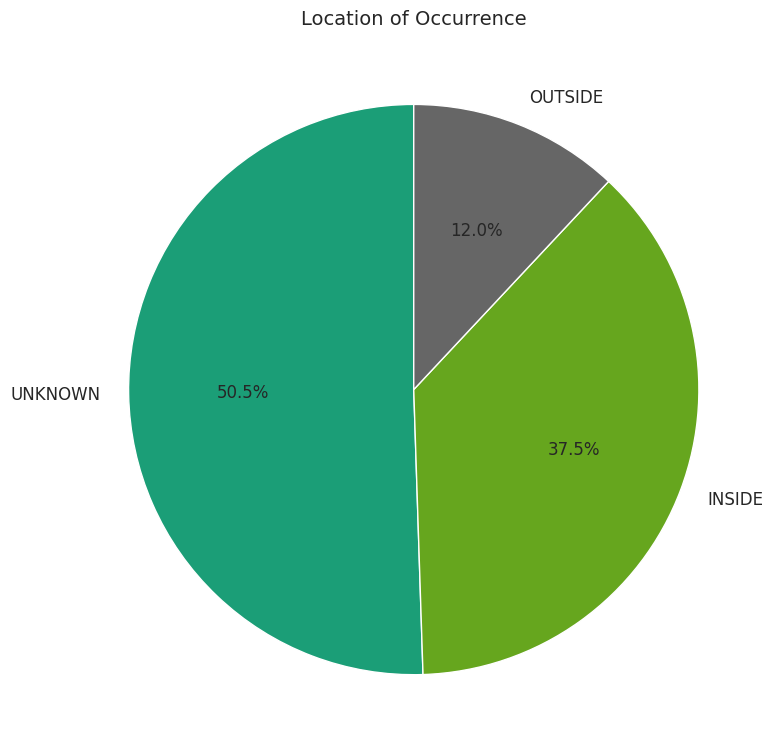

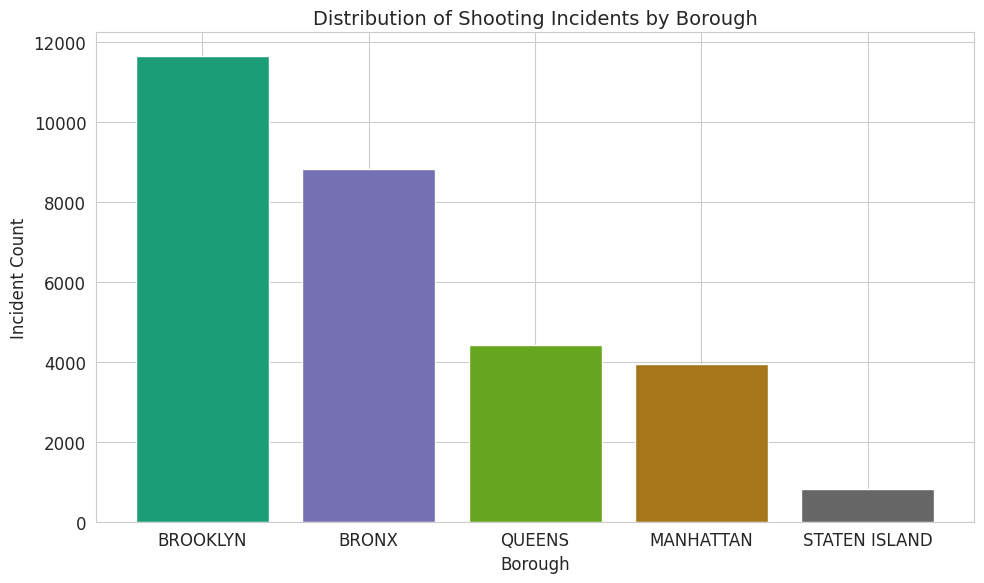

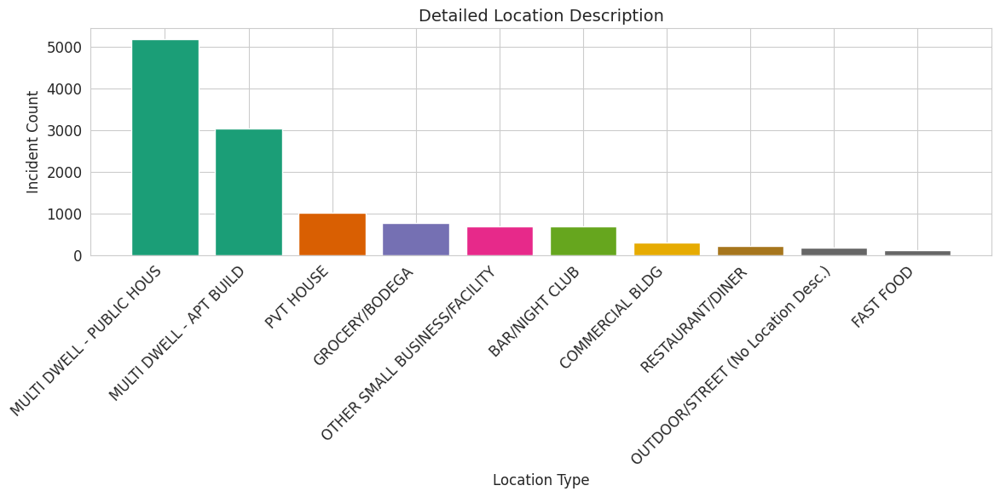

In [35]:

# Ensure (null) is mapped to UNKNOWN, which is critical for consistency in the loaded CSV
object_cols = df2.select_dtypes(include=['object']).columns
for col in object_cols:
    df2[col] = df2[col].replace('(null)', 'UNKNOWN')

# Define a color map for charts
cmap = plt.get_cmap('Dark2')
colors = cmap(np.linspace(0, 1, 10))

# --- Chart 1: STATISTICAL_MURDER_FLAG (Pie Chart) ---
counts_murder = df2['STATISTICAL_MURDER_FLAG'].value_counts()
labels_murder = ['Murder' if label else 'Not Murder' for label in counts_murder.index]
percentages_murder = counts_murder / counts_murder.sum() * 100

plt.figure(figsize=(8, 8))
plt.pie(counts_murder, labels=labels_murder, autopct='%1.1f%%', startangle=90, colors= ['blue', 'red'], textprops={'fontsize': 12})
plt.title('Murder Distribution', fontsize=14)
plt.tight_layout()
# plt.savefig('images/murder_flag_pie_chart.png')
plt.show()

# --- Chart 2: LOC_CLASSFCTN_DESC (Bar Chart, excluding 'UNKNOWN') ---
df_loc_class = df2[df2['LOC_CLASSFCTN_DESC'] != 'UNKNOWN']
counts_loc_class = df_loc_class['LOC_CLASSFCTN_DESC'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
bars_loc_class = plt.bar(counts_loc_class.index, counts_loc_class.values, color=cmap(np.linspace(0, 1, len(counts_loc_class))))
plt.title('Location Classification Description', fontsize=14)
plt.xlabel('Location Classification', fontsize=12)
plt.ylabel('Incident Count', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
# plt.savefig('images/loc_class_bar_chart.png')
plt.show()

# --- Chart 3: LOC_OF_OCCUR_DESC (Pie Chart) ---
counts_loc_occur = df2['LOC_OF_OCCUR_DESC'].value_counts()
labels_loc_occur = counts_loc_occur.index

plt.figure(figsize=(8, 8))
plt.pie(counts_loc_occur, labels=labels_loc_occur, autopct='%1.1f%%', startangle=90, colors=cmap(np.linspace(0, 1, len(counts_loc_occur))), textprops={'fontsize': 12})
plt.title('Location of Occurrence', fontsize=14)
plt.tight_layout()
# plt.savefig('images/loc_occur_pie_chart.png')
plt.show()

# --- Chart 4: BORO (Bar Chart) ---
counts_boro = df2['BORO'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
bars_boro = plt.bar(counts_boro.index, counts_boro.values, color=cmap(np.linspace(0, 1, len(counts_boro))))
plt.title('Distribution of Shooting Incidents by Borough', fontsize=14)
plt.xlabel('Borough', fontsize=12)
plt.ylabel('Incident Count', fontsize=12)
plt.xticks(rotation=0)
plt.tight_layout()
# plt.savefig('images/boro_bar_chart.png')
plt.show()

# --- Chart 5: LOCATION_DESC (Bar Chart, excluding 'UNKNOWN') ---
df_loc_desc = df2[df2['LOCATION_DESC'] != 'UNKNOWN']
counts_loc_desc = df_loc_desc['LOCATION_DESC'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
bars_loc_desc = plt.bar(counts_loc_desc.index, counts_loc_desc.values, color=cmap(np.linspace(0, 1, len(counts_loc_desc))))
plt.title('Detailed Location Description', fontsize=14)
plt.xlabel('Location Type', fontsize=12)
plt.ylabel('Incident Count', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
# plt.savefig('images/location_desc_bar_chart.png')
plt.show()


# Time Series Analysis

In [36]:
# Cell 2 - imports
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.stats.diagnostic import acorr_ljungbox

# optional auto_arima
try:
    import pmdarima as pm
    PMDARIMA = True
except Exception:
    PMDARIMA = False

print("pmdarima available:", PMDARIMA)


pmdarima available: False


In [37]:
df = df2.copy()
df = df.set_index('OCCUR_DATETIME')
# Aggregate counts by month
monthly_counts = df.resample('ME').size()

print(monthly_counts.head(12))  # first 12 months
print(monthly_counts.tail(12))

OCCUR_DATETIME
2006-01-31    129
2006-02-28     97
2006-03-31    102
2006-04-30    156
2006-05-31    173
2006-06-30    180
2006-07-31    233
2006-08-31    245
2006-09-30    196
2006-10-31    199
2006-11-30    167
2006-12-31    178
Freq: ME, dtype: int64
OCCUR_DATETIME
2024-01-31     79
2024-02-29     88
2024-03-31     73
2024-04-30     81
2024-05-31    110
2024-06-30    126
2024-07-31    120
2024-08-31     86
2024-09-30    128
2024-10-31     99
2024-11-30     76
2024-12-31     78
Freq: ME, dtype: int64


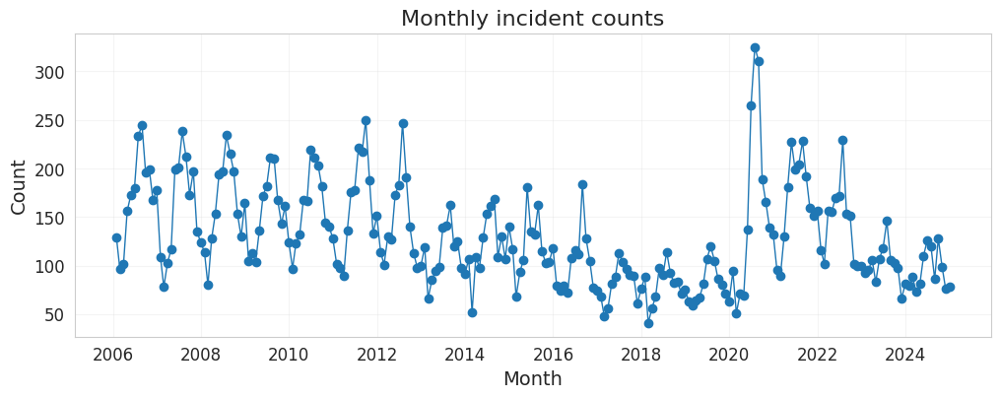

   count       mean        std   min    25%    50%     75%    max
0  228.0  130.02193  51.242315  41.0  92.75  117.5  164.25  325.0


In [38]:
monthly = monthly_counts.copy()

# Cell 6 - plot monthly counts
plt.figure(figsize=(12,4))
plt.plot(monthly.index, monthly.values, marker='o', linewidth=1)
plt.title('Monthly incident counts')
plt.ylabel('Count')
plt.xlabel('Month')
plt.grid(alpha=0.2)
plt.show()

# summary
print(monthly.describe().to_frame().T)


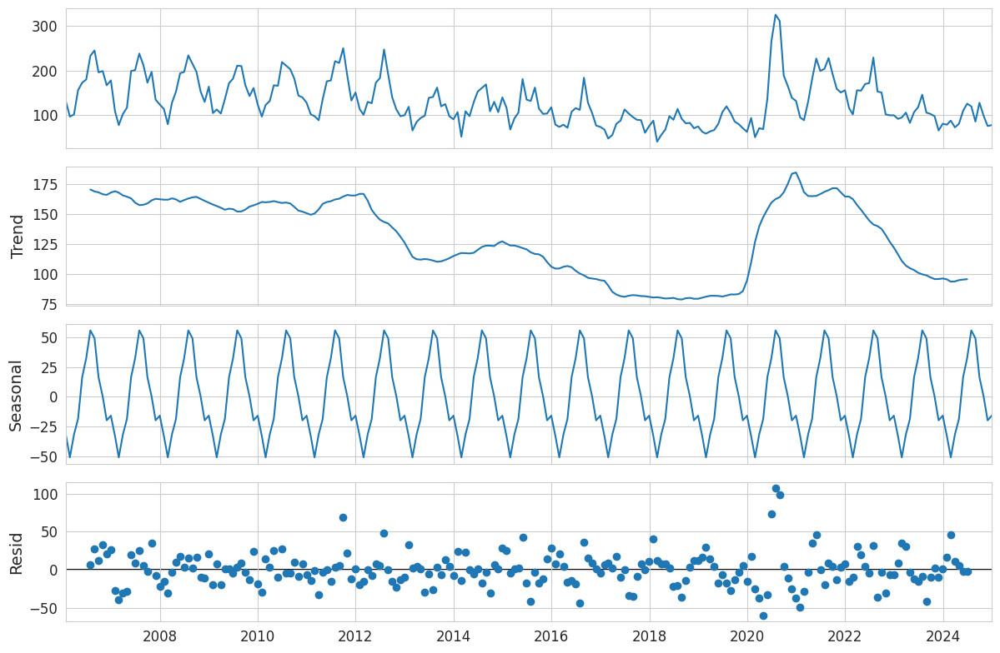

In [39]:
# Cell 7 - decomposition (requires >= 2*period data points)
period = 12
if len(monthly) >= period*2:
    decomposition = seasonal_decompose(monthly, model='additive', period=period)
    fig = decomposition.plot()
    fig.set_size_inches(12,8)
    # plt.savefig("images/time_series_decomposition.png")
    plt.show()
else:
    print("Too few observations to reliably decompose (need at least 2*period).")


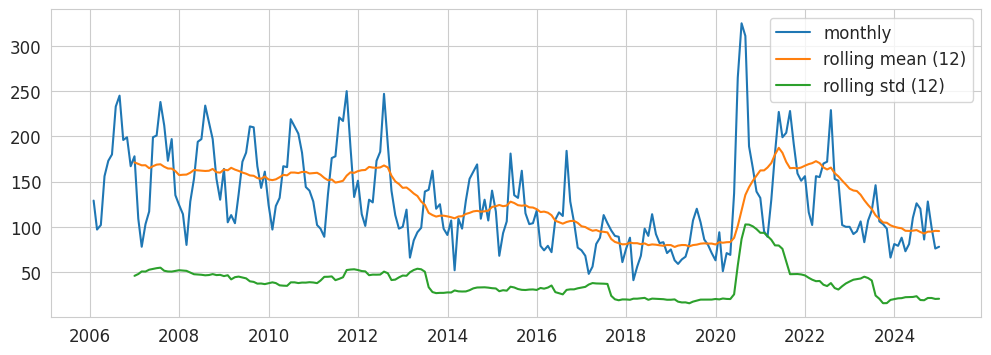

ADF monthly: stat=-1.6290, p=0.4680, lags=12, nobs=215
KPSS monthly: stat=0.7599, p=0.0100, lags=8

Interpretation:
- ADF null=hypothesis: unit root (non-stationary). p<0.05 => reject => stationary.
- KPSS null=hypothesis: stationary. p<0.05 => reject => non-stationary.


In [40]:
# Cell 8 - stationarity functions + rolling plots
def adf_test(series, title=''):
    res = adfuller(series.dropna(), autolag='AIC')
    print(f"ADF {title}: stat={res[0]:.4f}, p={res[1]:.4f}, lags={res[2]}, nobs={res[3]}")

def kpss_test(series, title=''):
    try:
        stat, p, lags, crit = kpss(series.dropna(), regression='c', nlags='auto')
    except Exception:
        stat, p, lags, crit = kpss(series.dropna(), regression='c', nlags=10)
    print(f"KPSS {title}: stat={stat:.4f}, p={p:.4f}, lags={lags}")

# rolling mean & std
rolling_mean = monthly.rolling(window=12).mean()
rolling_std = monthly.rolling(window=12).std()

plt.figure(figsize=(12,4))
plt.plot(monthly, label='monthly')
plt.plot(rolling_mean, label='rolling mean (12)')
plt.plot(rolling_std, label='rolling std (12)')
plt.legend()
plt.show()

adf_test(monthly, 'monthly')
kpss_test(monthly, 'monthly')

print("\nInterpretation:\n- ADF null=hypothesis: unit root (non-stationary). p<0.05 => reject => stationary.\n- KPSS null=hypothesis: stationary. p<0.05 => reject => non-stationary.")


Test d=0, D=0 -> ADF_p=0.4680, KPSS_p=0.0100
Test d=1, D=0 -> ADF_p=0.0000, KPSS_p=0.1000
Chosen: d=1, D=0
Final chosen differencing -> d = 1 D = 0


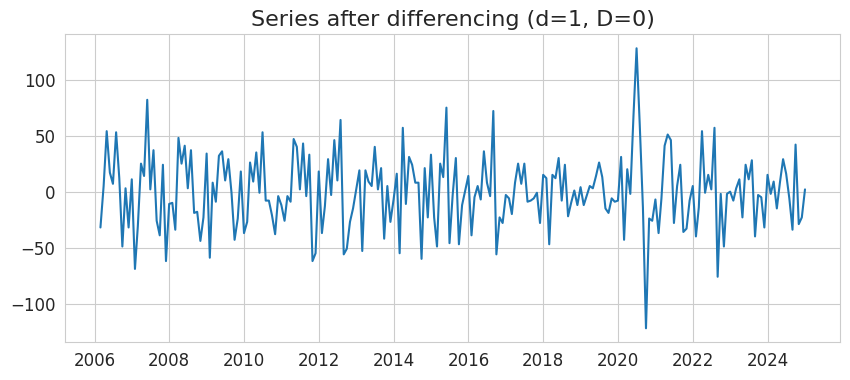

In [41]:
# Cell 9 - try differencing until stationarity
def find_stationary(series, max_d=2, seasonal_period=12):
    for D in (0,1):
        sD = series.copy()
        if D == 1:
            sD = sD.diff(seasonal_period).dropna()
        for d in range(0, max_d+1):
            s_try = sD.diff(d).dropna() if d>0 else sD.dropna()
            try:
                p_adf = adfuller(s_try, autolag='AIC')[1]
            except Exception:
                p_adf = 1.0
            try:
                p_kpss = kpss(s_try, regression='c', nlags='auto')[1]
            except Exception:
                p_kpss = 0.0
            print(f"Test d={d}, D={D} -> ADF_p={p_adf:.4f}, KPSS_p={p_kpss:.4f}")
            if (p_adf < 0.05) and (p_kpss > 0.05):
                print(f"Chosen: d={d}, D={D}")
                return s_try, d, D
    print("No suitable (d,D) found within tested range.")
    return series, 0, 0

stationary_series, d, D = find_stationary(monthly, max_d=2, seasonal_period=period)
print("Final chosen differencing -> d =", d, "D =", D)

plt.figure(figsize=(10,4))
plt.plot(stationary_series)
plt.title(f"Series after differencing (d={d}, D={D})")
# plt.savefig("images/differenced_time_series.png")
plt.show()


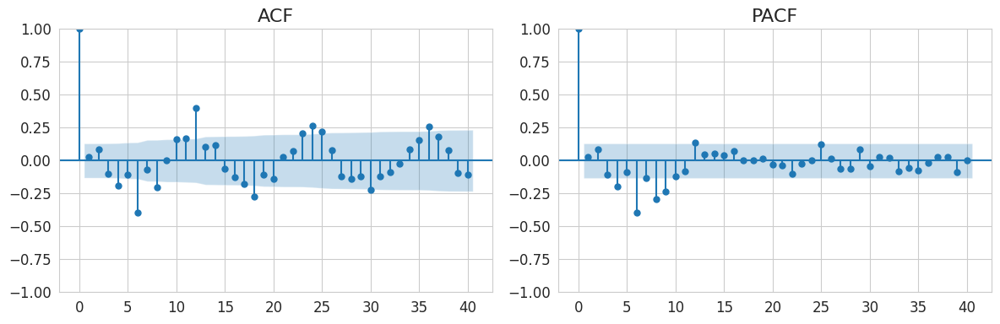

In [42]:
# Cell 10 - ACF & PACF
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plot_acf(stationary_series.dropna(), lags=40, ax=plt.gca())
plt.title('ACF')

plt.subplot(1,2,2)
plot_pacf(stationary_series.dropna(), lags=40, method='ywm', ax=plt.gca())
plt.title('PACF')

plt.tight_layout()
# plt.savefig("images/time_series_acf_pacf.png")
plt.show()


In [43]:
# Cell 11 - model selection
y = monthly.dropna()

if PMDARIMA:
    print("Running pmdarima.auto_arima (can be faster/robust).")
    stepwise = pm.auto_arima(y, seasonal=True, m=period, trace=True,
                              error_action='ignore', suppress_warnings=True, stepwise=True)
    print(stepwise.summary())
    order = stepwise.order
    seasonal_order = stepwise.seasonal_order
else:
    print("pmdarima not available — running a small SARIMA grid (keeps runtime reasonable).")
    p_range = range(0,3)
    q_range = range(0,3)
    P_range = range(0,2)
    Q_range = range(0,2)
    best_aic = np.inf
    best_cfg = None
    for p in p_range:
        for q in q_range:
            for P in P_range:
                for Q in Q_range:
                    try:
                        mod = SARIMAX(y, order=(p,d,q), seasonal_order=(P,D,Q,period),
                                      enforce_stationarity=False, enforce_invertibility=False)
                        res = mod.fit(disp=False)
                        if res.aic < best_aic:
                            best_aic = res.aic
                            best_cfg = ((p,d,q),(P,D,Q,period),res)
                        print(f"Tested {(p,d,q)} x {(P,D,Q,period)} - AIC {res.aic:.1f}")
                    except Exception:
                        continue
    order = best_cfg[0]
    seasonal_order = best_cfg[1]
    print("Selected:", order, seasonal_order, "AIC:", best_cfg[2].aic)


pmdarima not available — running a small SARIMA grid (keeps runtime reasonable).
Tested (0, 1, 0) x (0, 0, 0, 12) - AIC 2212.8
Tested (0, 1, 0) x (0, 0, 1, 12) - AIC 2065.5
Tested (0, 1, 0) x (1, 0, 0, 12) - AIC 2062.5
Tested (0, 1, 0) x (1, 0, 1, 12) - AIC 2033.3
Tested (0, 1, 1) x (0, 0, 0, 12) - AIC 2205.9
Tested (0, 1, 1) x (0, 0, 1, 12) - AIC 2058.5
Tested (0, 1, 1) x (1, 0, 0, 12) - AIC 2061.0
Tested (0, 1, 1) x (1, 0, 1, 12) - AIC 2006.3
Tested (0, 1, 2) x (0, 0, 0, 12) - AIC 2193.3
Tested (0, 1, 2) x (0, 0, 1, 12) - AIC 2052.3
Tested (0, 1, 2) x (1, 0, 0, 12) - AIC 2059.1
Tested (0, 1, 2) x (1, 0, 1, 12) - AIC 1993.5
Tested (1, 1, 0) x (0, 0, 0, 12) - AIC 2214.7
Tested (1, 1, 0) x (0, 0, 1, 12) - AIC 2067.2
Tested (1, 1, 0) x (1, 0, 0, 12) - AIC 2052.5
Tested (1, 1, 0) x (1, 0, 1, 12) - AIC 2020.0
Tested (1, 1, 1) x (0, 0, 0, 12) - AIC 2208.7
Tested (1, 1, 1) x (0, 0, 1, 12) - AIC 2060.2
Tested (1, 1, 1) x (1, 0, 0, 12) - AIC 2031.6
Tested (1, 1, 1) x (1, 0, 1, 12) - AIC 1997.1

Train points: 183 Test points: 45
Model order: (1, 1, 2) Seasonal order: (1, 0, 1, 12)
                                      SARIMAX Results                                       
Dep. Variable:                                    y   No. Observations:                  183
Model:             SARIMAX(1, 1, 2)x(1, 0, [1], 12)   Log Likelihood                -783.916
Date:                              Sun, 26 Oct 2025   AIC                           1579.832
Time:                                      03:45:36   BIC                           1598.540
Sample:                                  01-31-2006   HQIC                          1587.425
                                       - 03-31-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1      

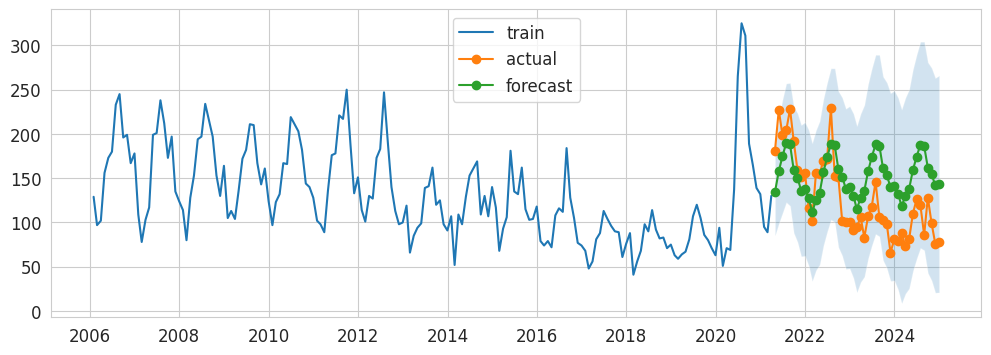

In [44]:
# Cell 12 - train/test split, fit, and evaluate
y = monthly.dropna()
n_test = max(12, int(len(y)*0.2))   # use at least 12 months or 20% for test
train, test = y[:-n_test], y[-n_test:]
print("Train points:", len(train), "Test points:", len(test))
print("Model order:", order, "Seasonal order:", seasonal_order)

model = SARIMAX(train, order=order, seasonal_order=seasonal_order,
                enforce_stationarity=False, enforce_invertibility=False)
res = model.fit(disp=False, maxiter=200)
print(res.summary())

# forecast on test
pred = res.get_forecast(steps=len(test))
pred_mean = pred.predicted_mean
pred_ci = pred.conf_int()

plt.figure(figsize=(12,4))
plt.plot(train.index, train, label='train')
plt.plot(test.index, test, label='actual', marker='o')
plt.plot(pred_mean.index, pred_mean, label='forecast', marker='o')
plt.fill_between(pred_ci.index, pred_ci.iloc[:,0], pred_ci.iloc[:,1], alpha=0.2)
plt.legend()
# plt.savefig("images/time_series_test_forecast.png"); plt.show()


# evaluation metrics
def metrics(y_true, y_pred):
    y_true = np.array(y_true); y_pred = np.array(y_pred)
    mae = np.mean(np.abs(y_true - y_pred))
    rmse = np.sqrt(np.mean((y_true - y_pred)**2))
    denom = np.where(np.abs(y_true) < 1e-8, 1e-8, np.abs(y_true))
    mape = np.mean(np.abs((y_true - y_pred)/denom))*100
    return {'MAE':mae, 'RMSE':rmse, 'MAPE(%)':mape}

print("Test metrics:", metrics(test.values, pred_mean.values))


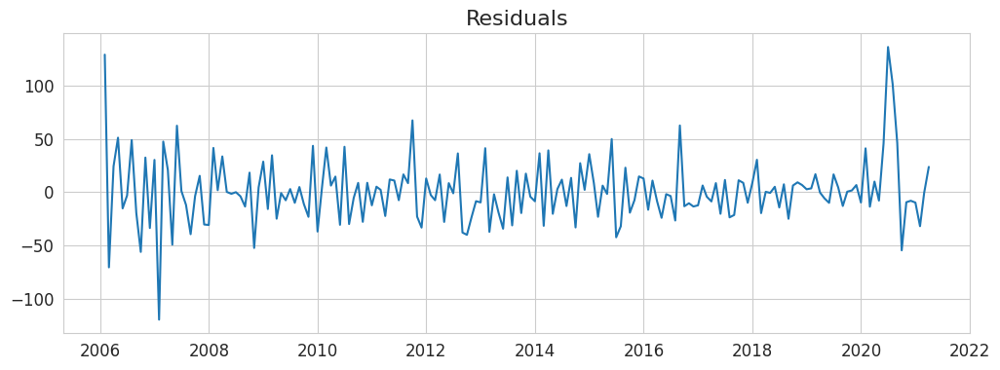

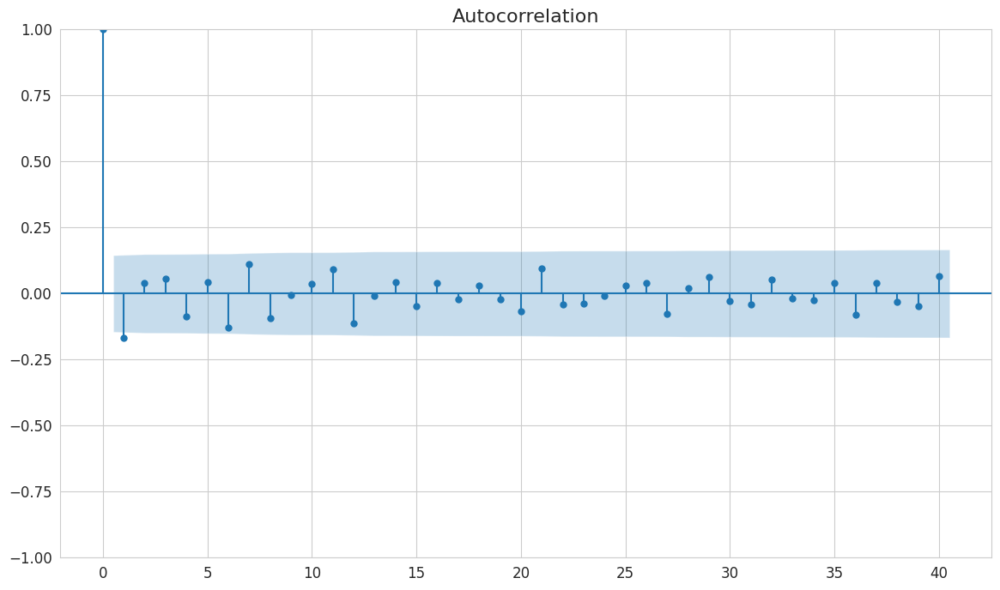

Ljung-Box test (null: no autocorrelation):
      lb_stat  lb_pvalue
10  15.502996   0.114771
20  22.251811   0.327004


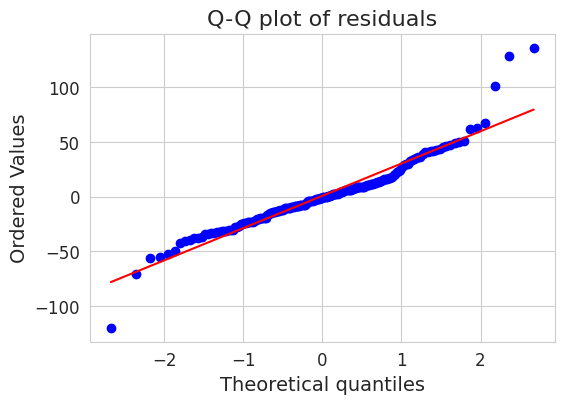

In [45]:
# Cell 13 - residual diagnostics
resid = res.resid

plt.figure(figsize=(12,4))
plt.plot(resid)
plt.title('Residuals')
# plt.savefig("images/time_series_residual.png")
plt.show()

# Residual ACF
plot_acf(resid.dropna(), lags=40)
# plt.savefig("images/time_series_residual_acf.png")
plt.show()

# Q-Q
import scipy.stats as stats
plt.figure(figsize=(6,4))
stats.probplot(resid.dropna(), plot=plt)
plt.title("Q-Q plot of residuals")
# plt.savefig("images/time_series_residual_qqplot.png"); plt.show()

# Ljung-Box
print("Ljung-Box test (null: no autocorrelation):")
print(acorr_ljungbox(resid.dropna(), lags=[10,20], return_df=True))


,forecast,lower,upper
2025-01-31,67.769506,20.204700,115.334312
2025-02-28,57.516997,1.232660,113.801333
2025-03-31,68.296517,7.474851,129.118182
2025-04-30,79.434910,15.574476,143.295345
2025-05-31,99.278180,33.049830,165.506531
2025-06-30,107.172592,38.911367,175.433816
2025-07-31,121.223555,51.112770,191.334339
2025-08-31,118.325734,46.475349,190.176119
2025-09-30,100.339564,26.822341,173.856786
2025-10-31,91.423510,16.292547,166.554473


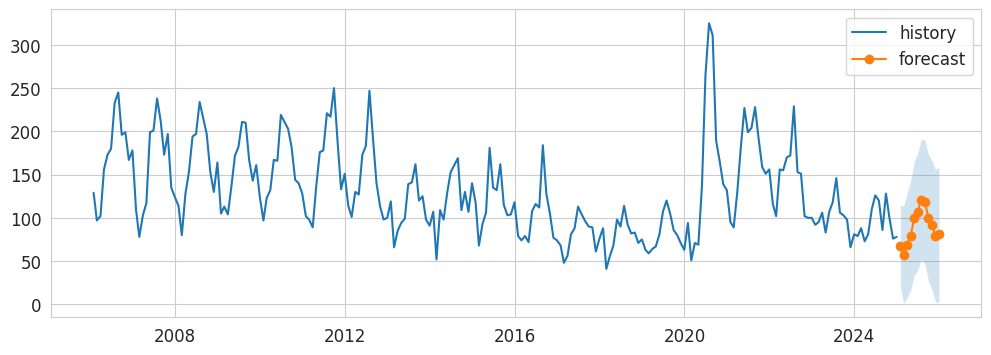

In [46]:
# Cell 14 - refit on full data & forecast future
horizon = 12   # change as needed
model_full = SARIMAX(y, order=order, seasonal_order=seasonal_order,
                     enforce_stationarity=False, enforce_invertibility=False)
res_full = model_full.fit(disp=False, maxiter=200)

future = res_full.get_forecast(steps=horizon)
f_mean = future.predicted_mean
f_ci = future.conf_int()

plt.figure(figsize=(12,4))
plt.plot(y.index, y, label='history')
plt.plot(f_mean.index, f_mean, label='forecast', marker='o')
plt.fill_between(f_ci.index, f_ci.iloc[:,0], f_ci.iloc[:,1], alpha=0.2)
plt.legend()
# plt.savefig("images/time_series_fulldata_forecast.png"); plt.show()

display(pd.DataFrame({'forecast': f_mean, 'lower': f_ci.iloc[:,0], 'upper': f_ci.iloc[:,1]}).head(horizon))


ETS metrics: {'MAE': np.float64(43.6808964239481), 'RMSE': np.float64(52.69369835686623), 'MAPE(%)': np.float64(42.15943338068684)}


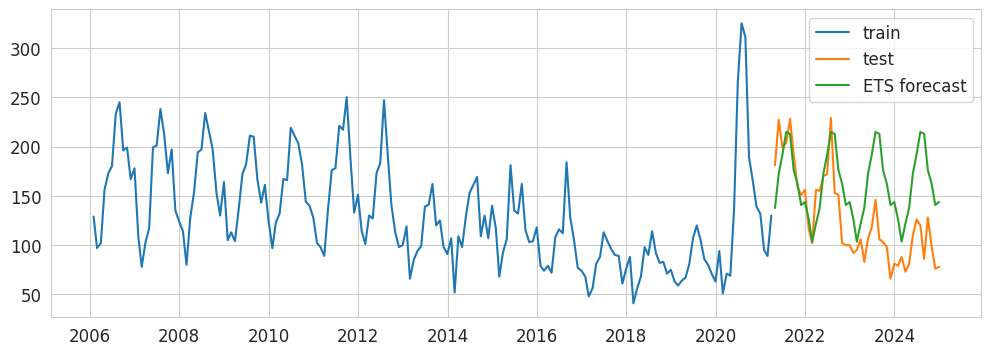

In [47]:
# Cell 15 - ETS comparison
try:
    if len(y) >= period*2:
        ets = ExponentialSmoothing(train, trend='add', seasonal='add', seasonal_periods=period).fit()
    else:
        ets = ExponentialSmoothing(train, trend='add').fit()
    ets_fore = ets.forecast(len(test))
    print("ETS metrics:", metrics(test.values, ets_fore.values))

    plt.figure(figsize=(12,4))
    plt.plot(train, label='train')
    plt.plot(test, label='test')
    plt.plot(ets_fore.index, ets_fore.values, label='ETS forecast')
    plt.legend(); plt.show()
except Exception as e:
    print("ETS failed:", e)


# More EDA

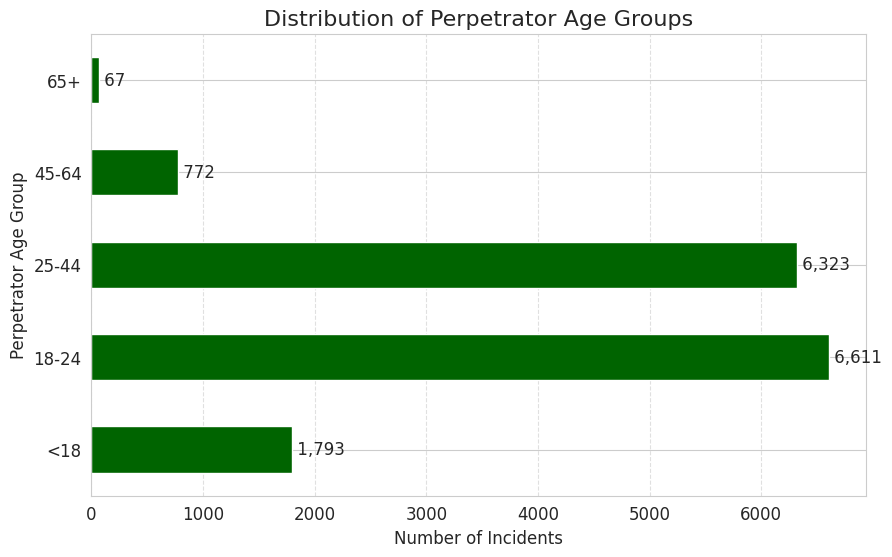

In [48]:


# Define the actual age ranges and the desired order (ascending by age)
age_order = ['<18', '18-24', '25-44', '45-64', '65+']
actual_age_ranges = age_order

# Filter the DataFrame to include only the specified age ranges
filtered_df = df[df['PERP_AGE_GROUP'].isin(actual_age_ranges)]

# Calculate the distribution (value counts) of the filtered age groups
age_distribution = filtered_df['PERP_AGE_GROUP'].value_counts()

# Reindex the distribution Series to enforce the desired ascending age order
# This sets the order for the bars in the horizontal chart (bottom to top).
age_distribution_ordered = age_distribution.reindex(age_order)

# Create the bar chart
plt.figure(figsize=(10, 6))
age_distribution_ordered.plot(kind='barh', color='darkgreen')

# Add labels and title
plt.title('Distribution of Perpetrator Age Groups', fontsize=16)
plt.xlabel('Number of Incidents', fontsize=12)
plt.ylabel('Perpetrator Age Group', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Add the counts on the bars for better readability
for index, (label, value) in enumerate(age_distribution_ordered.items()):
    plt.text(value, index, f' {value:,}', va='center')

# Save the plot
# plt.savefig('images/perp_age_group_distribution.png')
plt.show()

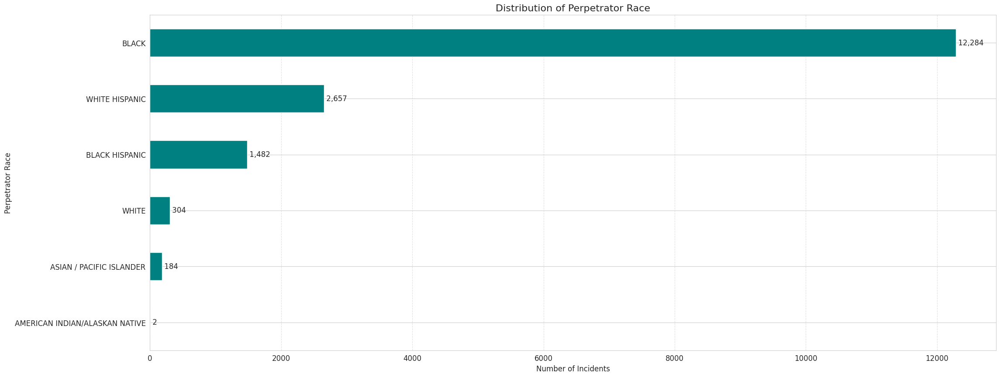

In [49]:
# Define values to exclude
excluded_races = ['UNKNOWN', '(null)']

# Filter the DataFrame to exclude the specified values
filtered_df = df[~df['PERP_RACE'].isin(excluded_races)]

# Calculate the distribution (value counts)
race_distribution = filtered_df['PERP_RACE'].value_counts()

# Sort the distribution in ascending order for a horizontal bar chart
# (This puts the highest count/longest bar at the top)
race_distribution_sorted = race_distribution.sort_values(ascending=True)

# Create the bar chart
plt.figure(figsize=(25, 10))
race_distribution_sorted.plot(kind='barh', color='teal')

# Add labels and title
plt.title('Distribution of Perpetrator Race', fontsize=16)
plt.xlabel('Number of Incidents', fontsize=12)
plt.ylabel('Perpetrator Race', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Add the counts on the bars for better readability
for index, value in enumerate(race_distribution_sorted):
    plt.text(value, index, f' {value:,}', va='center')

# Save the plot
# plt.savefig('images/perp_race_distribution.png')
plt.show()

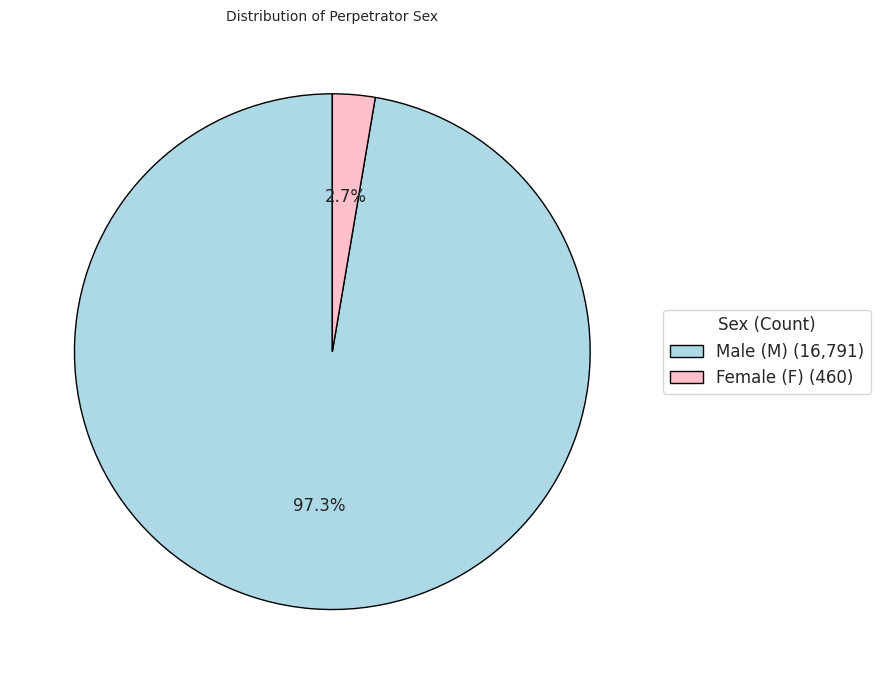

In [50]:
# Define the sex categories to include
included_sexes = ['M', 'F']

# Filter the DataFrame to include only the specified sex categories
filtered_df = df[df['PERP_SEX'].isin(included_sexes)]

# Calculate the distribution (value counts)
sex_distribution = filtered_df['PERP_SEX'].value_counts()

# Ensure the series is indexed for M and F and prepare labels
sex_distribution_reindexed = sex_distribution.reindex(included_sexes).dropna()
labels = ['Male (M)', 'Female (F)']

# Create final labels with counts for the legend
final_labels = [f'{label} ({sex_distribution_reindexed[code]:,})' for code, label in zip(sex_distribution_reindexed.index, labels)]

# Create the pie chart
plt.figure(figsize=(10, 7))
plt.pie(
    sex_distribution_reindexed,
    autopct='%1.1f%%', # Show percentage with one decimal place
    startangle=90,
    colors=['lightblue', 'pink'], # Custom colors
    wedgeprops={'edgecolor': 'black'}
)

# Set the title and legend
plt.title('Distribution of Perpetrator Sex', fontsize=10)

# Create a legend
plt.legend(final_labels,
           title="Sex (Count)",
           loc="center left",
           bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout(rect=[0, 0, 0.8, 1])
# plt.savefig('images/perp_sex_distribution_pie_chart.png')
plt.show()

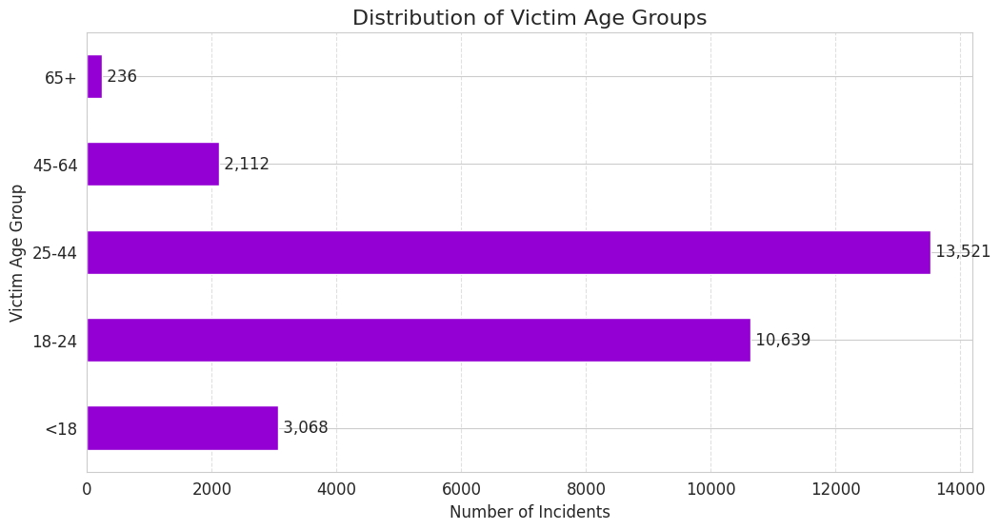

In [51]:

# Define the actual age ranges and the desired order (ascending by age)
age_order = ['<18', '18-24', '25-44', '45-64', '65+']
actual_age_ranges = age_order

# Filter the DataFrame to include only the specified age ranges
filtered_df = df[df['VIC_AGE_GROUP'].isin(actual_age_ranges)]

# Calculate the distribution (value counts) of the filtered age groups
age_distribution = filtered_df['VIC_AGE_GROUP'].value_counts()

# Reindex the distribution Series to enforce the desired ascending age order
age_distribution_ordered = age_distribution.reindex(age_order)

# Create the bar chart
plt.figure(figsize=(12, 6))
age_distribution_ordered.plot(kind='barh', color='darkviolet')

# Add labels and title
plt.title('Distribution of Victim Age Groups', fontsize=16)
plt.xlabel('Number of Incidents', fontsize=12)
plt.ylabel('Victim Age Group', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Add the counts on the bars for better readability
for index, (label, value) in enumerate(age_distribution_ordered.items()):
    plt.text(value, index, f' {value:,}', va='center')

# Save the plot
# plt.savefig('images/vic_age_group_distribution.png')
plt.show()

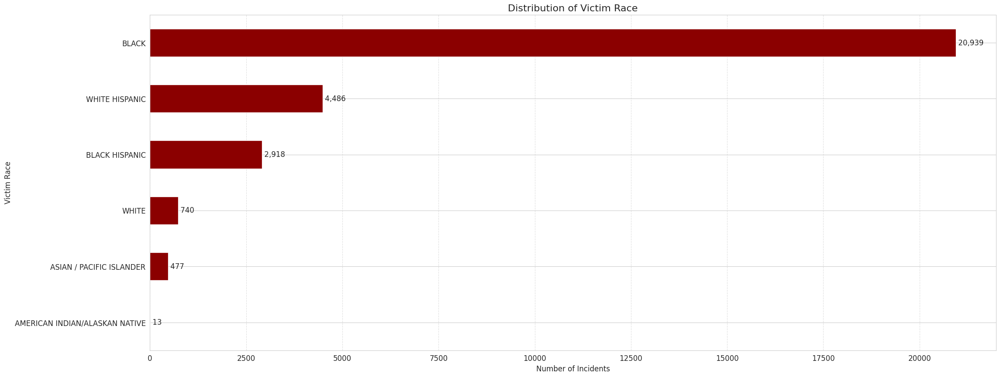

In [52]:
# Define values to exclude
excluded_races = ['UNKNOWN', '(null)']

# Filter the DataFrame to exclude the specified values
filtered_df = df[~df['VIC_RACE'].isin(excluded_races)]

# Calculate the distribution (value counts)
race_distribution = filtered_df['VIC_RACE'].value_counts()

# Sort the distribution in ascending order for a horizontal bar chart
# (This puts the highest count/longest bar at the top)
race_distribution_sorted = race_distribution.sort_values(ascending=True)

# Create the bar chart
plt.figure(figsize=(25, 10))
race_distribution_sorted.plot(kind='barh', color='darkred')

# Add labels and title
plt.title('Distribution of Victim Race', fontsize=16)
plt.xlabel('Number of Incidents', fontsize=12)
plt.ylabel('Victim Race', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Add the counts on the bars for better readability
for index, value in enumerate(race_distribution_sorted):
    plt.text(value, index, f' {value:,}', va='center')

# Save the plot
# plt.savefig('images/vic_race_distribution.png')
plt.show()

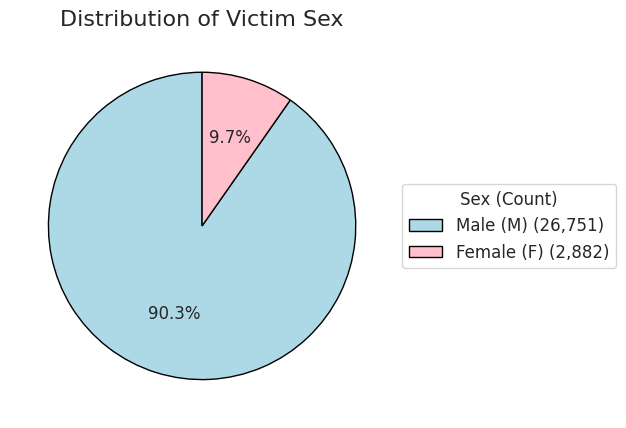

In [53]:
# Define the sex categories to include
included_sexes = ['M', 'F']

# Filter the DataFrame to include only the specified sex categories
filtered_df = df[df['VIC_SEX'].isin(included_sexes)]

# Calculate the distribution (value counts)
sex_distribution = filtered_df['VIC_SEX'].value_counts()

# Ensure the series is indexed for M and F and prepare labels
# Note: Reindexing here assumes 'M' is before 'F' in the desired labels list,
# which matches the count order for M > F.
sex_distribution_reindexed = sex_distribution.reindex(included_sexes).dropna()
labels = ['Male (M)', 'Female (F)']

# Create final labels with counts for the legend
final_labels = [f'{label} ({sex_distribution_reindexed[code]:,})' for code, label in zip(sex_distribution_reindexed.index, labels)]

# Create the pie chart
plt.figure(figsize=(8, 8))
plt.pie(
    sex_distribution_reindexed,
    autopct='%1.1f%%', # Show percentage with one decimal place
    startangle=90,
    colors=['lightblue', 'pink'], # Custom colors
    wedgeprops={'edgecolor': 'black'}
)

# Set the title and legend
plt.title('Distribution of Victim Sex', fontsize=16)

# Create a legend
plt.legend(final_labels,
           title="Sex (Count)",
           loc="center left",
           bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout(rect=[0, 0, 0.8, 1])
# plt.savefig('images/vic_sex_distribution_pie_chart.png')
plt.show()

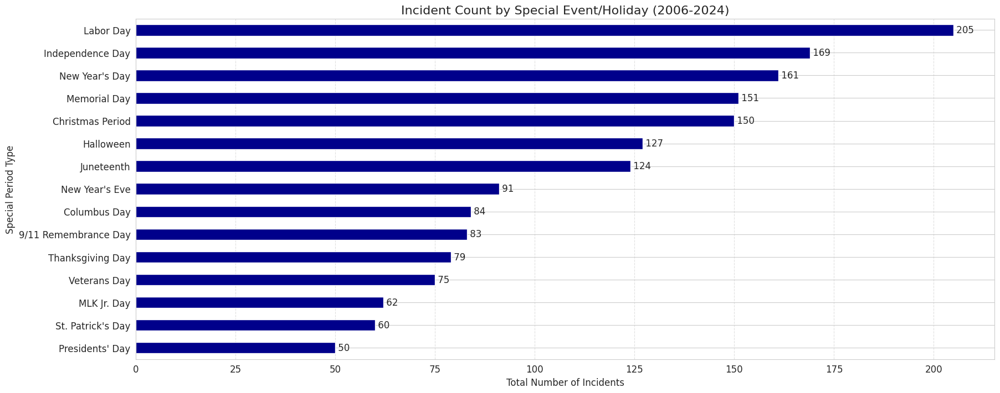

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import date, timedelta
import calendar

# --- Date Calculation Helpers ---

def get_nth_weekday_of_month(year, month, weekday, n):
    """
    Calculates the date of the nth occurrence of a specific weekday in a month.
    (weekday: 0=Mon, 6=Sun) (n: 1=1st, 2=2nd, etc.)
    """
    first_day_of_month = date(year, month, 1)
    # Calculate how many days to move to reach the first desired weekday
    days_to_first_occurrence = (weekday - first_day_of_month.weekday() + 7) % 7
    # Date of the 1st desired weekday
    target_date = first_day_of_month + timedelta(days=days_to_first_occurrence)
    
    # Add (n-1) weeks to get the nth occurrence
    target_date += timedelta(weeks=n - 1)
    
    # Check if the calculated date is still in the correct month
    if target_date.month == month:
        return target_date
    return None

def get_last_weekday_of_month(year, month, weekday):
    """Calculates the date of the last occurrence of a specific weekday in a month."""
    # Start from the 1st of the next month and go back one day, then search backward
    if month == 12:
        start_date = date(year + 1, 1, 1)
    else:
        start_date = date(year, month + 1, 1)
        
    last_day_of_month = start_date - timedelta(days=1)
    
    # Calculate how many days to go back to reach the last desired weekday
    days_to_go_back = (last_day_of_month.weekday() - weekday + 7) % 7
    
    return last_day_of_month - timedelta(days=days_to_go_back)

# --- Pre-calculate all special dates (2006 to 2024) ---
SPECIAL_DATES = {}
YEARS = range(2006, 2025) # Dataset range based on previous analysis

for year in YEARS:
    # 1. Fixed-Date Holidays/Events
    fixed_dates = {
        "New Year's Day": (1, 1), 
        "St. Patrick's Day": (3, 17), 
        "Juneteenth": (6, 19), 
        "Independence Day": (7, 4), 
        "9/11 Remembrance Day": (9, 11), 
        "Halloween": (10, 31), 
        "Veterans Day": (11, 11), 
        "Christmas Period": (12, 25), 
        "New Year's Eve": (12, 31),
        "Christmas Period (Eve)": (12, 24),
    }
    for name, (month, day) in fixed_dates.items():
        SPECIAL_DATES.setdefault(name, set()).add(date(year, month, day))

    # 2. Variable Federal Holidays (based on weekday rules)
    SPECIAL_DATES.setdefault("MLK Jr. Day", set()).add(get_nth_weekday_of_month(year, 1, calendar.MONDAY, 3))       # 3rd Monday in Jan
    SPECIAL_DATES.setdefault("Presidents' Day", set()).add(get_nth_weekday_of_month(year, 2, calendar.MONDAY, 3))   # 3rd Monday in Feb
    SPECIAL_DATES.setdefault("Memorial Day", set()).add(get_last_weekday_of_month(year, 5, calendar.MONDAY))        # Last Monday in May
    SPECIAL_DATES.setdefault("Labor Day", set()).add(get_nth_weekday_of_month(year, 9, calendar.MONDAY, 1))         # 1st Monday in Sep
    SPECIAL_DATES.setdefault("Columbus Day", set()).add(get_nth_weekday_of_month(year, 10, calendar.MONDAY, 2))      # 2nd Monday in Oct
    SPECIAL_DATES.setdefault("Thanksgiving Day", set()).add(get_nth_weekday_of_month(year, 11, calendar.THURSDAY, 4)) # 4th Thursday in Nov
    
# Clean up and consolidate dates
for key in SPECIAL_DATES:
    SPECIAL_DATES[key] = tuple(d for d in SPECIAL_DATES[key] if d is not None)

# --- Classification Function ---

def classify_period_ultimate(incident_date):
    """Classifies an incident date into a specific holiday or 'Normal Day'."""
    
    # 1. Check for specific holidays/events
    for name, dates_list in SPECIAL_DATES.items():
        if incident_date in dates_list:
            # Group Christmas Eve/Day under one name
            if name in ["Christmas Period", "Christmas Period (Eve)"]:
                return "Christmas Period"
            return name
    
    # 2. No summer classification (removed)
    return "Normal Day"


# --- Main Analysis ---

# Load the dataset
df = pd.read_csv('NYPD_cleaned.csv')
df['OCCUR_DATETIME'] = pd.to_datetime(df['OCCUR_DATETIME'])
df['OCCUR_DATE'] = df['OCCUR_DATETIME'].dt.date

# Apply the classification
df['PERIOD_TYPE'] = df['OCCUR_DATE'].apply(classify_period_ultimate)

# Count incidents per period
period_counts = df['PERIOD_TYPE'].value_counts()

# Filter out "Normal Day" to focus on the special periods
special_periods_counts = period_counts[period_counts.index != 'Normal Day']

# Sort for plotting (ascending for barh, so highest count is at the top)
special_periods_counts_sorted = special_periods_counts.sort_values(ascending=True)

# Create the bar chart
plt.figure(figsize=(20, 8))
special_periods_counts_sorted.plot(kind='barh', color='darkblue')

# Add labels and title
plt.title('Incident Count by Special Event/Holiday (2006-2024)', fontsize=16)
plt.xlabel('Total Number of Incidents', fontsize=12)
plt.ylabel('Special Period Type', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)

# Add the counts on the bars for better readability
for index, value in enumerate(special_periods_counts_sorted):
    plt.text(value, index, f' {value:,}', va='center')

# Save the plot
# plt.savefig('images/incident_count_by_special_period.png')
plt.show()

In [55]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches


In [56]:
data = pd.read_csv("NYPD_cleaned.csv")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29645 entries, 0 to 29644
Data columns (total 21 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               29645 non-null  int64  
 1   INCIDENT_KEY             29645 non-null  int64  
 2   BORO                     29645 non-null  object 
 3   LOC_OF_OCCUR_DESC        29645 non-null  object 
 4   PRECINCT                 29645 non-null  int64  
 5   JURISDICTION_CODE        29645 non-null  float64
 6   LOC_CLASSFCTN_DESC       29645 non-null  object 
 7   STATISTICAL_MURDER_FLAG  29645 non-null  bool   
 8   PERP_AGE_GROUP           29645 non-null  object 
 9   PERP_SEX                 29645 non-null  object 
 10  PERP_RACE                29645 non-null  object 
 11  VIC_AGE_GROUP            29645 non-null  object 
 12  VIC_SEX                  29645 non-null  object 
 13  VIC_RACE                 29645 non-null  object 
 14  X_COORD_CD            

### Map of shooting from 2006 to 2024

Generating 19 maps with borough boundaries...


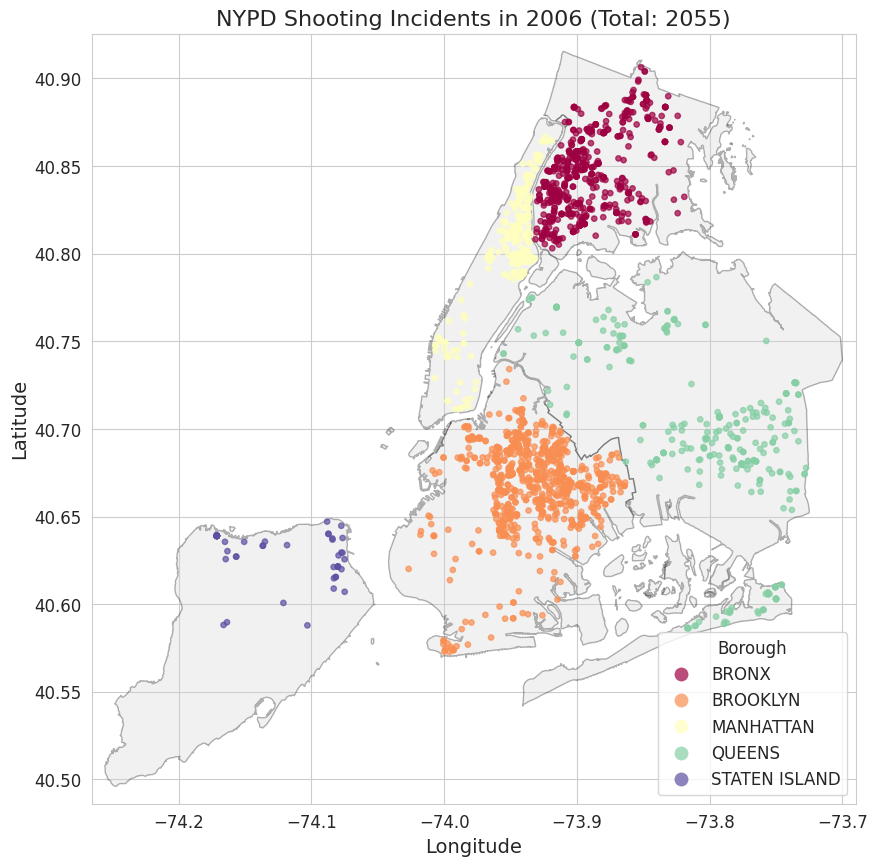

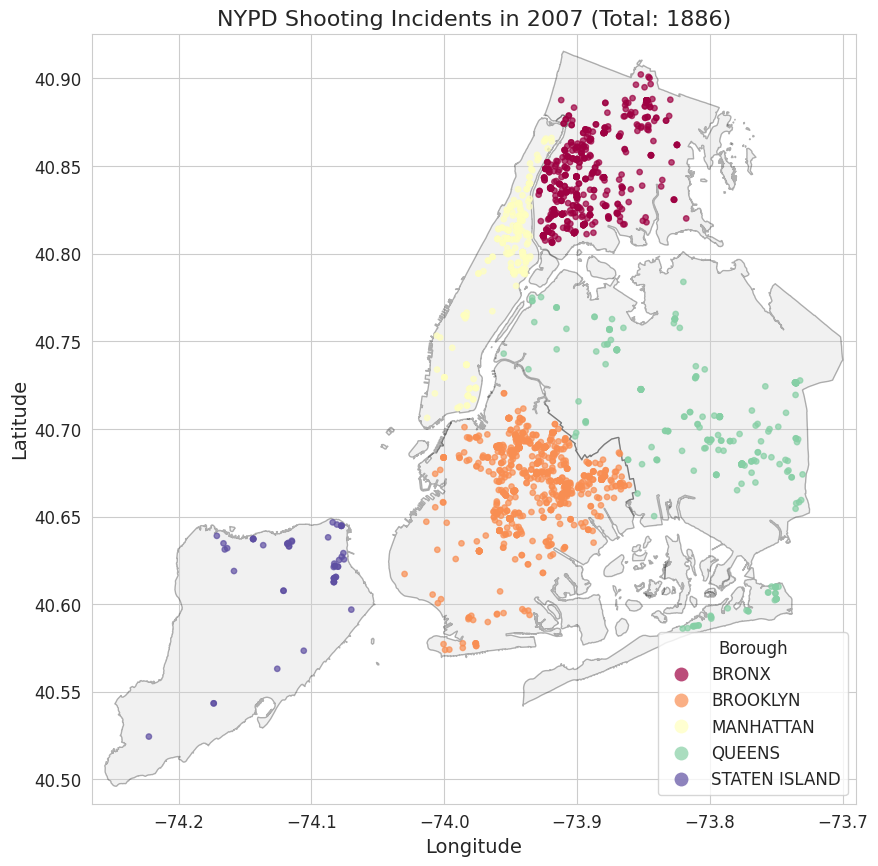

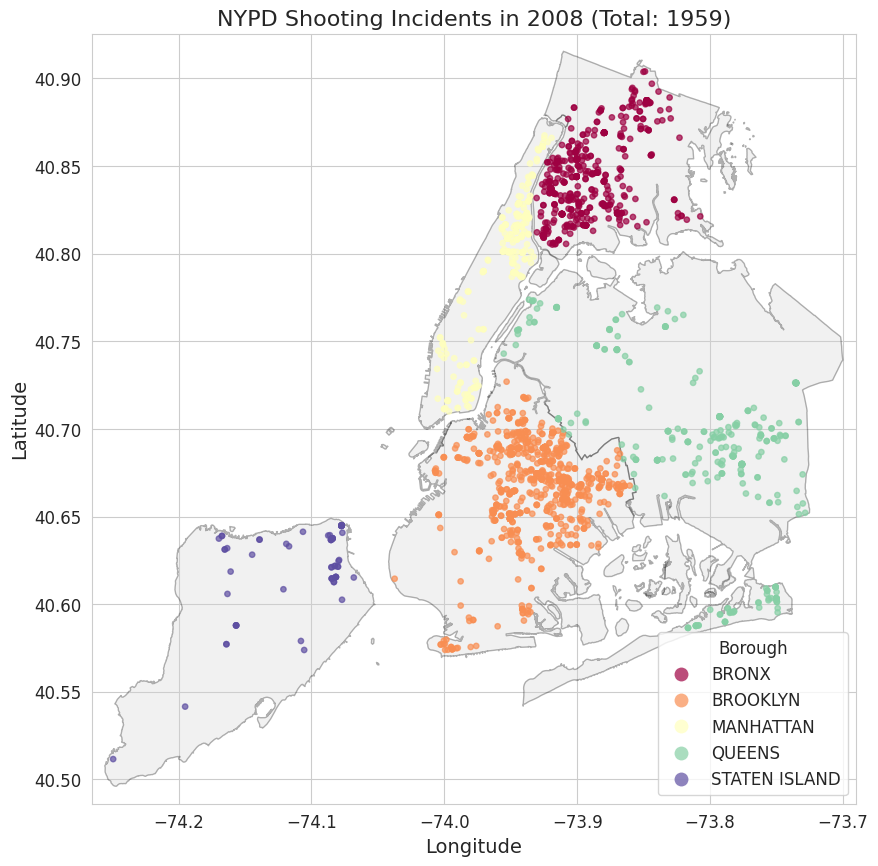

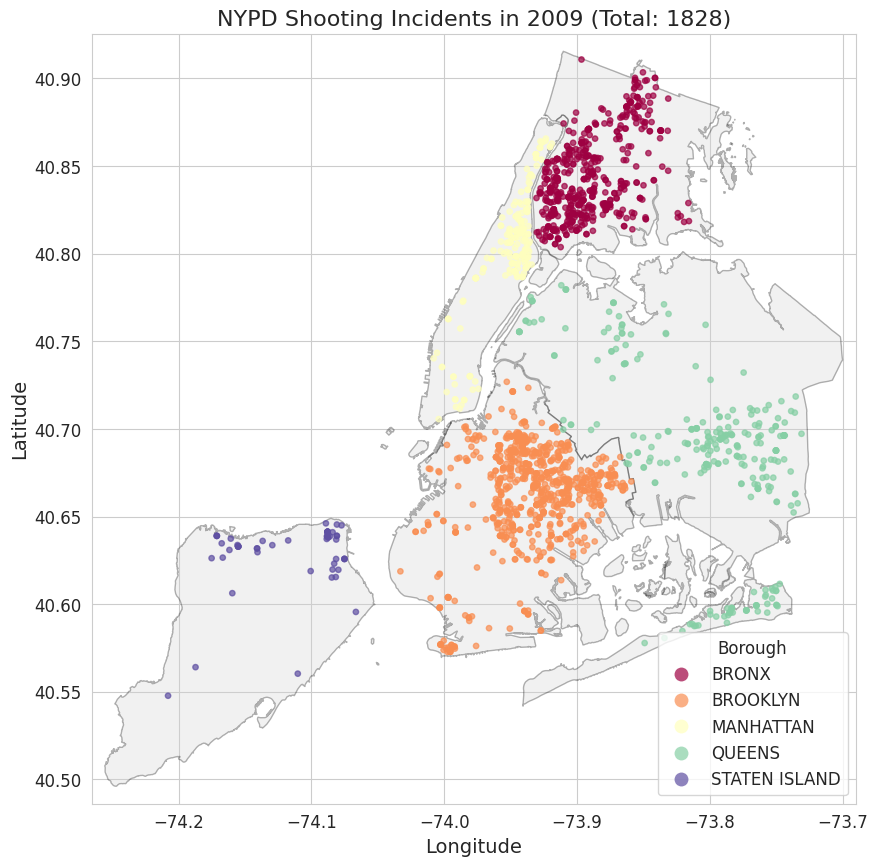

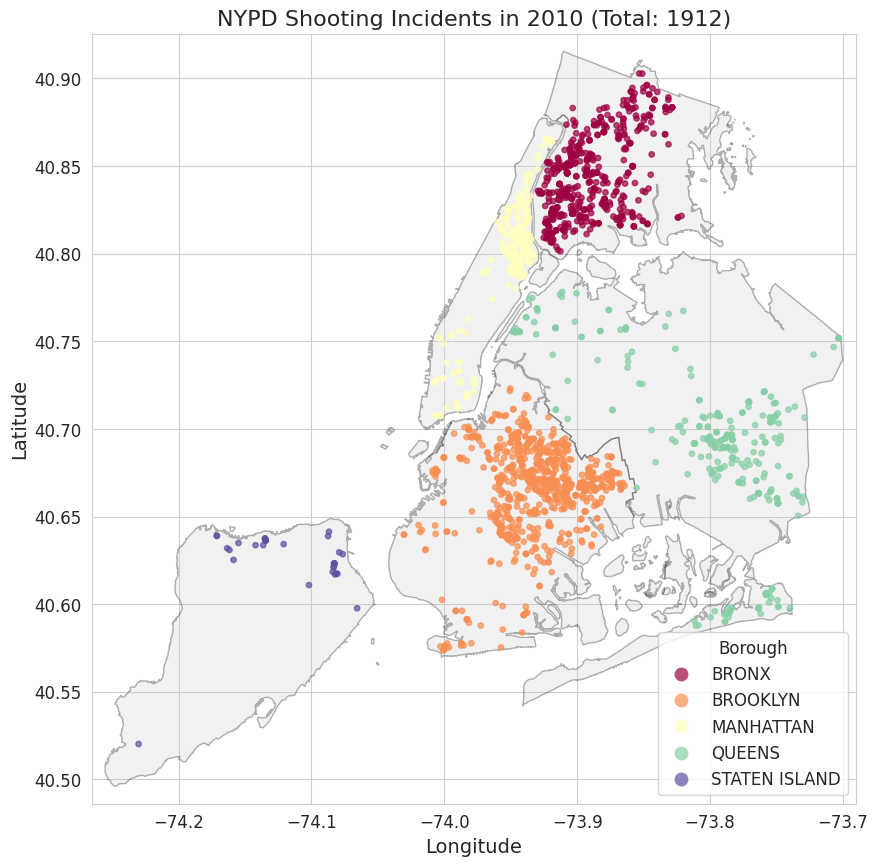

...

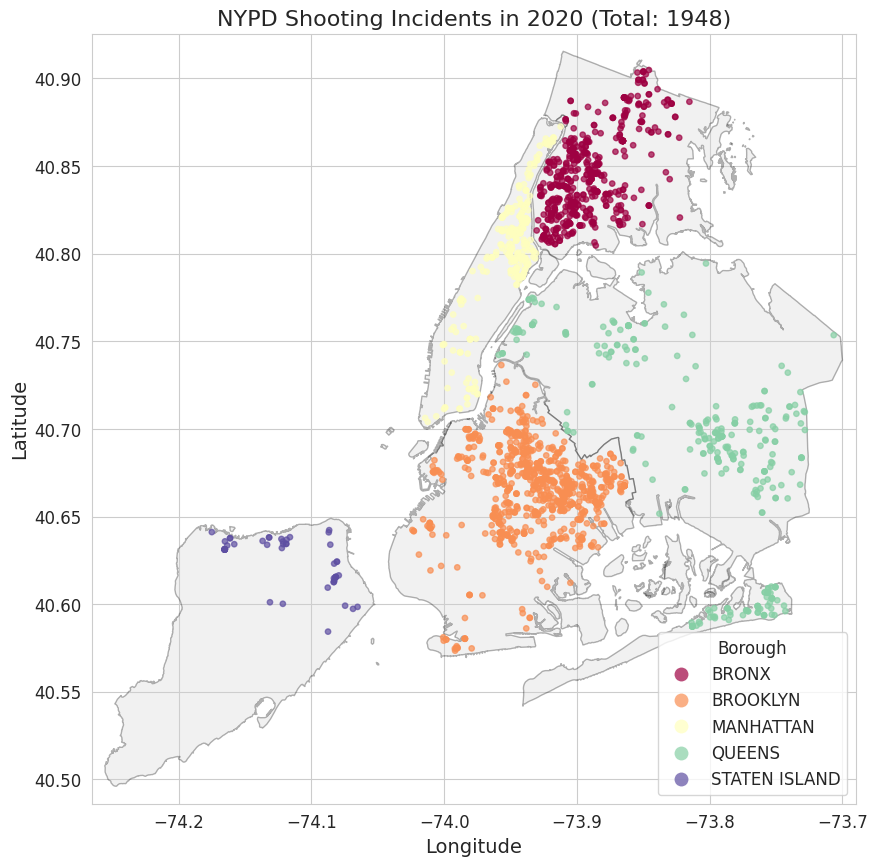

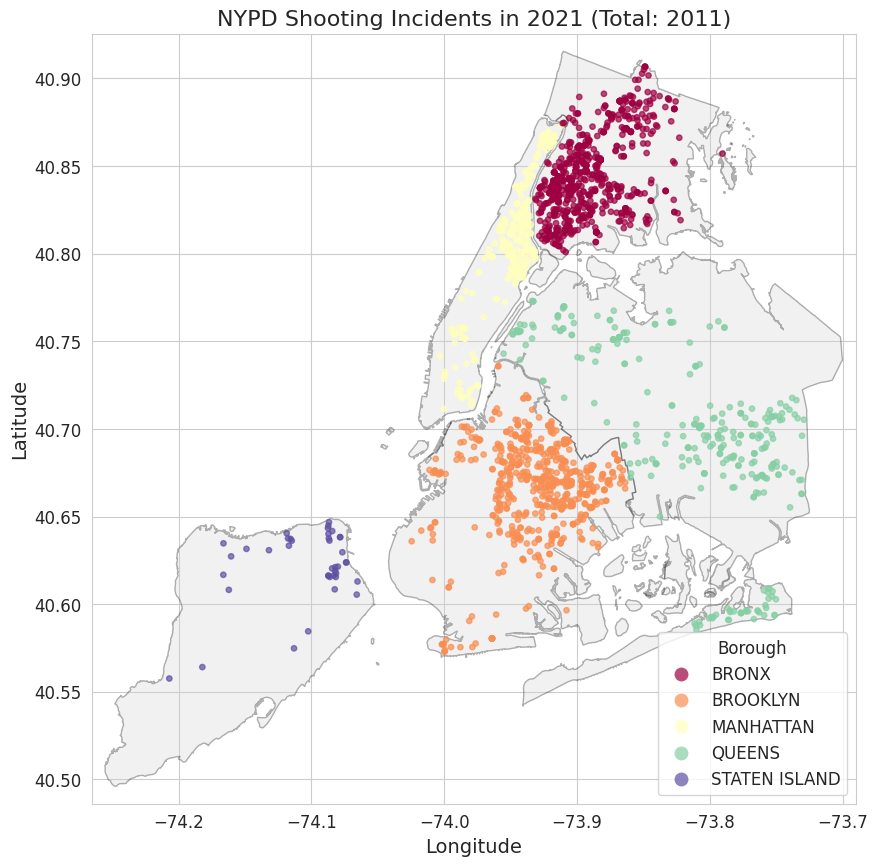

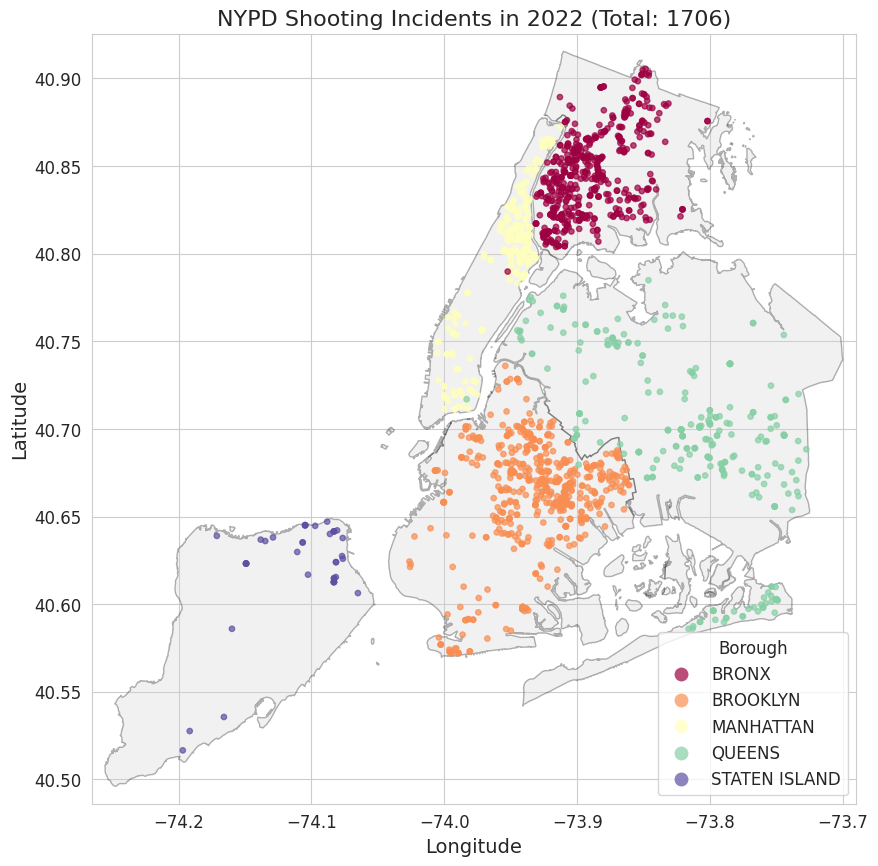

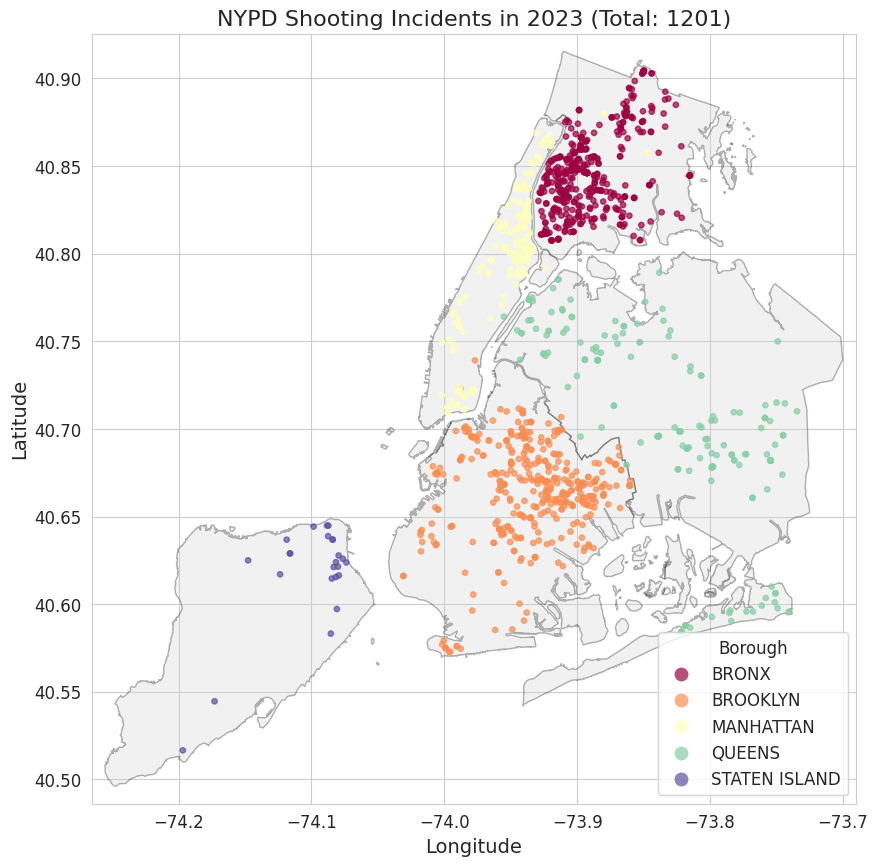

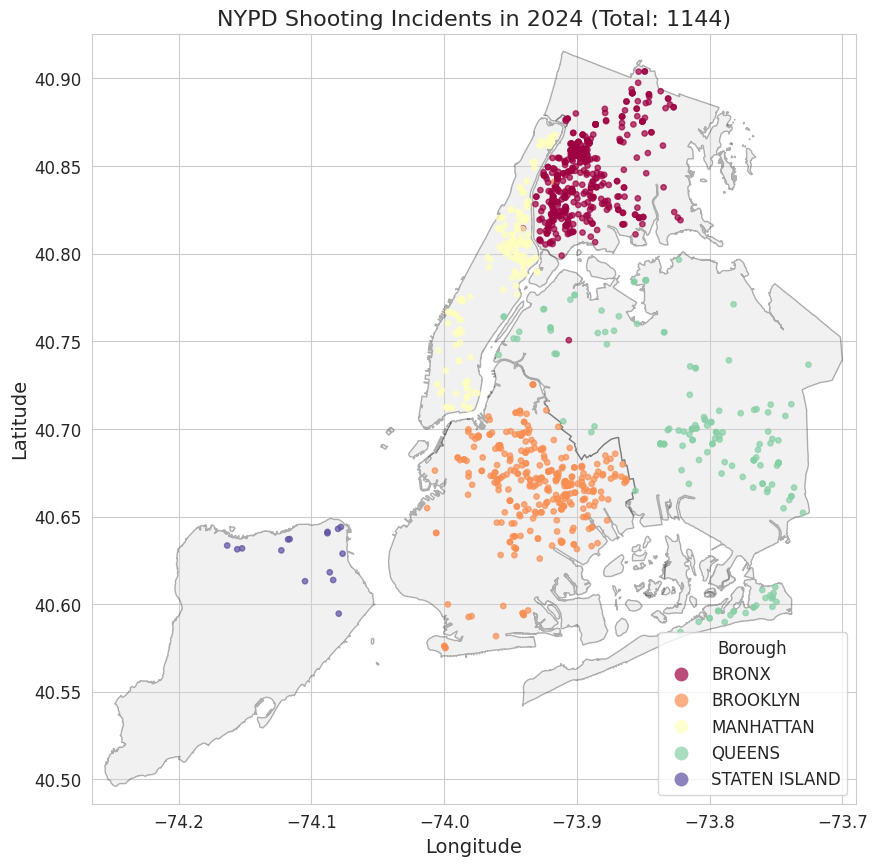


All maps generated successfully.
Generated files: ['shooting/shooting_map_with_boundaries_2006.png', 'shooting/shooting_map_with_boundaries_2007.png', 'shooting/shooting_map_with_boundaries_2008.png', 'shooting/shooting_map_with_boundaries_2009.png', 'shooting/shooting_map_with_boundaries_2010.png', 'shooting/shooting_map_with_boundaries_2011.png', 'shooting/shooting_map_with_boundaries_2012.png', 'shooting/shooting_map_with_boundaries_2013.png', 'shooting/shooting_map_with_boundaries_2014.png', 'shooting/shooting_map_with_boundaries_2015.png', 'shooting/shooting_map_with_boundaries_2016.png', 'shooting/shooting_map_with_boundaries_2017.png', 'shooting/shooting_map_with_boundaries_2018.png', 'shooting/shooting_map_with_boundaries_2019.png', 'shooting/shooting_map_with_boundaries_2020.png', 'shooting/shooting_map_with_boundaries_2021.png', 'shooting/shooting_map_with_boundaries_2022.png', 'shooting/shooting_map_with_boundaries_2023.png', 'shooting/shooting_map_with_boundaries_2024.png'

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# 1. Load the NYPD shooting data
data = pd.read_csv("NYPD_cleaned.csv")
data['OCCUR_DATETIME'] = pd.to_datetime(data['OCCUR_DATETIME'])
data['Year'] = data['OCCUR_DATETIME'].dt.year

# Filter for the relevant years (2006 to 2024) and drop rows with missing coordinates
map_data = data[(data['Year'] >= 2006) & (data['Year'] <= 2024)]
map_data = map_data.dropna(subset=['Longitude', 'Latitude', 'BORO'])

# Convert the shooting incident data to a GeoDataFrame (CRS: WGS 84)
TARGET_CRS = "EPSG:4326"
gdf_shooting = gpd.GeoDataFrame(
    map_data,
    geometry=gpd.points_from_xy(map_data.Longitude, map_data.Latitude),
    crs=TARGET_CRS
)

# 2. Load the NYC Borough Shapefile
# The shapefile name inside the zip is 'nybb.shp'
gdf_boroughs = gpd.read_file("nybb.shp")

# 3. CRS Transformation
# Convert the borough boundaries (originally State Plane Long Island) to WGS 84
gdf_boroughs_wgs84 = gdf_boroughs.to_crs(TARGET_CRS)

# Define consistent map boundaries based on the boroughs in WGS 84
minx, miny, maxx, maxy = gdf_boroughs_wgs84.total_bounds
# Add a small buffer to the bounds for better visualization
buffer = 0.01
minx -= buffer
miny -= buffer
maxx += buffer
maxy += buffer


years_to_plot = sorted(gdf_shooting['Year'].unique())
generated_files = []

# 4. Generate Yearly Maps
print(f"Generating {len(years_to_plot)} maps with borough boundaries...")
for year in years_to_plot:
    yearly_data_wgs84 = gdf_shooting[gdf_shooting['Year'] == year]

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    # Plot the borough boundaries
    gdf_boroughs_wgs84.plot(ax=ax,
                         edgecolor='black',
                         facecolor='lightgrey', # Set a light background color
                         linewidth=1.0,
                         alpha=0.3) # Make the boundaries slightly transparent

    # Plot the shooting incidents
    yearly_data_wgs84.plot(ax=ax,
                        marker='o',
                        column='BORO', # Color points by Borough
                        cmap='Spectral',
                        markersize=15,
                        alpha=0.7,
                        legend=True,
                        legend_kwds={'loc': 'lower right', 'title': 'Borough'})

    # Set consistent map limits
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)

    ax.set_title(f'NYPD Shooting Incidents in {year} (Total: {len(yearly_data_wgs84)})', fontsize=16)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    filename = f'shooting/shooting_map_with_boundaries_{year}.png'
    # plt.savefig(filename, bbox_inches='tight')
    plt.show()
    generated_files.append(filename)

print("\nAll maps generated successfully.")
print(f"Generated files: {generated_files}")

### Map of murder from 2006 to 2024

Generating 19 maps for Murder Incidents...


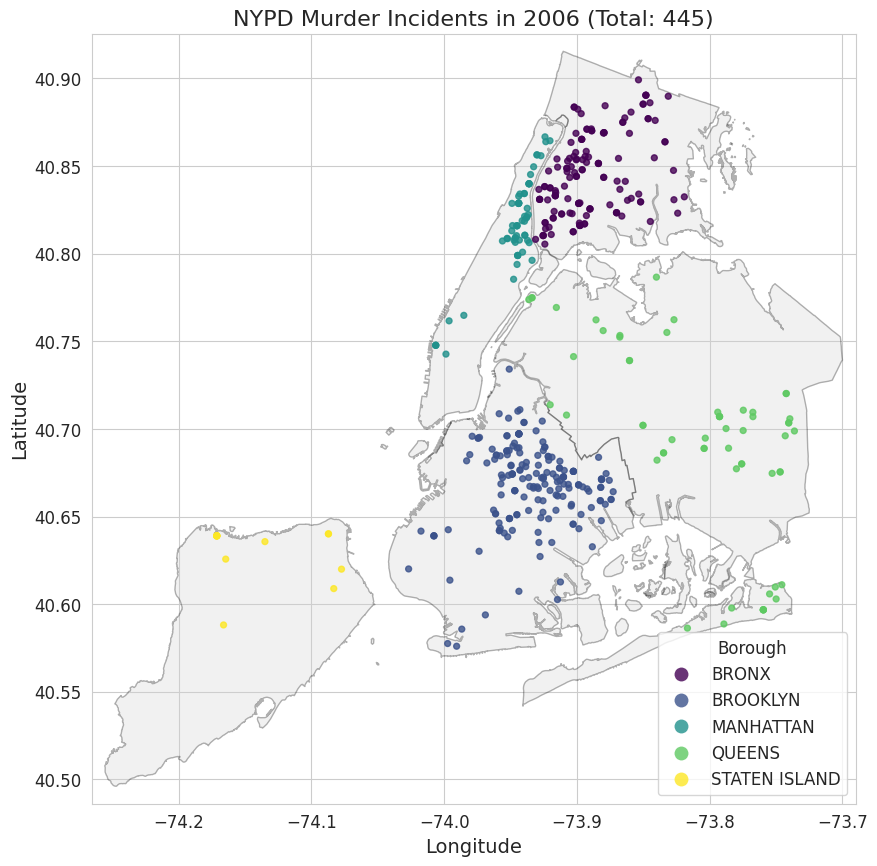

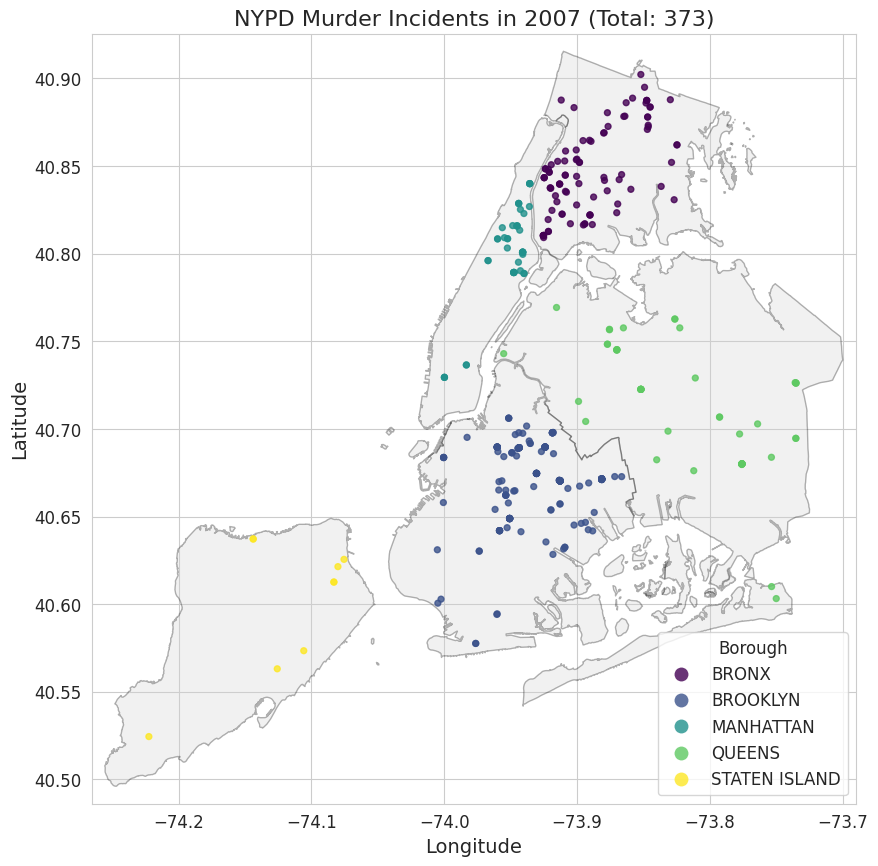

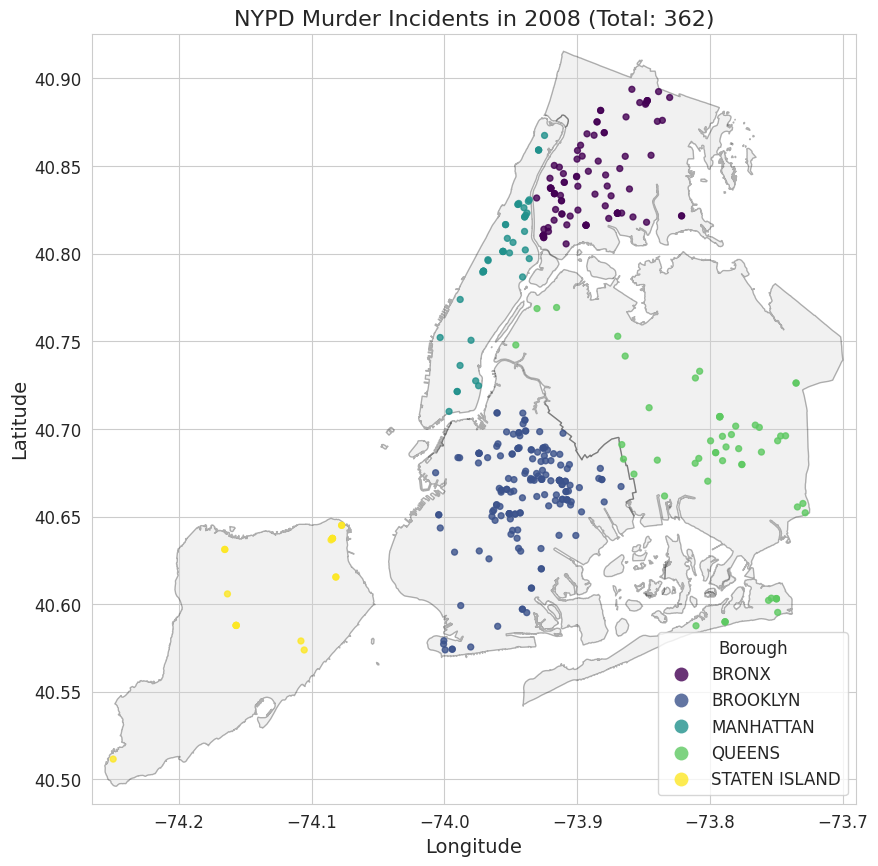

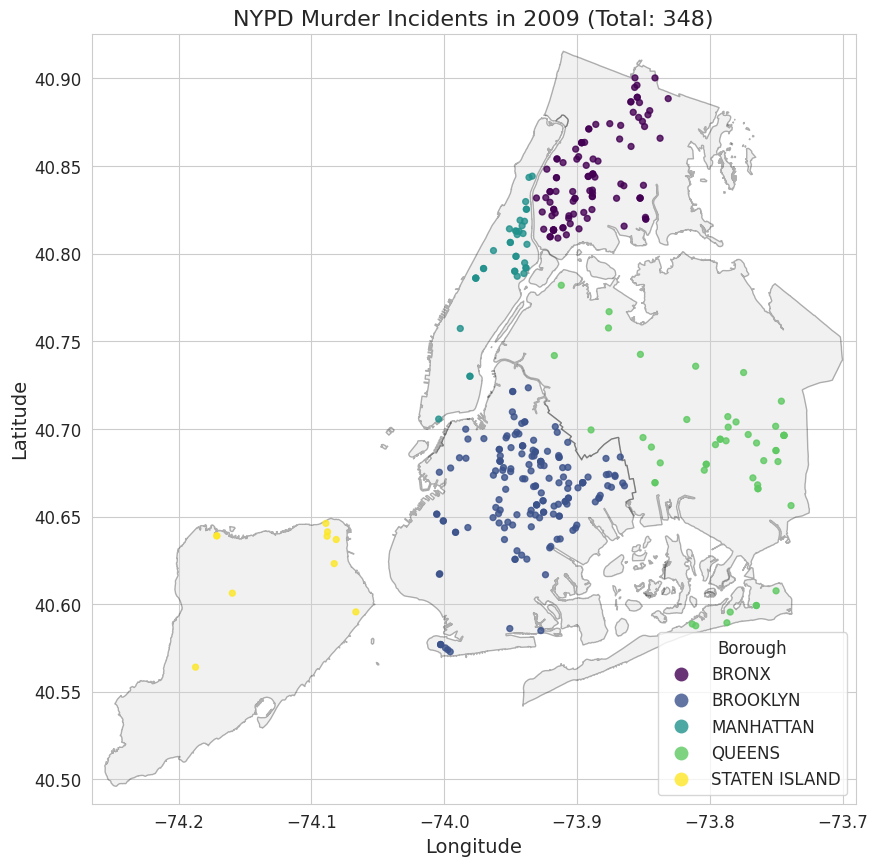

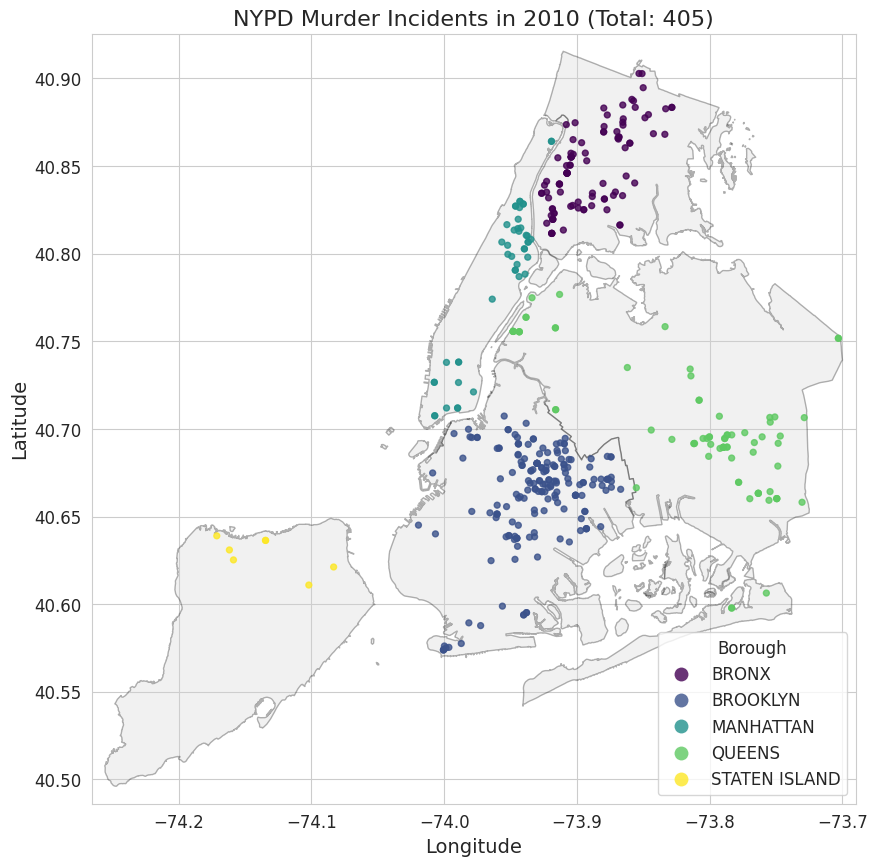

...

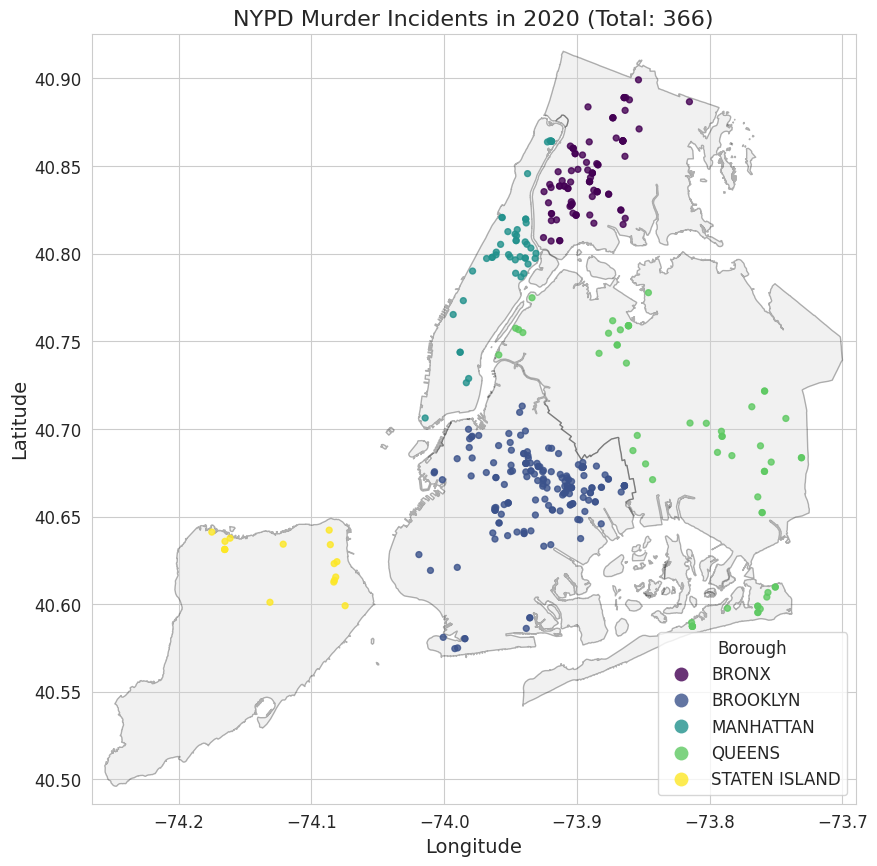

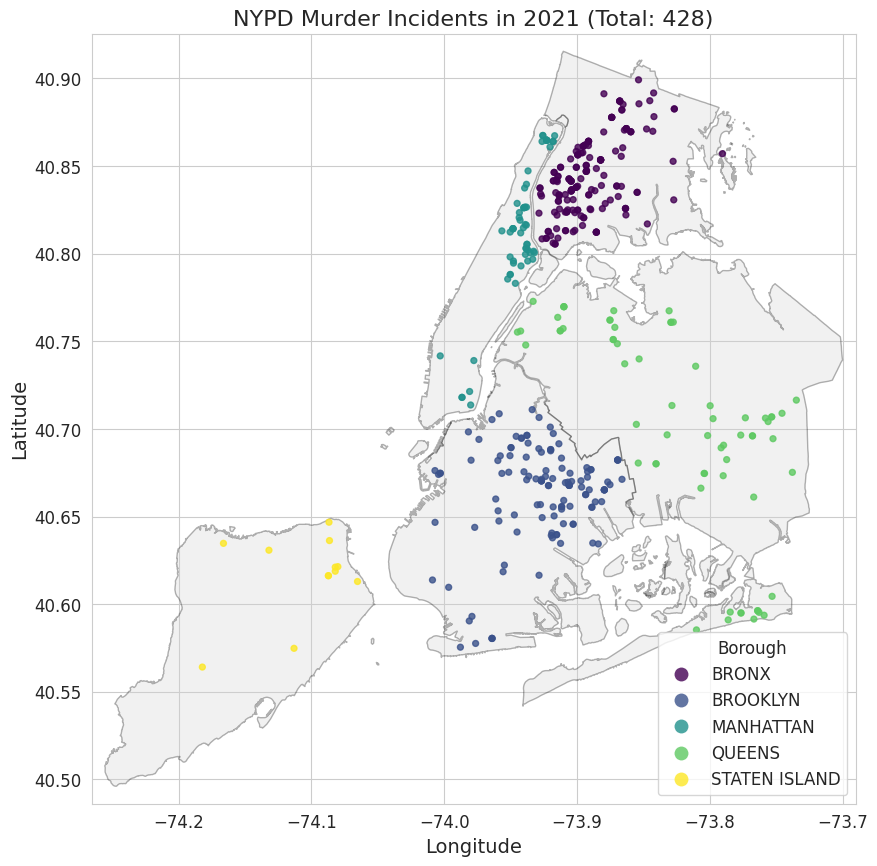

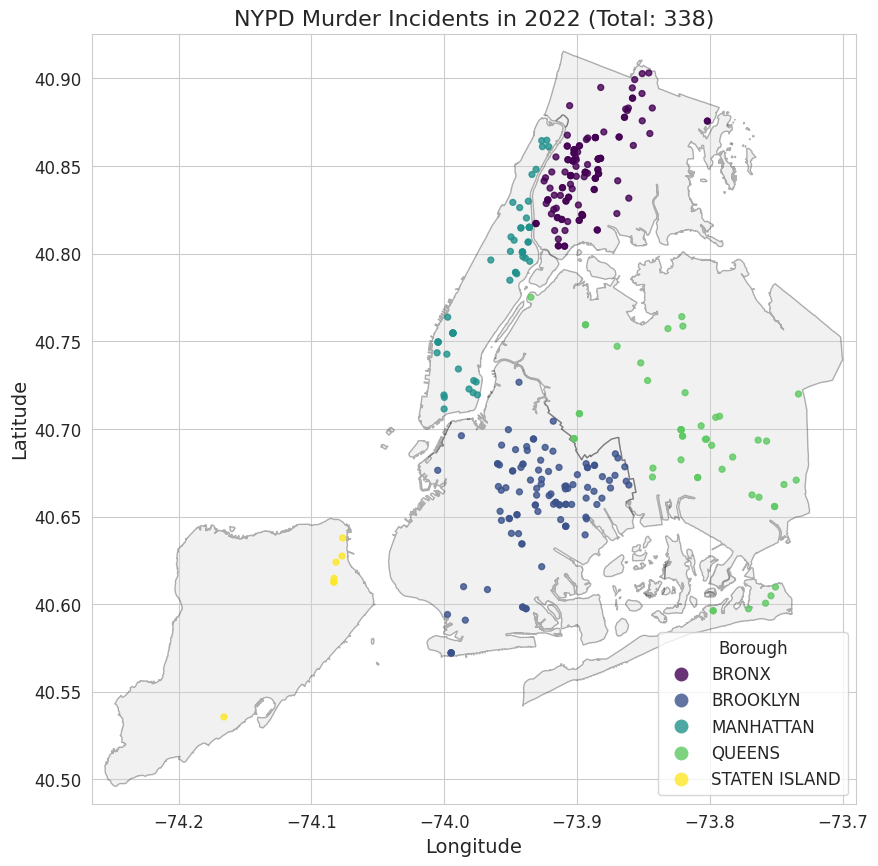

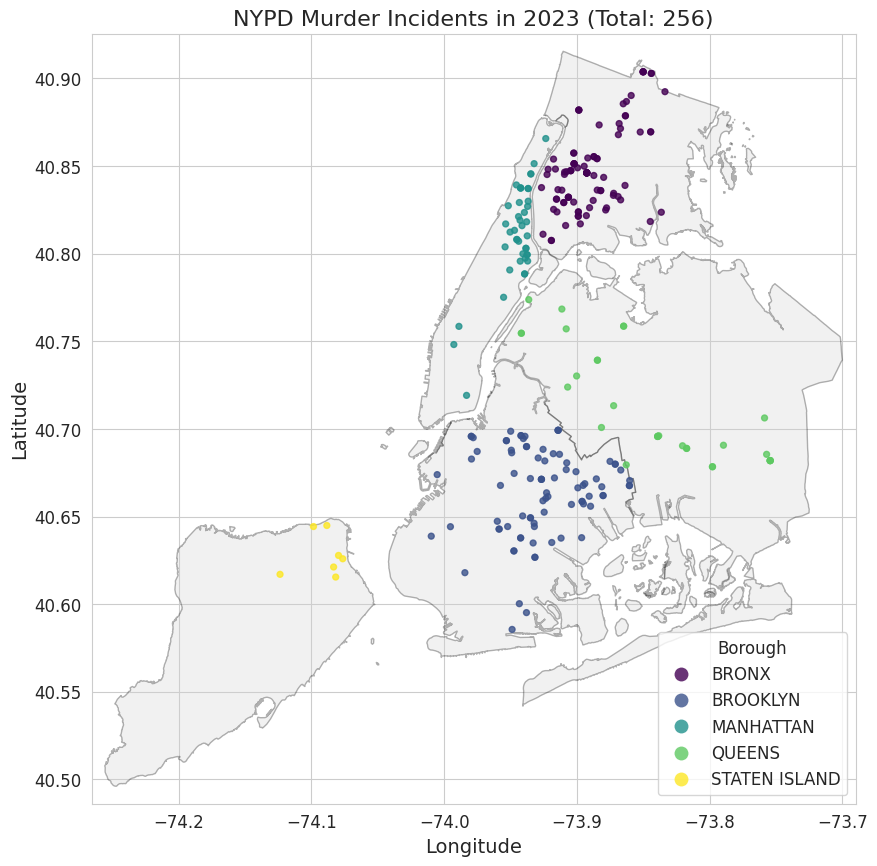

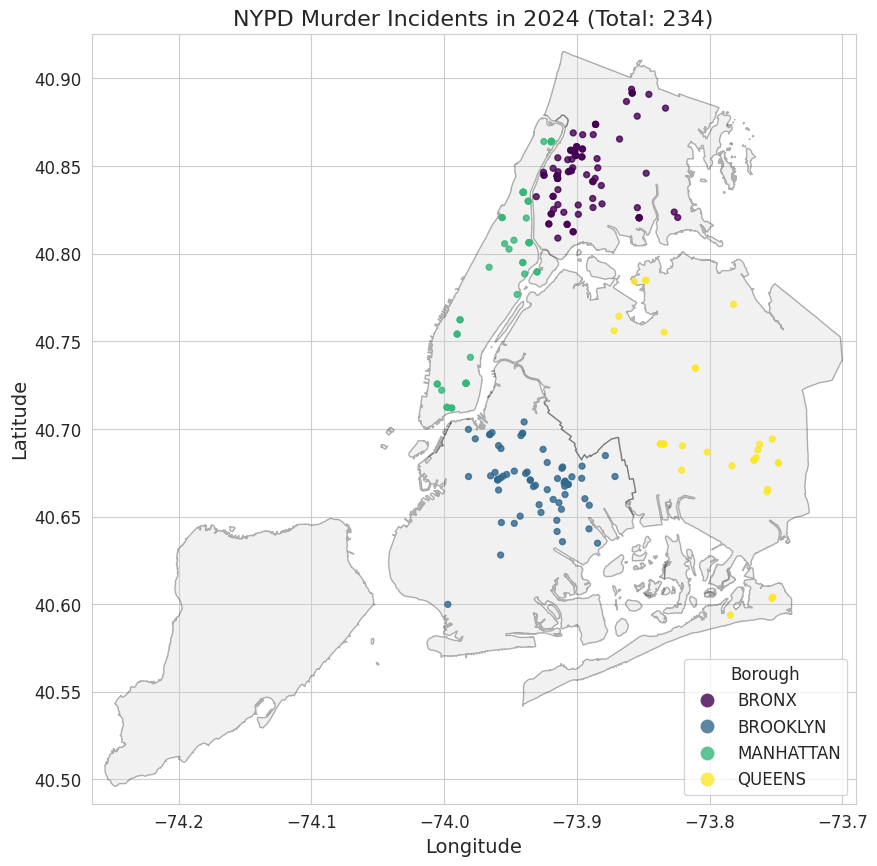


Map generation complete. Check your files for the yearly plots.


In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import warnings
import os

# Suppress minor warnings for cleaner output
warnings.filterwarnings('ignore')

# --- Configuration ---
# Your incident data file
DATA_FILE = "NYPD_cleaned.csv"
# The name of the shapefile provided inside your zip
SHAPE_FILE = "nybb.shp"
# Target Coordinate System for plotting (WGS 84)
TARGET_CRS = "EPSG:4326"

# 1. Load Incident Data and Filter for Murder
data = pd.read_csv(DATA_FILE)
data['OCCUR_DATETIME'] = pd.to_datetime(data['OCCUR_DATETIME'])
data['Year'] = data['OCCUR_DATETIME'].dt.year

# Filter for Incidents from 2006 to 2024 where STATISTICAL_MURDER_FLAG is True
map_data = data[
    (data['Year'] >= 2006) &
    (data['Year'] <= 2024) &
    (data['STATISTICAL_MURDER_FLAG'] == True)
].dropna(subset=['Longitude', 'Latitude', 'BORO'])

# Convert incident data to a GeoDataFrame
gdf_murder = gpd.GeoDataFrame(
    map_data,
    geometry=gpd.points_from_xy(map_data.Longitude, map_data.Latitude),
    crs=TARGET_CRS
)

# 2. Load and Prepare Borough Boundaries
try:
    # Read the shapefile
    gdf_boroughs = gpd.read_file(SHAPE_FILE)
    
    # Convert the borough boundaries (originally State Plane Long Island) to WGS 84
    gdf_boroughs_wgs84 = gdf_boroughs.to_crs(TARGET_CRS)
    has_boundaries = True

    # Define consistent map boundaries based on the boroughs
    minx, miny, maxx, maxy = gdf_boroughs_wgs84.total_bounds
    # Add a small buffer to the bounds for better visualization
    buffer = 0.01
    minx -= buffer
    miny -= buffer
    maxx += buffer
    maxy += buffer

except Exception as e:
    print(f"Warning: Could not load or process shapefile '{SHAPE_FILE}'. Maps will show points only.")
    print(f"Error details: {e}")
    # Fallback to incident data bounds if shapefile fails
    minx, miny, maxx, maxy = gdf_murder.total_bounds.values
    has_boundaries = False


years_to_plot = sorted(gdf_murder['Year'].unique())
generated_files = []

# 3. Generate Yearly Maps
print(f"Generating {len(years_to_plot)} maps for Murder Incidents...")
for year in years_to_plot:
    yearly_data = gdf_murder[gdf_murder['Year'] == year]

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    if has_boundaries:
        # Plot the borough boundaries
        gdf_boroughs_wgs84.plot(ax=ax,
                             edgecolor='black',
                             facecolor='lightgrey',
                             linewidth=1.0,
                             alpha=0.3)

    # Plot the murder incidents
    yearly_data.plot(ax=ax,
                    marker='o',
                    column='BORO', # Color points by Borough
                    cmap='viridis', # Distinct color map for incidents
                    markersize=18,
                    alpha=0.8,
                    legend=True,
                    legend_kwds={'loc': 'lower right', 'title': 'Borough'})

    # Set consistent map limits
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)

    ax.set_title(f'NYPD Murder Incidents in {year} (Total: {len(yearly_data)})', fontsize=16)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

    filename = f'murder/murder_map_with_boundaries_{year}.png'
    # plt.savefig(filename, bbox_inches='tight')
    plt.show()
    generated_files.append(filename)

print("\nMap generation complete. Check your files for the yearly plots.")

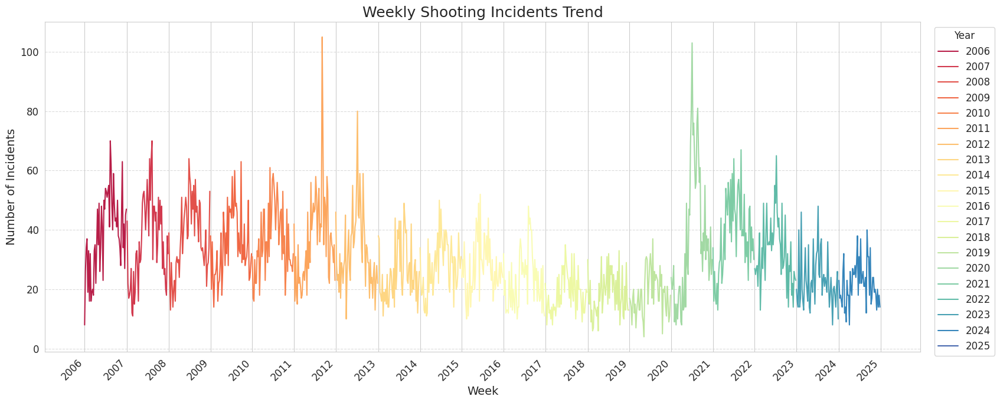

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the dataset
data = pd.read_csv("NYPD_cleaned.csv")

# 1. Prepare Data for Continuous Weekly Analysis
# Convert 'OCCUR_DATETIME' to datetime objects and filter by year range
data['OCCUR_DATETIME'] = pd.to_datetime(data['OCCUR_DATETIME'])
data_filtered = data[
    (data['OCCUR_DATETIME'].dt.year >= 2006) &
    (data['OCCUR_DATETIME'].dt.year <= 2024)
].copy()

# Set OCCUR_DATETIME as index for resampling
data_filtered.set_index('OCCUR_DATETIME', inplace=True)

# Resample the data weekly ('W') and count the number of incidents
# Using the INCIDENT_KEY as the column to count
weekly_counts_series = data_filtered['INCIDENT_KEY'].resample('W').size()

# Convert the series back to a DataFrame for plotting
weekly_trend_df = weekly_counts_series.to_frame(name='Incident_Count').reset_index()

# 2. Add Year and Continuous Week Number for Plotting
# Extract the Year as a categorical variable (for coloring/hue)
weekly_trend_df['Year'] = weekly_trend_df['OCCUR_DATETIME'].dt.year.astype(str)

# Calculate the continuous week number for x-axis indexing
# We use the difference in days from the first week and convert to weeks
start_date = weekly_trend_df['OCCUR_DATETIME'].min()
weekly_trend_df['Continuous_Week'] = (weekly_trend_df['OCCUR_DATETIME'] - start_date).dt.days // 7 + 1

# 3. Generate the Continuous Plot
plt.figure(figsize=(18, 7))

# Plot the continuous line, using Year as the hue to distinguish sections
sns.lineplot(
    data=weekly_trend_df,
    x='Continuous_Week',
    y='Incident_Count',
    hue='Year',
    palette='Spectral', # Use a divergent color palette for years
    linewidth=1.5
)

# Set up X-axis labels to show Year boundaries
# Find the Continuous_Week number corresponding to the start of each year
yearly_markers = weekly_trend_df.groupby('Year')['Continuous_Week'].min().reset_index()

# Set ticks at the beginning of each year
plt.xticks(
    ticks=yearly_markers['Continuous_Week'],
    labels=yearly_markers['Year'],
    rotation=45,
    ha='right'
)

# Add titles and labels
plt.title('Weekly Shooting Incidents Trend', fontsize=18)
plt.xlabel('Week', fontsize=14)
plt.ylabel('Number of Incidents', fontsize=14)

# Move the legend outside the plot area
plt.legend(title='Year', bbox_to_anchor=(1.01, 1), loc='upper left')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout(rect=[0, 0, 0.95, 1]) # Adjust plot area for external legend
# plt.savefig('continuous_weekly_shooting_trend.png')
plt.show()

## NYPD Shootings: Non-Special Day Analysis & Daily Average Patterns

Loading data...
Total incidents: 29,645

Day Type Distribution:
DAY_TYPE
Normal Day               18344
Summer Season             9630
Special Day (Holiday)     1671
Name: count, dtype: int64

Normal day incidents: 18,344


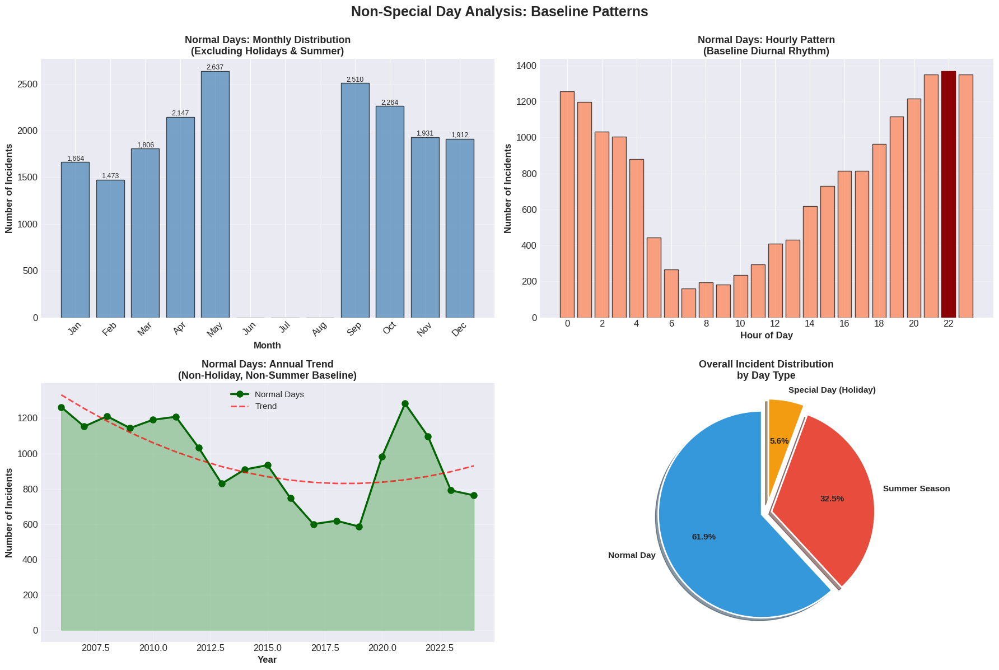

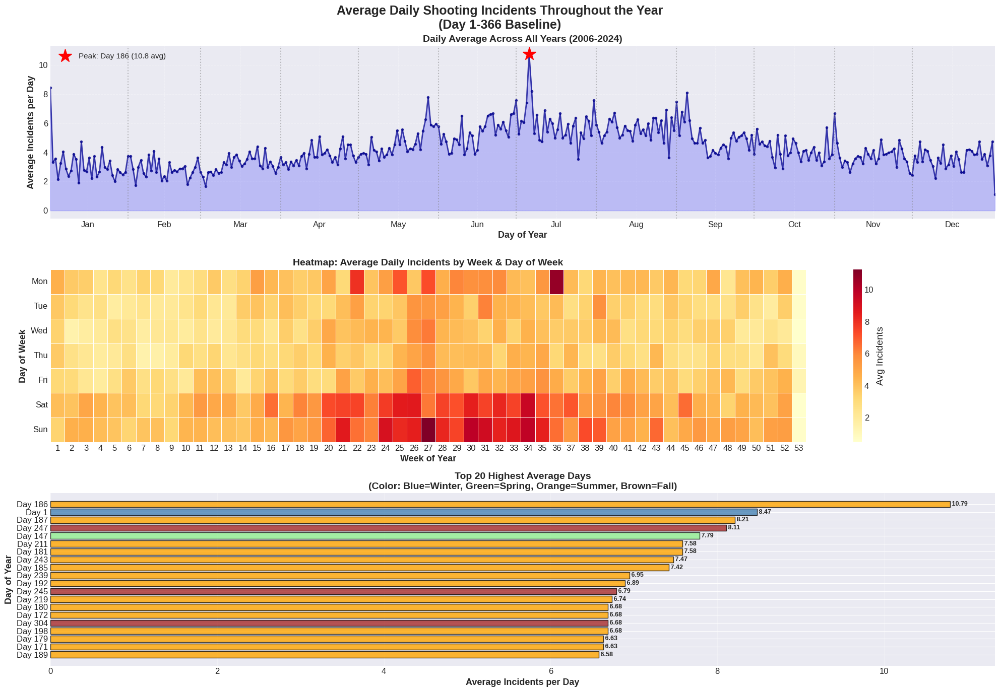


SEASONAL ANALYSIS

Seasonal Breakdown:
        Total_Incidents  Days_in_Season  Incidents_per_Day  Percentage
SEASON                                                                
Summer             9923              92           5.676773   33.472761
Fall               7358              91           4.255639   24.820374
Spring             6801              92           3.890732   22.941474
Winter             5563              90           3.253216   18.765390


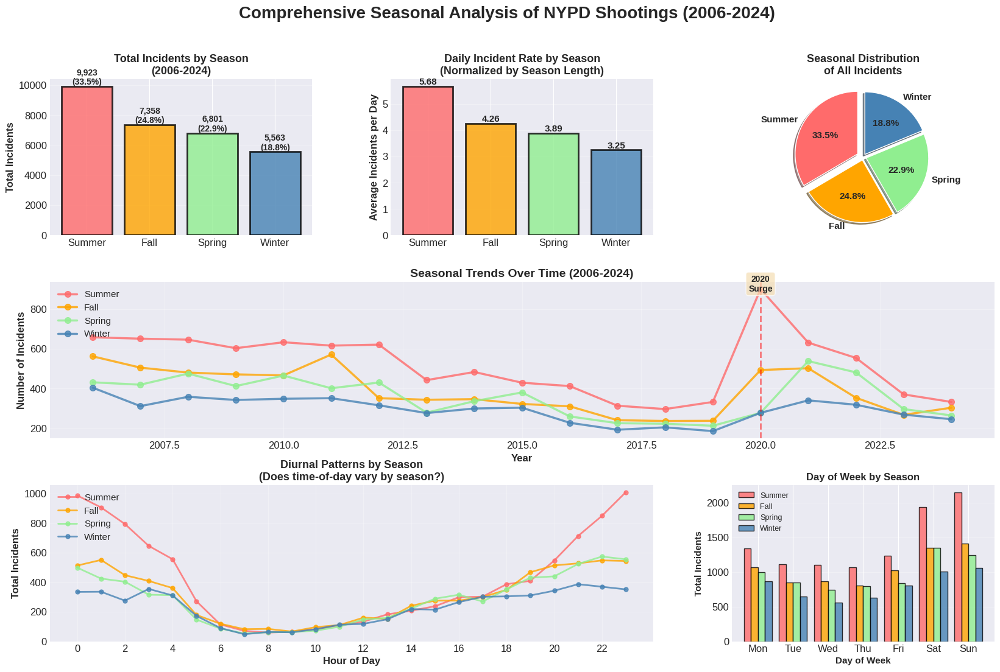


STATISTICAL SUMMARY: SEASONAL & DAY TYPE ANALYSIS

📊 NORMAL DAYS (Non-Holiday, Non-Summer):
  • Total Incidents......................... 18344
  • Percentage of All....................... 61.9%
  • Daily Average........................... 3.90
  • Peak Hour............................... 22:00 (1,369 incidents)
  • Peak Month.............................. May (2,637 incidents)

🎉 SPECIAL DAYS (Holidays):
  • Total Incidents......................... 1671
  • Percentage of All....................... 5.6%
  • Daily Average........................... 5.78

☀️ SUMMER SEASON:
  • Total Incidents......................... 9630
  • Percentage of All....................... 32.5%
  • Daily Average........................... 5.84

DAY OF YEAR ANALYSIS
Highest Risk Day: Day 186 (10.79 avg incidents)
Lowest Risk Day: Day 366 (1.11 avg incidents)
Overall Daily Average: 4.26 incidents
Standard Deviation: 1.34
Coefficient of Variation: 31.4%

✅ Analysis complete! Visualizations saved.
   • normal_day_

In [60]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date, timedelta
import calendar

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# ============================================================================
# PART 1: DATA LOADING & SPECIAL DAY CLASSIFICATION
# ============================================================================

# Date calculation helpers (from your original code)
def get_nth_weekday_of_month(year, month, weekday, n):
    """Calculate nth occurrence of weekday in month."""
    first_day = date(year, month, 1)
    days_to_first = (weekday - first_day.weekday() + 7) % 7
    target = first_day + timedelta(days=days_to_first)
    target += timedelta(weeks=n - 1)
    return target if target.month == month else None

def get_last_weekday_of_month(year, month, weekday):
    """Calculate last occurrence of weekday in month."""
    if month == 12:
        start = date(year + 1, 1, 1)
    else:
        start = date(year, month + 1, 1)
    last_day = start - timedelta(days=1)
    days_back = (last_day.weekday() - weekday + 7) % 7
    return last_day - timedelta(days=days_back)

# Pre-calculate special dates (2006-2024)
SPECIAL_DATES = {}
YEARS = range(2006, 2025)

for year in YEARS:
    # Fixed dates
    fixed_dates = {
        "New Year's Day": (1, 1), 
        "St. Patrick's Day": (3, 17), 
        "Juneteenth": (6, 19), 
        "Independence Day": (7, 4), 
        "9/11 Remembrance": (9, 11), 
        "Halloween": (10, 31), 
        "Veterans Day": (11, 11), 
        "Christmas": (12, 25), 
        "New Year's Eve": (12, 31),
        "Christmas Eve": (12, 24),
    }
    for name, (month, day) in fixed_dates.items():
        SPECIAL_DATES.setdefault(name, set()).add(date(year, month, day))

    # Variable holidays
    SPECIAL_DATES.setdefault("MLK Jr. Day", set()).add(
        get_nth_weekday_of_month(year, 1, calendar.MONDAY, 3))
    SPECIAL_DATES.setdefault("Presidents' Day", set()).add(
        get_nth_weekday_of_month(year, 2, calendar.MONDAY, 3))
    SPECIAL_DATES.setdefault("Memorial Day", set()).add(
        get_last_weekday_of_month(year, 5, calendar.MONDAY))
    SPECIAL_DATES.setdefault("Labor Day", set()).add(
        get_nth_weekday_of_month(year, 9, calendar.MONDAY, 1))
    SPECIAL_DATES.setdefault("Columbus Day", set()).add(
        get_nth_weekday_of_month(year, 10, calendar.MONDAY, 2))
    SPECIAL_DATES.setdefault("Thanksgiving", set()).add(
        get_nth_weekday_of_month(year, 11, calendar.THURSDAY, 4))

# Clean up None values
for key in SPECIAL_DATES:
    SPECIAL_DATES[key] = tuple(d for d in SPECIAL_DATES[key] if d is not None)

def classify_day_type(incident_date):
    """Classify as Special Day, Summer Season, or Normal Day."""
    # Check specific holidays
    for name, dates_list in SPECIAL_DATES.items():
        if incident_date in dates_list:
            return "Special Day (Holiday)"
    
    # Check summer season
    if 6 <= incident_date.month <= 8:
        return "Summer Season"
    
    return "Normal Day"

# ============================================================================
# PART 2: LOAD DATA & CLASSIFY
# ============================================================================

print("Loading data...")
df = pd.read_csv('NYPD_cleaned.csv')
df['OCCUR_DATETIME'] = pd.to_datetime(df['OCCUR_DATETIME'])
df['OCCUR_DATE'] = df['OCCUR_DATETIME'].dt.date
df['DAY_OF_YEAR'] = df['OCCUR_DATETIME'].dt.dayofyear
df['YEAR'] = df['OCCUR_DATETIME'].dt.year
df['MONTH'] = df['OCCUR_DATETIME'].dt.month
df['DAY'] = df['OCCUR_DATETIME'].dt.day

# Classify day type
df['DAY_TYPE'] = df['OCCUR_DATE'].apply(classify_day_type)

print(f"Total incidents: {len(df):,}")
print("\nDay Type Distribution:")
print(df['DAY_TYPE'].value_counts())

# ============================================================================
# VISUALIZATION 1: NON-SPECIAL DAY COMPREHENSIVE ANALYSIS
# ============================================================================

fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.suptitle('Non-Special Day Analysis: Baseline Patterns', 
             fontsize=18, fontweight='bold', y=0.995)

# Filter normal days
normal_days = df[df['DAY_TYPE'] == 'Normal Day'].copy()
print(f"\nNormal day incidents: {len(normal_days):,}")

# 1. Monthly distribution of normal days
ax1 = axes[0, 0]
monthly_normal = normal_days.groupby('MONTH').size()

# FIXED: Reindex to include all 12 months (fill missing with 0)
monthly_normal = monthly_normal.reindex(range(1, 13), fill_value=0)

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
bars1 = ax1.bar(range(1, 13), monthly_normal.values, 
                color='steelblue', alpha=0.7, edgecolor='black')
ax1.set_xlabel('Month', fontsize=12, fontweight='bold')
ax1.set_ylabel('Number of Incidents', fontsize=12, fontweight='bold')
ax1.set_title('Normal Days: Monthly Distribution\n(Excluding Holidays & Summer)', 
              fontsize=13, fontweight='bold')
ax1.set_xticks(range(1, 13))
ax1.set_xticklabels(months, rotation=45)
ax1.grid(axis='y', alpha=0.3)
for i, bar in enumerate(bars1):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height):,}' if height > 0 else '',
             ha='center', va='bottom', fontsize=9)

# 2. Hourly distribution on normal days
ax2 = axes[0, 1]
hourly_normal = normal_days['OCCUR_DATETIME'].dt.hour.value_counts().sort_index()
bars2 = ax2.bar(hourly_normal.index, hourly_normal.values, 
                color='coral', alpha=0.7, edgecolor='black')
ax2.set_xlabel('Hour of Day', fontsize=12, fontweight='bold')
ax2.set_ylabel('Number of Incidents', fontsize=12, fontweight='bold')
ax2.set_title('Normal Days: Hourly Pattern\n(Baseline Diurnal Rhythm)', 
              fontsize=13, fontweight='bold')
ax2.set_xticks(range(0, 24, 2))
ax2.grid(axis='y', alpha=0.3)
# Highlight peak hours
peak_hour = hourly_normal.idxmax()
bars2[peak_hour].set_color('darkred')
bars2[peak_hour].set_alpha(1.0)

# 3. Year-over-year trend of normal days
ax3 = axes[1, 0]
yearly_normal = normal_days.groupby('YEAR').size()
ax3.plot(yearly_normal.index, yearly_normal.values, 
         marker='o', linewidth=2.5, markersize=8, 
         color='darkgreen', label='Normal Days')
ax3.fill_between(yearly_normal.index, yearly_normal.values, alpha=0.3, color='green')
ax3.set_xlabel('Year', fontsize=12, fontweight='bold')
ax3.set_ylabel('Number of Incidents', fontsize=12, fontweight='bold')
ax3.set_title('Normal Days: Annual Trend\n(Non-Holiday, Non-Summer Baseline)', 
              fontsize=13, fontweight='bold')
ax3.grid(True, alpha=0.3)
ax3.legend(fontsize=11)

# Add trend line
z = np.polyfit(yearly_normal.index, yearly_normal.values, 2)
p = np.poly1d(z)
ax3.plot(yearly_normal.index, p(yearly_normal.index), 
         "--", color='red', linewidth=2, alpha=0.7, label='Trend')
ax3.legend(fontsize=11)

# 4. Comparison: Normal vs Special vs Summer
ax4 = axes[1, 1]
day_type_counts = df['DAY_TYPE'].value_counts()
colors_pie = ['#3498db', '#e74c3c', '#f39c12']
explode = (0.05, 0.05, 0.1)
wedges, texts, autotexts = ax4.pie(day_type_counts.values, 
                                     labels=day_type_counts.index,
                                     autopct='%1.1f%%',
                                     colors=colors_pie,
                                     explode=explode,
                                     shadow=True,
                                     startangle=90,
                                     textprops={'fontsize': 11, 'fontweight': 'bold'})
ax4.set_title('Overall Incident Distribution\nby Day Type', 
              fontsize=13, fontweight='bold')

# Add count labels
for i, (label, count) in enumerate(zip(day_type_counts.index, day_type_counts.values)):
    wedges[i].set_edgecolor('white')
    wedges[i].set_linewidth(2)

plt.tight_layout()
# plt.savefig('images/normal_day_comprehensive_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# ============================================================================
# VISUALIZATION 2: AVERAGE SHOOTINGS PER DAY OF YEAR (1-366)
# ============================================================================

# Calculate average for each day of year
daily_avg = df.groupby('DAY_OF_YEAR').size() / df['YEAR'].nunique()

# Create figure
fig, axes = plt.subplots(3, 1, figsize=(20, 14))
fig.suptitle('Average Daily Shooting Incidents Throughout the Year\n(Day 1-366 Baseline)', 
             fontsize=18, fontweight='bold')

# 1. Full year line plot with markers
ax1 = axes[0]
ax1.plot(daily_avg.index, daily_avg.values, 
         linewidth=2, color='darkblue', marker='o', 
         markersize=3, alpha=0.7)
ax1.fill_between(daily_avg.index, daily_avg.values, alpha=0.2, color='blue')
ax1.set_xlabel('Day of Year', fontsize=13, fontweight='bold')
ax1.set_ylabel('Average Incidents per Day', fontsize=13, fontweight='bold')
ax1.set_title('Daily Average Across All Years (2006-2024)', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3, linestyle='--')
ax1.set_xlim(1, 366)

# Add month boundaries
month_days = [0, 31, 59, 90, 120, 151, 181, 212, 243, 273, 304, 334, 365]
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
for day in month_days[1:-1]:
    ax1.axvline(x=day, color='gray', linestyle=':', alpha=0.5)
ax1.set_xticks([(month_days[i] + month_days[i+1])/2 for i in range(12)])
ax1.set_xticklabels(month_names)

# Highlight peak day
peak_day = daily_avg.idxmax()
peak_value = daily_avg.max()
ax1.plot(peak_day, peak_value, 'r*', markersize=20, 
         label=f'Peak: Day {peak_day} ({peak_value:.1f} avg)')
ax1.legend(fontsize=11, loc='upper left')

# 2. Heatmap view: Week x Day of Week
ax2 = axes[1]

# Create week-day matrix
df_temp = df.copy()
df_temp['WEEK_OF_YEAR'] = df_temp['OCCUR_DATETIME'].dt.isocalendar().week
df_temp['DAY_OF_WEEK'] = df_temp['OCCUR_DATETIME'].dt.dayofweek

# Calculate average per week-day combination
heatmap_data = df_temp.groupby(['WEEK_OF_YEAR', 'DAY_OF_WEEK']).size().unstack(fill_value=0)
heatmap_data = heatmap_data / df_temp['YEAR'].nunique()  # Average across years

sns.heatmap(heatmap_data.T, cmap='YlOrRd', annot=False, 
            cbar_kws={'label': 'Avg Incidents'}, ax=ax2,
            linewidths=0.5, linecolor='white')
ax2.set_xlabel('Week of Year', fontsize=13, fontweight='bold')
ax2.set_ylabel('Day of Week', fontsize=13, fontweight='bold')
ax2.set_title('Heatmap: Average Daily Incidents by Week & Day of Week', 
              fontsize=14, fontweight='bold')
ax2.set_yticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], rotation=0)

# 3. Top 20 highest average days
ax3 = axes[2]
top_20_days = daily_avg.nlargest(20).sort_values(ascending=True)

# Color code by season
colors = []
for day in top_20_days.index:
    if day <= 59 or day >= 335:  # Winter
        colors.append('steelblue')
    elif 60 <= day <= 151:  # Spring
        colors.append('lightgreen')
    elif 152 <= day <= 243:  # Summer
        colors.append('orange')
    else:  # Fall
        colors.append('brown')

bars3 = ax3.barh(range(20), top_20_days.values, color=colors, 
                 edgecolor='black', alpha=0.8)
ax3.set_yticks(range(20))
ax3.set_yticklabels([f'Day {day}' for day in top_20_days.index])
ax3.set_xlabel('Average Incidents per Day', fontsize=13, fontweight='bold')
ax3.set_ylabel('Day of Year', fontsize=13, fontweight='bold')
ax3.set_title('Top 20 Highest Average Days\n(Color: Blue=Winter, Green=Spring, Orange=Summer, Brown=Fall)', 
              fontsize=14, fontweight='bold')
ax3.grid(axis='x', alpha=0.3)

# Add value labels
for i, (day, val) in enumerate(zip(top_20_days.index, top_20_days.values)):
    ax3.text(val, i, f' {val:.2f}', va='center', fontsize=9, fontweight='bold')

plt.tight_layout()
# plt.savefig('images/daily_average_calendar_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# ============================================================================
# VISUALIZATION 3: SEASONAL ANALYSIS (4 SEASONS)
# ============================================================================

def get_season(month):
    """Classify month into meteorological season."""
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:  # 9, 10, 11
        return 'Fall'

# Add season column
df['SEASON'] = df['MONTH'].apply(get_season)

print("\n" + "="*70)
print("SEASONAL ANALYSIS")
print("="*70)

# Calculate seasonal statistics
seasonal_stats = df.groupby('SEASON').agg({
    'OCCUR_DATE': 'count'
}).rename(columns={'OCCUR_DATE': 'Total_Incidents'})

# Calculate incidents per day for each season (accounting for season length)
season_days = {'Winter': 90, 'Spring': 92, 'Summer': 92, 'Fall': 91}
seasonal_stats['Days_in_Season'] = seasonal_stats.index.map(season_days)
seasonal_stats['Incidents_per_Day'] = (
    seasonal_stats['Total_Incidents'] / 
    (seasonal_stats['Days_in_Season'] * df['YEAR'].nunique())
)
seasonal_stats['Percentage'] = (
    seasonal_stats['Total_Incidents'] / len(df) * 100
)

# Sort by total incidents
seasonal_stats = seasonal_stats.sort_values('Total_Incidents', ascending=False)

print("\nSeasonal Breakdown:")
print(seasonal_stats.to_string())

# Create comprehensive seasonal visualization
fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

fig.suptitle('Comprehensive Seasonal Analysis of NYPD Shootings (2006-2024)', 
             fontsize=20, fontweight='bold', y=0.98)

# 1. Total incidents by season (bar chart)
ax1 = fig.add_subplot(gs[0, 0])
seasons_order = ['Summer', 'Fall', 'Spring', 'Winter']
colors_season = ['#FF6B6B', '#FFA500', '#90EE90', '#4682B4']
season_totals = [seasonal_stats.loc[s, 'Total_Incidents'] for s in seasons_order]

bars = ax1.bar(seasons_order, season_totals, color=colors_season, 
               edgecolor='black', linewidth=2, alpha=0.8)
ax1.set_ylabel('Total Incidents', fontsize=12, fontweight='bold')
ax1.set_title('Total Incidents by Season\n(2006-2024)', fontsize=13, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)

for i, (bar, val) in enumerate(zip(bars, season_totals)):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(val):,}\n({seasonal_stats.loc[seasons_order[i], "Percentage"]:.1f}%)',
             ha='center', va='bottom', fontsize=10, fontweight='bold')

# 2. Daily average by season
ax2 = fig.add_subplot(gs[0, 1])
daily_avg_season = [seasonal_stats.loc[s, 'Incidents_per_Day'] for s in seasons_order]

bars2 = ax2.bar(seasons_order, daily_avg_season, color=colors_season, 
                edgecolor='black', linewidth=2, alpha=0.8)
ax2.set_ylabel('Average Incidents per Day', fontsize=12, fontweight='bold')
ax2.set_title('Daily Incident Rate by Season\n(Normalized by Season Length)', 
              fontsize=13, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

for i, (bar, val) in enumerate(zip(bars2, daily_avg_season)):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
             f'{val:.2f}',
             ha='center', va='bottom', fontsize=11, fontweight='bold')

# 3. Seasonal pie chart
ax3 = fig.add_subplot(gs[0, 2])
wedges, texts, autotexts = ax3.pie(season_totals, 
                                     labels=seasons_order,
                                     autopct='%1.1f%%',
                                     colors=colors_season,
                                     explode=(0.1, 0.05, 0.05, 0.05),
                                     shadow=True,
                                     startangle=90,
                                     textprops={'fontsize': 11, 'fontweight': 'bold'})
ax3.set_title('Seasonal Distribution\nof All Incidents', fontsize=13, fontweight='bold')

# 4. Year-over-year seasonal trends
ax4 = fig.add_subplot(gs[1, :])
seasonal_yearly = df.groupby(['YEAR', 'SEASON']).size().unstack(fill_value=0)

for i, season in enumerate(seasons_order):
    ax4.plot(seasonal_yearly.index, seasonal_yearly[season], 
             marker='o', linewidth=2.5, markersize=7, 
             label=season, color=colors_season[i], alpha=0.8)

ax4.set_xlabel('Year', fontsize=12, fontweight='bold')
ax4.set_ylabel('Number of Incidents', fontsize=12, fontweight='bold')
ax4.set_title('Seasonal Trends Over Time (2006-2024)', fontsize=14, fontweight='bold')
ax4.legend(loc='upper left', fontsize=11, framealpha=0.9)
ax4.grid(True, alpha=0.3)

# Add annotation for 2020 surge
ax4.axvline(x=2020, color='red', linestyle='--', linewidth=2, alpha=0.5)
ax4.text(2020, ax4.get_ylim()[1]*0.95, '2020\nSurge', 
         ha='center', fontsize=10, fontweight='bold', 
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))

# 5. Hourly patterns by season
ax5 = fig.add_subplot(gs[2, :2])
for i, season in enumerate(seasons_order):
    season_data = df[df['SEASON'] == season]
    hourly = season_data['OCCUR_DATETIME'].dt.hour.value_counts().sort_index()
    ax5.plot(hourly.index, hourly.values, 
             marker='o', linewidth=2, markersize=5,
             label=season, color=colors_season[i], alpha=0.8)

ax5.set_xlabel('Hour of Day', fontsize=12, fontweight='bold')
ax5.set_ylabel('Total Incidents', fontsize=12, fontweight='bold')
ax5.set_title('Diurnal Patterns by Season\n(Does time-of-day vary by season?)', 
              fontsize=13, fontweight='bold')
ax5.legend(loc='upper left', fontsize=11)
ax5.set_xticks(range(0, 24, 2))
ax5.grid(True, alpha=0.3)

# 6. Day of week patterns by season
ax6 = fig.add_subplot(gs[2, 2])
dow_season = df.groupby(['SEASON', df['OCCUR_DATETIME'].dt.dayofweek]).size().unstack(fill_value=0)
dow_season = dow_season.reindex(seasons_order)

dow_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
x = np.arange(len(dow_labels))
width = 0.2

for i, season in enumerate(seasons_order):
    offset = (i - 1.5) * width
    ax6.bar(x + offset, dow_season.loc[season], width, 
            label=season, color=colors_season[i], alpha=0.8, edgecolor='black')

ax6.set_xlabel('Day of Week', fontsize=11, fontweight='bold')
ax6.set_ylabel('Total Incidents', fontsize=11, fontweight='bold')
ax6.set_title('Day of Week by Season', fontsize=12, fontweight='bold')
ax6.set_xticks(x)
ax6.set_xticklabels(dow_labels)
ax6.legend(fontsize=9)
ax6.grid(axis='y', alpha=0.3)

# plt.savefig('images/comprehensive_seasonal_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# ============================================================================
# STATISTICAL SUMMARY
# ============================================================================

print("\n" + "="*70)
print("STATISTICAL SUMMARY: SEASONAL & DAY TYPE ANALYSIS")
print("="*70)

# Calculate key metrics
normal_stats = {
    'Total Incidents': len(normal_days),
    'Percentage of All': f"{len(normal_days)/len(df)*100:.1f}%",
    'Daily Average': f"{len(normal_days) / (df['OCCUR_DATE'].nunique() * 0.732):.2f}",
    'Peak Hour': f"{hourly_normal.idxmax()}:00 ({hourly_normal.max():,} incidents)",
    'Peak Month': f"{months[monthly_normal.idxmax()-1]} ({monthly_normal.max():,} incidents)"
}

special_days = df[df['DAY_TYPE'] == 'Special Day (Holiday)']
special_stats = {
    'Total Incidents': len(special_days),
    'Percentage of All': f"{len(special_days)/len(df)*100:.1f}%",
    'Daily Average': f"{len(special_days) / special_days['OCCUR_DATE'].nunique():.2f}",
}

summer_days = df[df['DAY_TYPE'] == 'Summer Season']
summer_stats = {
    'Total Incidents': len(summer_days),
    'Percentage of All': f"{len(summer_days)/len(df)*100:.1f}%",
    'Daily Average': f"{len(summer_days) / summer_days['OCCUR_DATE'].nunique():.2f}",
}

print("\n📊 NORMAL DAYS (Non-Holiday, Non-Summer):")
for key, value in normal_stats.items():
    print(f"  • {key:.<40} {value}")

print("\n🎉 SPECIAL DAYS (Holidays):")
for key, value in special_stats.items():
    print(f"  • {key:.<40} {value}")

print("\n☀️ SUMMER SEASON:")
for key, value in summer_stats.items():
    print(f"  • {key:.<40} {value}")

print("\n" + "="*70)
print("DAY OF YEAR ANALYSIS")
print("="*70)
print(f"Highest Risk Day: Day {daily_avg.idxmax()} ({daily_avg.max():.2f} avg incidents)")
print(f"Lowest Risk Day: Day {daily_avg.idxmin()} ({daily_avg.min():.2f} avg incidents)")
print(f"Overall Daily Average: {daily_avg.mean():.2f} incidents")
print(f"Standard Deviation: {daily_avg.std():.2f}")
print(f"Coefficient of Variation: {(daily_avg.std()/daily_avg.mean())*100:.1f}%")

print("\n✅ Analysis complete! Visualizations saved.")
print("   • normal_day_comprehensive_analysis.png")
print("   • daily_average_calendar_analysis.png")

Loading data...
Total incidents (before filtering): 29,645

Original Victim Gender Distribution:
VIC_SEX
M    26751
F     2882
U       12
Name: count, dtype: int64

Original Perpetrator Gender Distribution:
PERP_SEX
M          16791
UNKNOWN     9310
(null)      1584
U           1500
F            460
Name: count, dtype: int64

FILTERED DATA SUMMARY
Incidents with known victim gender (M/F): 29,633
Incidents with known perpetrator gender (M/F): 17,251
Incidents with both known (M/F): 17,243

Filtered Victim Gender Distribution:
VIC_SEX
M    26751
F     2882
Name: count, dtype: int64

Filtered Perpetrator Gender Distribution:
PERP_SEX
M    16791
F      460
Name: count, dtype: int64


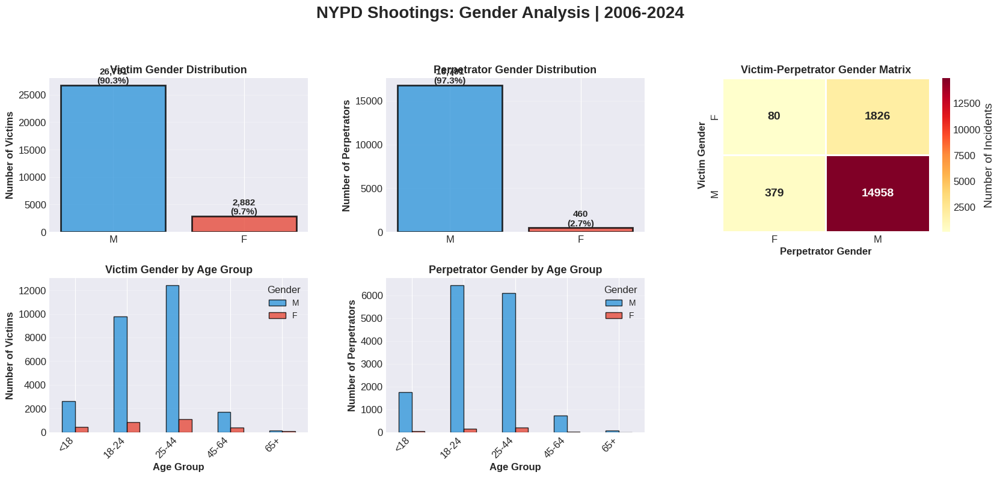


📊 VICTIM STATISTICS:
  Male victims: 26,751 (90.3%)
  Female victims: 2,882 (9.7%)
  Male/Female ratio: 9.28:1

🔫 PERPETRATOR STATISTICS:
  Male perpetrators: 16,791 (97.3%)
  Female perpetrators: 460 (2.7%)
  Male/Female ratio: 36.50:1

⏰ TEMPORAL PATTERNS:
  Male victims peak hour: 23:00
  Female victims peak hour: 22:00
  Male victims peak day: Sunday
  Female victims peak day: Saturday

📍 GEOGRAPHIC PATTERNS:
  Male victims highest borough: BROOKLYN
  Female victims highest borough: BROOKLYN

💀 MORTALITY RATES:
  Male victim fatality rate: 19.33%
  Female victim fatality rate: 20.26%

👥 CROSS-GENDER DYNAMICS (Both Known):
  Male victim + Male perpetrator: 14,958 (86.7%)
  Male victim + Female perpetrator: 379 (2.2%)
  Female victim + Male perpetrator: 1,826 (10.6%)
  Female victim + Female perpetrator: 80 (0.5%)

📈 AGE PATTERNS:
  Most common age group for male victims: 25-44
  Most common age group for female victims: 25-44

✅ Gender analysis complete! Visualizations saved.
   • 

In [61]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("Set2")

# ============================================================================
# DATA LOADING & PREPROCESSING
# ============================================================================

print("Loading data...")
df = pd.read_csv('NYPD_cleaned.csv')
df['OCCUR_DATETIME'] = pd.to_datetime(df['OCCUR_DATETIME'])
df['HOUR'] = df['OCCUR_DATETIME'].dt.hour
df['DAY_OF_WEEK'] = df['OCCUR_DATETIME'].dt.dayofweek
df['MONTH'] = df['OCCUR_DATETIME'].dt.month
df['YEAR'] = df['OCCUR_DATETIME'].dt.year
df['DAY_NAME'] = df['OCCUR_DATETIME'].dt.day_name()

# Define season
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

df['SEASON'] = df['MONTH'].apply(get_season)

print(f"Total incidents (before filtering): {len(df):,}")
print("\nOriginal Victim Gender Distribution:")
print(df['VIC_SEX'].value_counts())
print("\nOriginal Perpetrator Gender Distribution:")
print(df['PERP_SEX'].value_counts())

# ============================================================================
# FILTER OUT UNKNOWNS AND NULLS
# ============================================================================

# Filter victims: keep only M and F
df_vic_clean = df[df['VIC_SEX'].isin(['M', 'F'])].copy()

# Filter perpetrators: keep only M and F (exclude UNKNOWN, Unknown, (null), and any NaN)
df_perp_clean = df[df['PERP_SEX'].isin(['M', 'F'])].copy()

# For victim analysis, use df_vic_clean
# For perpetrator analysis, use df_perp_clean
# For cross-analysis (both victim AND perpetrator), use intersection
df_both_clean = df[(df['VIC_SEX'].isin(['M', 'F'])) & (df['PERP_SEX'].isin(['M', 'F']))].copy()

print("\n" + "="*70)
print("FILTERED DATA SUMMARY")
print("="*70)
print(f"Incidents with known victim gender (M/F): {len(df_vic_clean):,}")
print(f"Incidents with known perpetrator gender (M/F): {len(df_perp_clean):,}")
print(f"Incidents with both known (M/F): {len(df_both_clean):,}")

print("\nFiltered Victim Gender Distribution:")
print(df_vic_clean['VIC_SEX'].value_counts())
print("\nFiltered Perpetrator Gender Distribution:")
print(df_perp_clean['PERP_SEX'].value_counts())

# ============================================================================
# VISUALIZATION 1: OVERALL GENDER DISTRIBUTION & DEMOGRAPHICS
# ============================================================================

fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)
fig.suptitle('NYPD Shootings: Gender Analysis | 2006-2024', 
             fontsize=20, fontweight='bold', y=0.98)

colors_gender = ['#3498db', '#e74c3c']  # Blue for M, Red for F

# 1. Victim Gender Distribution (Clean Data)
ax1 = fig.add_subplot(gs[0, 0])
vic_gender = df_vic_clean['VIC_SEX'].value_counts()
bars1 = ax1.bar(vic_gender.index, vic_gender.values, 
                color=colors_gender[:len(vic_gender)], 
                edgecolor='black', linewidth=2, alpha=0.8)
ax1.set_ylabel('Number of Victims', fontsize=12, fontweight='bold')
ax1.set_title('Victim Gender Distribution', fontsize=13, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)
for bar in bars1:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height):,}\n({height/len(df_vic_clean)*100:.1f}%)',
             ha='center', va='bottom', fontsize=11, fontweight='bold')

# 2. Perpetrator Gender Distribution (Clean Data)
ax2 = fig.add_subplot(gs[0, 1])
perp_gender = df_perp_clean['PERP_SEX'].value_counts()
bars2 = ax2.bar(perp_gender.index, perp_gender.values, 
                color=colors_gender[:len(perp_gender)], 
                edgecolor='black', linewidth=2, alpha=0.8)
ax2.set_ylabel('Number of Perpetrators', fontsize=12, fontweight='bold')
ax2.set_title('Perpetrator Gender Distribution', fontsize=13, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)
for bar in bars2:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height):,}\n({height/len(df_perp_clean)*100:.1f}%)',
             ha='center', va='bottom', fontsize=11, fontweight='bold')

# 3. Victim-Perpetrator Gender Combinations (Both Known)
ax3 = fig.add_subplot(gs[0, 2])
gender_combo = df_both_clean.groupby(['VIC_SEX', 'PERP_SEX']).size().unstack(fill_value=0)
sns.heatmap(gender_combo, annot=True, fmt='d', cmap='YlOrRd', 
            cbar_kws={'label': 'Number of Incidents'}, ax=ax3,
            linewidths=2, linecolor='white', annot_kws={'fontsize': 14, 'fontweight': 'bold'})
ax3.set_xlabel('Perpetrator Gender', fontsize=12, fontweight='bold')
ax3.set_ylabel('Victim Gender', fontsize=12, fontweight='bold')
ax3.set_title('Victim-Perpetrator Gender Matrix', fontsize=13, fontweight='bold')

# 4. Gender by Age Group (Victims)
ax4 = fig.add_subplot(gs[1, 0])
vic_age_gender = df_vic_clean.groupby(['VIC_AGE_GROUP', 'VIC_SEX']).size().unstack(fill_value=0)
vic_age_gender = vic_age_gender.reindex(['<18', '18-24', '25-44', '45-64', '65+'], fill_value=0)
vic_age_gender[['M', 'F']].plot(kind='bar', ax=ax4, color=colors_gender, 
                    edgecolor='black', linewidth=1, alpha=0.8)
ax4.set_xlabel('Age Group', fontsize=12, fontweight='bold')
ax4.set_ylabel('Number of Victims', fontsize=12, fontweight='bold')
ax4.set_title('Victim Gender by Age Group', fontsize=13, fontweight='bold')
ax4.legend(title='Gender', fontsize=10)
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=45, ha='right')
ax4.grid(axis='y', alpha=0.3)

# 5. Gender by Age Group (Perpetrators)
ax5 = fig.add_subplot(gs[1, 1])
perp_age_gender = df_perp_clean.groupby(['PERP_AGE_GROUP', 'PERP_SEX']).size().unstack(fill_value=0)
perp_age_gender = perp_age_gender.reindex(['<18', '18-24', '25-44', '45-64', '65+'], fill_value=0)
perp_age_gender[['M', 'F']].plot(kind='bar', ax=ax5, color=colors_gender, 
                     edgecolor='black', linewidth=1, alpha=0.8)
ax5.set_xlabel('Age Group', fontsize=12, fontweight='bold')
ax5.set_ylabel('Number of Perpetrators', fontsize=12, fontweight='bold')
ax5.set_title('Perpetrator Gender by Age Group', fontsize=13, fontweight='bold')
ax5.legend(title='Gender', fontsize=10)
ax5.set_xticklabels(ax5.get_xticklabels(), rotation=45, ha='right')
ax5.grid(axis='y', alpha=0.3)

# plt.savefig('images/gender_comprehensive_overview.png', dpi=300, bbox_inches='tight')
plt.show()



# Overall statistics
male_victims = df_vic_clean[df_vic_clean['VIC_SEX'] == 'M']
female_victims = df_vic_clean[df_vic_clean['VIC_SEX'] == 'F']
male_perps = df_perp_clean[df_perp_clean['PERP_SEX'] == 'M']
female_perps = df_perp_clean[df_perp_clean['PERP_SEX'] == 'F']

print("\n📊 VICTIM STATISTICS:")
print(f"  Male victims: {len(male_victims):,} ({len(male_victims)/len(df_vic_clean)*100:.1f}%)")
print(f"  Female victims: {len(female_victims):,} ({len(female_victims)/len(df_vic_clean)*100:.1f}%)")
print(f"  Male/Female ratio: {len(male_victims)/len(female_victims):.2f}:1")

print("\n🔫 PERPETRATOR STATISTICS:")
print(f"  Male perpetrators: {len(male_perps):,} ({len(male_perps)/len(df_perp_clean)*100:.1f}%)")
print(f"  Female perpetrators: {len(female_perps):,} ({len(female_perps)/len(df_perp_clean)*100:.1f}%)")
print(f"  Male/Female ratio: {len(male_perps)/len(female_perps):.2f}:1")

print("\n⏰ TEMPORAL PATTERNS:")
male_peak_hour = male_victims['HOUR'].value_counts().idxmax()
female_peak_hour = female_victims['HOUR'].value_counts().idxmax()
print(f"  Male victims peak hour: {male_peak_hour}:00")
print(f"  Female victims peak hour: {female_peak_hour}:00")

male_peak_day = male_victims['DAY_NAME'].value_counts().idxmax()
female_peak_day = female_victims['DAY_NAME'].value_counts().idxmax()
print(f"  Male victims peak day: {male_peak_day}")
print(f"  Female victims peak day: {female_peak_day}")

print("\n📍 GEOGRAPHIC PATTERNS:")
male_boro = male_victims['BORO'].value_counts().idxmax()
female_boro = female_victims['BORO'].value_counts().idxmax()
print(f"  Male victims highest borough: {male_boro}")
print(f"  Female victims highest borough: {female_boro}")

print("\n💀 MORTALITY RATES:")
male_murder_rate = male_victims['STATISTICAL_MURDER_FLAG'].sum() / len(male_victims) * 100
female_murder_rate = female_victims['STATISTICAL_MURDER_FLAG'].sum() / len(female_victims) * 100
print(f"  Male victim fatality rate: {male_murder_rate:.2f}%")
print(f"  Female victim fatality rate: {female_murder_rate:.2f}%")

print("\n👥 CROSS-GENDER DYNAMICS (Both Known):")
mm_cases = len(df_both_clean[(df_both_clean['VIC_SEX'] == 'M') & (df_both_clean['PERP_SEX'] == 'M')])
mf_cases = len(df_both_clean[(df_both_clean['VIC_SEX'] == 'M') & (df_both_clean['PERP_SEX'] == 'F')])
fm_cases = len(df_both_clean[(df_both_clean['VIC_SEX'] == 'F') & (df_both_clean['PERP_SEX'] == 'M')])
ff_cases = len(df_both_clean[(df_both_clean['VIC_SEX'] == 'F') & (df_both_clean['PERP_SEX'] == 'F')])

print(f"  Male victim + Male perpetrator: {mm_cases:,} ({mm_cases/len(df_both_clean)*100:.1f}%)")
print(f"  Male victim + Female perpetrator: {mf_cases:,} ({mf_cases/len(df_both_clean)*100:.1f}%)")
print(f"  Female victim + Male perpetrator: {fm_cases:,} ({fm_cases/len(df_both_clean)*100:.1f}%)")
print(f"  Female victim + Female perpetrator: {ff_cases:,} ({ff_cases/len(df_both_clean)*100:.1f}%)")

print("\n📈 AGE PATTERNS:")
male_vic_age = male_victims['VIC_AGE_GROUP'].value_counts().idxmax()
female_vic_age = female_victims['VIC_AGE_GROUP'].value_counts().idxmax()
print(f"  Most common age group for male victims: {male_vic_age}")
print(f"  Most common age group for female victims: {female_vic_age}")

print("\n✅ Gender analysis complete! Visualizations saved.")
print("   • gender_comprehensive_overview.png")
print("   • gender_temporal_patterns.png")
print("   • gender_geographic_patterns.png")

Loading NYPD shooting data...
✅ Total incidents: 29,645
📅 Date range: 2006-01-01 02:00:00 → 2024-12-31 19:16:00


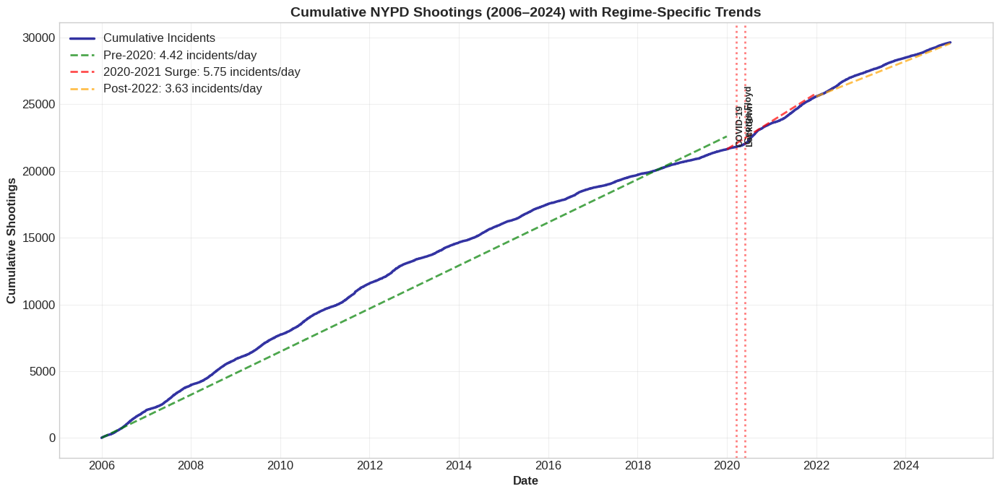

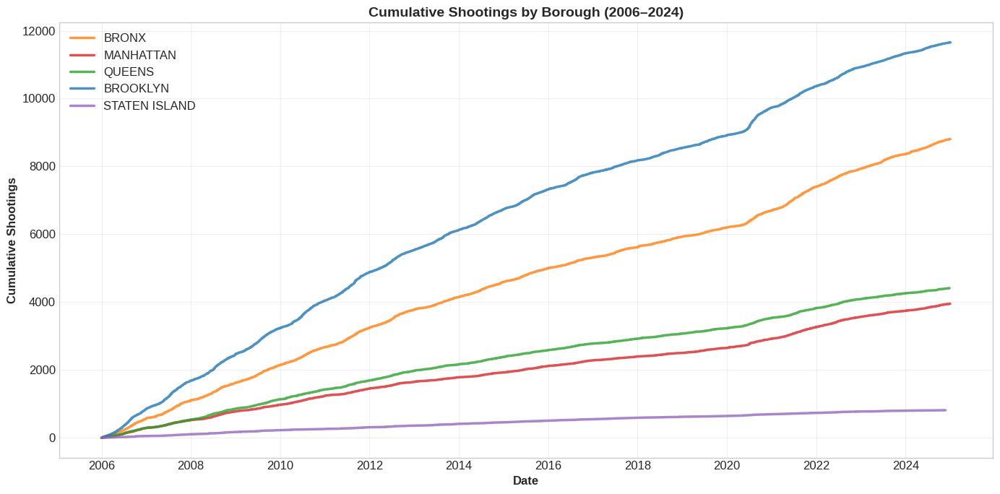

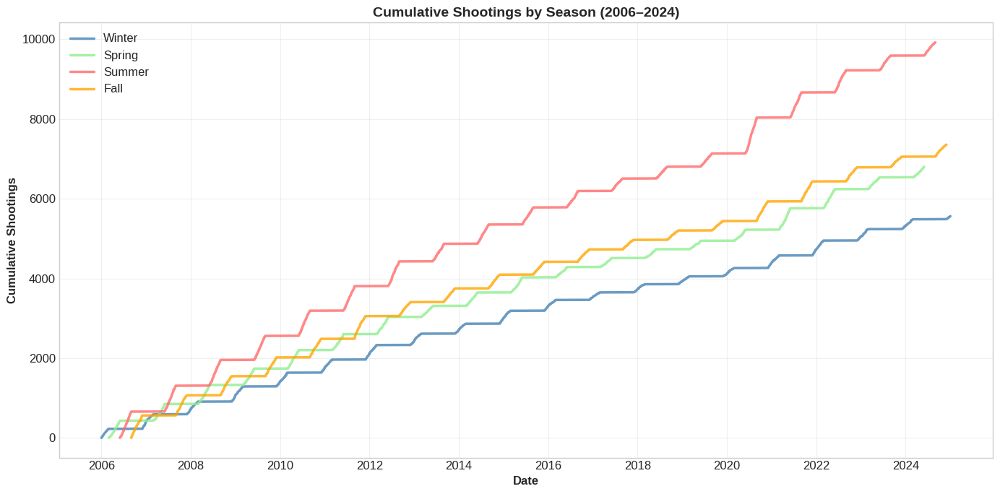

✅ All individual plots generated successfully!


In [62]:
# =============================================================================
# NYPD SHOOTING INCIDENTS: INDIVIDUAL CUMULATIVE PLOTS
# =============================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Styling
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

# =============================================================================
# 1. LOAD & PREPARE DATA
# =============================================================================
print("Loading NYPD shooting data...")
df = pd.read_csv('NYPD_cleaned.csv')
df['OCCUR_DATETIME'] = pd.to_datetime(df['OCCUR_DATETIME'])
df = df.sort_values('OCCUR_DATETIME').reset_index(drop=True)
df['CUMULATIVE_COUNT'] = np.arange(1, len(df) + 1)

# Time features
df['DAYS_SINCE_START'] = (df['OCCUR_DATETIME'] - df['OCCUR_DATETIME'].min()).dt.days
df['YEAR'] = df['OCCUR_DATETIME'].dt.year
df['MONTH'] = df['OCCUR_DATETIME'].dt.month

# Season mapping
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'
df['SEASON'] = df['MONTH'].apply(get_season)

print(f"✅ Total incidents: {len(df):,}")
print(f"📅 Date range: {df['OCCUR_DATETIME'].min()} → {df['OCCUR_DATETIME'].max()}")

# =============================================================================
# 2. DEFINE STYLING CONSTANTS
# =============================================================================
regime_dates = {
    'Pre-2020': ('2006-01-01', '2019-12-31'),
    '2020-2021 Surge': ('2020-01-01', '2021-12-31'),
    'Post-2022': ('2022-01-01', '2024-12-31')
}
regime_colors = {'Pre-2020': 'green', '2020-2021 Surge': 'red', 'Post-2022': 'orange'}

borough_colors = {
    'BROOKLYN': '#1f77b4', 'BRONX': '#ff7f0e',
    'QUEENS': '#2ca02c', 'MANHATTAN': '#d62728',
    'STATEN ISLAND': '#9467bd'
}

season_colors = {'Winter': '#4682B4', 'Spring': '#90EE90',
                 'Summer': '#FF6B6B', 'Fall': '#FFA500'}

# =============================================================================
# 3. PLOT 1: FULL TIMELINE WITH REGIME TRENDS
# =============================================================================
plt.figure(figsize=(14, 7))
plt.plot(df['OCCUR_DATETIME'], df['CUMULATIVE_COUNT'],
         linewidth=2.5, color='darkblue', alpha=0.8, label='Cumulative Incidents')

# Add regime trend lines
for label, (start, end) in regime_dates.items():
    start_date = pd.to_datetime(start)
    end_date = pd.to_datetime(end)
    mask = (df['OCCUR_DATETIME'] >= start_date) & (df['OCCUR_DATETIME'] <= end_date)
    regime_df = df[mask].copy()
    
    if len(regime_df) > 1:
        x = (regime_df['OCCUR_DATETIME'] - regime_df['OCCUR_DATETIME'].min()).dt.days
        y = regime_df['CUMULATIVE_COUNT'] - regime_df['CUMULATIVE_COUNT'].iloc[0]
        slope, _, _, _, _ = stats.linregress(x, y)
        trend_y = slope * x + regime_df['CUMULATIVE_COUNT'].iloc[0]
        plt.plot(regime_df['OCCUR_DATETIME'], trend_y, '--', linewidth=2,
                 color=regime_colors[label], alpha=0.7,
                 label=f'{label}: {slope:.2f} incidents/day')

# Milestones
milestones = [
    (pd.to_datetime('2020-03-15'), 'COVID-19\nLockdown'),
    (pd.to_datetime('2020-05-25'), 'George Floyd'),
]
for date, label in milestones:
    if (df['OCCUR_DATETIME'] >= date).any():
        cum_val = df.loc[df['OCCUR_DATETIME'] >= date, 'CUMULATIVE_COUNT'].iloc[0]
        plt.axvline(x=date, color='red', linestyle=':', alpha=0.5, linewidth=2)
        plt.text(date, cum_val, label, rotation=90, verticalalignment='bottom',
                 fontsize=9, fontweight='bold')

plt.xlabel('Date', fontsize=12, fontweight='bold')
plt.ylabel('Cumulative Shootings', fontsize=12, fontweight='bold')
plt.title('Cumulative NYPD Shootings (2006–2024) with Regime-Specific Trends', 
          fontsize=14, fontweight='bold')
plt.legend(loc='upper left', framealpha=0.95)
plt.grid(True, alpha=0.3)
plt.tight_layout()
# plt.savefig('plot1_full_timeline.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# 4. PLOT 2: CUMULATIVE BY BOROUGH
# =============================================================================
plt.figure(figsize=(14, 7))

for boro in df['BORO'].dropna().unique():
    boro_df = df[df['BORO'] == boro].copy()
    boro_df = boro_df.sort_values('OCCUR_DATETIME')
    boro_df['CUM'] = np.arange(1, len(boro_df) + 1)
    plt.plot(boro_df['OCCUR_DATETIME'], boro_df['CUM'],
             linewidth=2.5, label=boro, alpha=0.8,
             color=borough_colors.get(boro, 'gray'))

plt.xlabel('Date', fontsize=12, fontweight='bold')
plt.ylabel('Cumulative Shootings', fontsize=12, fontweight='bold')
plt.title('Cumulative Shootings by Borough (2006–2024)', fontsize=14, fontweight='bold')
plt.legend(loc='upper left', framealpha=0.95)
plt.grid(True, alpha=0.3)
plt.tight_layout()
# plt.savefig('plot2_by_borough.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# 5. PLOT 3: CUMULATIVE BY SEASON
# =============================================================================
plt.figure(figsize=(14, 7))

for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    season_df = df[df['SEASON'] == season].copy()
    season_df = season_df.sort_values('OCCUR_DATETIME')
    season_df['CUM'] = np.arange(1, len(season_df) + 1)
    plt.plot(season_df['OCCUR_DATETIME'], season_df['CUM'],
             linewidth=2.5, label=season, alpha=0.8,
             color=season_colors[season])

plt.xlabel('Date', fontsize=12, fontweight='bold')
plt.ylabel('Cumulative Shootings', fontsize=12, fontweight='bold')
plt.title('Cumulative Shootings by Season (2006–2024)', fontsize=14, fontweight='bold')
plt.legend(loc='upper left', framealpha=0.95)
plt.grid(True, alpha=0.3)
plt.tight_layout()
# plt.savefig('plot3_by_season.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ All individual plots generated successfully!")

Loading NYPD shooting data...

📊 Initial records: 29,645
✅ Clean M/F records: 17,243 (58.2%)


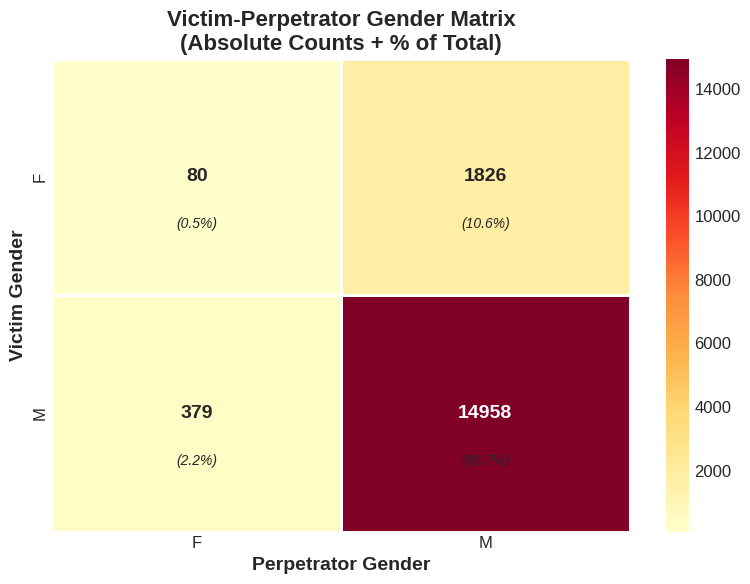

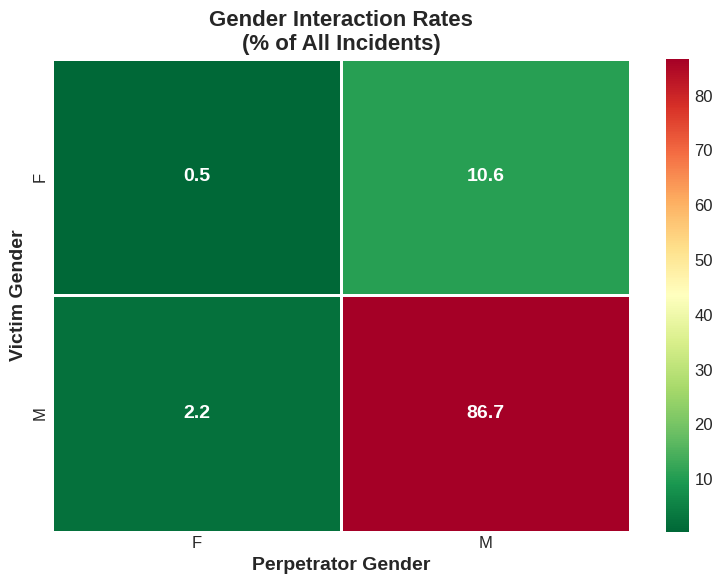

<Figure size 1000x600 with 0 Axes>

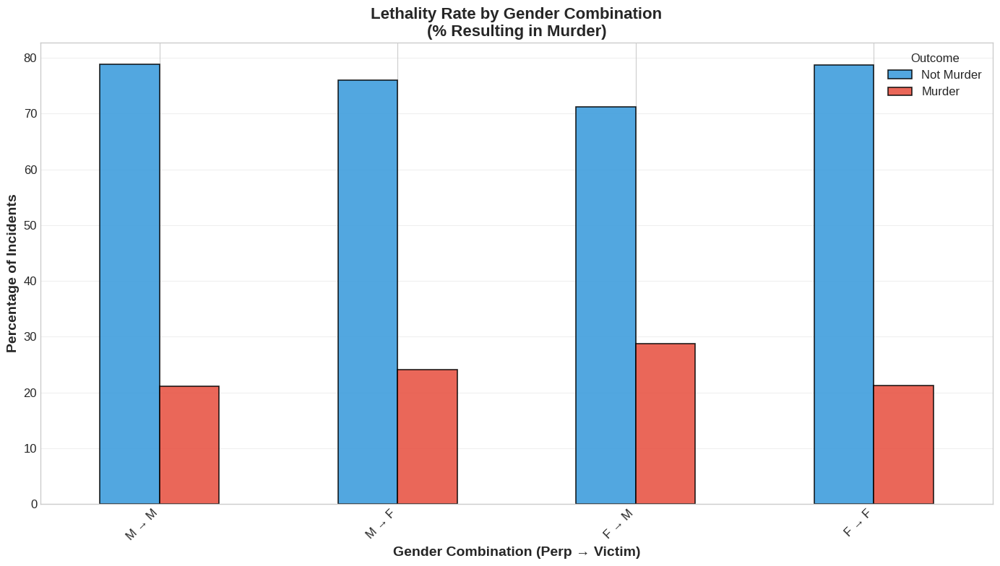

<Figure size 1200x700 with 0 Axes>

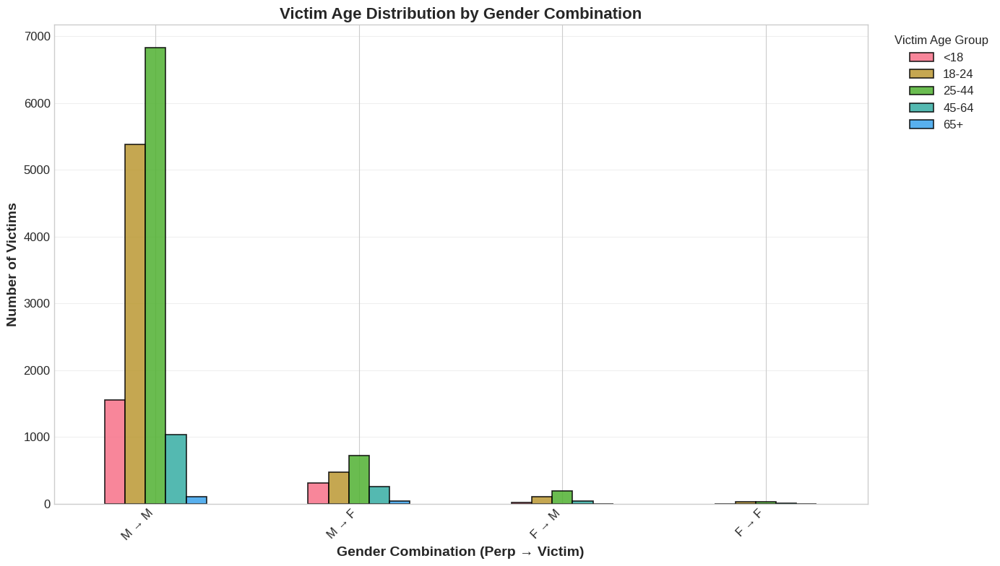


📊 STATISTICAL SUMMARY
  • M → M       : 14,958 incidents | 3,163 murders |  21.1% lethality
  • M → F       :  1,826 incidents |  439 murders |  24.0% lethality
  • F → M       :    379 incidents |  109 murders |  28.8% lethality
  • F → F       :     80 incidents |   17 murders |  21.2% lethality

🔍 Relative Risk (M→M vs M→F): 0.88x
   → Male-on-Female shootings are 1.14x more likely to be fatal.

✅ Gender cross-analysis complete!


In [63]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Styling
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

# =============================================================================
# 1. DATA LOADING & CLEANING
# =============================================================================

print("Loading NYPD shooting data...")
df = pd.read_csv('NYPD_cleaned.csv')
df['OCCUR_DATETIME'] = pd.to_datetime(df['OCCUR_DATETIME'])

def clean_gender(value):
    if pd.isna(value):
        return np.nan
    val_str = str(value).strip().upper()
    if val_str in ['M', 'MALE']:
        return 'M'
    elif val_str in ['F', 'FEMALE']:
        return 'F'
    else:
        return np.nan  # excludes 'UNKNOWN', 'U', etc.

# Clean gender columns
df['VIC_SEX_CLEAN'] = df['VIC_SEX'].apply(clean_gender)
df['PERP_SEX_CLEAN'] = df['PERP_SEX'].apply(clean_gender)

# Keep only rows where BOTH victim and perpetrator are M or F
df_clean = df.dropna(subset=['VIC_SEX_CLEAN', 'PERP_SEX_CLEAN']).copy()

# Create gender combination label
df_clean['GENDER_COMBO'] = (
    df_clean['PERP_SEX_CLEAN'] + " → " + df_clean['VIC_SEX_CLEAN']
)

print(f"\n📊 Initial records: {len(df):,}")
print(f"✅ Clean M/F records: {len(df_clean):,} ({len(df_clean)/len(df)*100:.1f}%)")

# Time & age features
df_clean['YEAR'] = df_clean['OCCUR_DATETIME'].dt.year
df_clean['VIC_AGE_GROUP_CLEAN'] = df_clean['VIC_AGE_GROUP'].replace({
    'UNKNOWN': np.nan, '(null)': np.nan, '': np.nan, 'Unknown': np.nan
})

# Ensure murder flag is boolean
df_clean['STATISTICAL_MURDER_FLAG'] = df_clean['STATISTICAL_MURDER_FLAG'].fillna(False).astype(bool)

# =============================================================================
# 2. PLOT 1: GENDER MATRIX (ABSOLUTE COUNTS)
# =============================================================================

# Crosstab
gender_matrix = pd.crosstab(
    df_clean['VIC_SEX_CLEAN'],
    df_clean['PERP_SEX_CLEAN']
)

plt.figure(figsize=(8, 6))
sns.heatmap(
    gender_matrix,
    annot=True,
    fmt='d',
    cmap='YlOrRd',
    linewidths=2,
    linecolor='white',
    annot_kws={'fontsize': 14, 'fontweight': 'bold'}
)

# Add percentages in parentheses
for i in range(gender_matrix.shape[0]):
    for j in range(gender_matrix.shape[1]):
        count = gender_matrix.iloc[i, j]
        pct = count / len(df_clean) * 100
        plt.text(j + 0.5, i + 0.7, f'({pct:.1f}%)',
                 ha='center', va='center', fontsize=10, style='italic')

plt.xlabel('Perpetrator Gender', fontweight='bold')
plt.ylabel('Victim Gender', fontweight='bold')
plt.title('Victim-Perpetrator Gender Matrix\n(Absolute Counts + % of Total)', fontweight='bold')
plt.tight_layout()
# plt.savefig('gender_matrix_counts.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# 3. PLOT 2: GENDER MATRIX (PERCENTAGES)
# =============================================================================

gender_matrix_pct = gender_matrix / len(df_clean) * 100

plt.figure(figsize=(8, 6))
sns.heatmap(
    gender_matrix_pct,
    annot=True,
    fmt='.1f',
    cmap='RdYlGn_r',
    linewidths=2,
    linecolor='white',
    annot_kws={'fontsize': 14, 'fontweight': 'bold'}
)

plt.xlabel('Perpetrator Gender', fontweight='bold')
plt.ylabel('Victim Gender', fontweight='bold')
plt.title('Gender Interaction Rates\n(% of All Incidents)', fontweight='bold')
plt.tight_layout()
# plt.savefig('gender_matrix_percent.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# 4. PLOT 3: LETHALITY (MURDER RATE) BY GENDER COMBINATION
# =============================================================================

# Group by gender combo and murder flag
murder_by_combo = df_clean.groupby(['GENDER_COMBO', 'STATISTICAL_MURDER_FLAG']).size().unstack(fill_value=0)
murder_by_combo_pct = murder_by_combo.div(murder_by_combo.sum(axis=1), axis=0) * 100

# Sort by total incidents for consistent order
combo_totals = df_clean['GENDER_COMBO'].value_counts()
murder_by_combo_pct = murder_by_combo_pct.reindex(combo_totals.index)

plt.figure(figsize=(10, 6))
ax = murder_by_combo_pct.plot(
    kind='bar',
    color=['#3498db', '#e74c3c'],
    alpha=0.85,
    edgecolor='black',
    linewidth=1.2
)

plt.xlabel('Gender Combination (Perp → Victim)', fontweight='bold')
plt.ylabel('Percentage of Incidents', fontweight='bold')
plt.title('Lethality Rate by Gender Combination\n(% Resulting in Murder)', fontweight='bold')
plt.legend(['Not Murder', 'Murder'], title='Outcome')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
# plt.savefig('lethality_by_gender_combo.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# 5. PLOT 4: VICTIM AGE DISTRIBUTION BY GENDER COMBINATION
# =============================================================================

# Define age order
age_order = ['<18', '18-24', '25-44', '45-64', '65+']

# Filter valid age groups
df_age = df_clean.dropna(subset=['VIC_AGE_GROUP_CLEAN'])
df_age = df_age[df_age['VIC_AGE_GROUP_CLEAN'].isin(age_order)]

# Crosstab: age group vs gender combo
age_gender = pd.crosstab(
    df_age['VIC_AGE_GROUP_CLEAN'],
    df_age['GENDER_COMBO']
).reindex(age_order, fill_value=0)

# Sort columns by total frequency
combo_order = df_clean['GENDER_COMBO'].value_counts().index
age_gender = age_gender[combo_order]

plt.figure(figsize=(12, 7))
age_gender.T.plot(
    kind='bar',
    stacked=False,
    alpha=0.85,
    edgecolor='black',
    linewidth=1.2
)

plt.xlabel('Gender Combination (Perp → Victim)', fontweight='bold')
plt.ylabel('Number of Victims', fontweight='bold')
plt.title('Victim Age Distribution by Gender Combination', fontweight='bold')
plt.legend(title='Victim Age Group', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
# plt.savefig('age_by_gender_combo.png', dpi=300, bbox_inches='tight')
plt.show()

# =============================================================================
# 6. STATISTICAL SUMMARY & RELATIVE RISK
# =============================================================================

print("\n" + "="*70)
print("📊 STATISTICAL SUMMARY")
print("="*70)

combo_counts = df_clean['GENDER_COMBO'].value_counts()
for combo in combo_counts.index:
    combo_df = df_clean[df_clean['GENDER_COMBO'] == combo]
    murders = combo_df['STATISTICAL_MURDER_FLAG'].sum()
    total = len(combo_df)
    rate = murders / total * 100
    print(f"  • {combo:12s}: {total:6,} incidents | {murders:4,} murders | {rate:5.1f}% lethality")

# Relative risk: M→M vs M→F (most common combos)
if 'M → M' in combo_counts.index and 'M → F' in combo_counts.index:
    mm_rate = df_clean[df_clean['GENDER_COMBO'] == 'M → M']['STATISTICAL_MURDER_FLAG'].mean()
    mf_rate = df_clean[df_clean['GENDER_COMBO'] == 'M → F']['STATISTICAL_MURDER_FLAG'].mean()
    
    if mf_rate > 0:
        rr = mm_rate / mf_rate
        print(f"\n🔍 Relative Risk (M→M vs M→F): {rr:.2f}x")
        if rr > 1:
            print(f"   → Male-on-Male shootings are {rr:.2f}x more likely to be fatal than Male-on-Female.")
        else:
            print(f"   → Male-on-Female shootings are {1/rr:.2f}x more likely to be fatal.")

print("\n✅ Gender cross-analysis complete!")

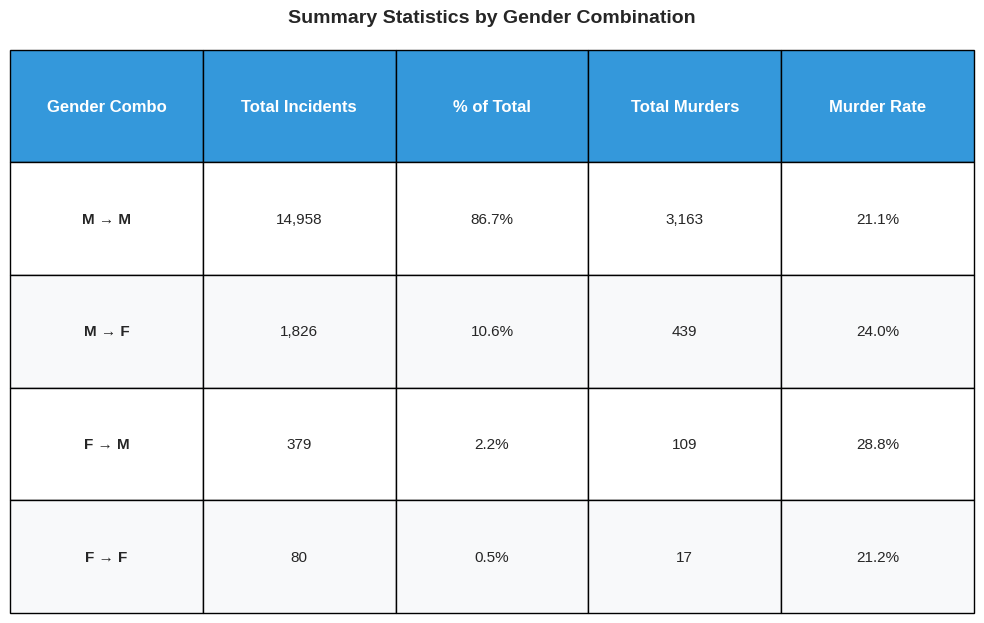

In [64]:
# =============================================================================
# 5. PLOT: SUMMARY STATISTICS TABLE (STANDALONE)
# =============================================================================

# Prepare summary data
combo_counts = df_clean['GENDER_COMBO'].value_counts()
summary_data = []
for combo in combo_counts.index:
    combo_df = df_clean[df_clean['GENDER_COMBO'] == combo]
    summary_data.append([
        combo,
        f"{len(combo_df):,}",
        f"{len(combo_df) / len(df_clean) * 100:.1f}%",
        f"{combo_df['STATISTICAL_MURDER_FLAG'].sum():,}",
        f"{combo_df['STATISTICAL_MURDER_FLAG'].mean() * 100:.1f}%"
    ])

summary_df = pd.DataFrame(summary_data, 
                         columns=['Gender Combo', 'Total Incidents', 
                                 '% of Total', 'Total Murders', 
                                 'Murder Rate'])

# Create standalone table plot
plt.figure(figsize=(10, 4 + len(summary_df) * 0.6))  # dynamic height
ax = plt.gca()
ax.axis('tight')
ax.axis('off')

# Create table
table = ax.table(
    cellText=summary_df.values,
    colLabels=summary_df.columns,
    cellLoc='center',
    loc='center',
    bbox=[0, 0, 1, 1]
)

# Style table
table.auto_set_font_size(False)
table.set_fontsize(11)
table.scale(1, 2.2)

# Header style
for j in range(len(summary_df.columns)):
    cell = table[(0, j)]
    cell.set_facecolor('#3498db')
    cell.set_text_props(weight='bold', color='white', fontsize=12)

# Row styling
for i in range(1, len(summary_df) + 1):
    for j in range(len(summary_df.columns)):
        cell = table[(i, j)]
        # Alternate row colors
        if i % 2 == 0:
            cell.set_facecolor('#f8f9fa')
        else:
            cell.set_facecolor('#ffffff')
        # Bold combo name
        if j == 0:
            cell.set_text_props(weight='bold')

plt.title('Summary Statistics by Gender Combination', 
          fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
# plt.savefig('gender_summary_table.png', dpi=300, bbox_inches='tight')
plt.show()